# Imports section

In [ ]:
import pandas as pd
import numpy as np
import scipy

# statistics
from scipy import stats
import statsmodels.api as sm

#data visualizations
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
#%matplotlib widget

#Machine learning library
import sklearn
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings("ignore")

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import r2_score, mean_squared_error, \
    mean_absolute_percentage_error,mean_absolute_error, accuracy_score

In [ ]:
# !pip install shap

# import shap

In [ ]:
!pip install kaggle

In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp kaggle.json ~/.kaggle

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive', force_remount=True)

# Histogarm Matching

Histogram matching algorithm (Matlab/Python): https://math-wiki.com/images/e/e9/89-560t2018-10-31.pdf, https://medium.com/hackernoon/histogram-equalization-in-python-from-scratch-ebb9c8aa3f23, https://stackoverflow.com/questions/32655686/histogram-matching-of-two-images-in-python-2-x

In [ ]:
def get_histogram_mapping(source, template):
    oldshape = source.shape
    source = source.ravel()
    template = template.ravel()

    # get the set of unique pixel values and their corresponding indices and
    # counts
    s_values, bin_idx, s_counts = np.unique(source, return_inverse=True,
                                            return_counts=True)
    t_values, t_counts = np.unique(template, return_counts=True)

    # take the cumsum of the counts and normalize by the number of pixels to
    # get the empirical cumulative distribution functions for the source and
    # template images (maps pixel value --> quantile)
    s_quantiles = np.cumsum(s_counts).astype(np.float64)
    s_quantiles /= s_quantiles[-1]
    t_quantiles = np.cumsum(t_counts).astype(np.float64)
    t_quantiles /= t_quantiles[-1]

    # interpolate linearly to find the pixel values in the template image
    # that correspond most closely to the quantiles in the source image
    interp_t_values = np.interp(s_quantiles, t_quantiles, t_values)
    return interp_t_values

In [ ]:
def apply_histogram_mapping(source, hist_mapping):
    oldshape = source.shape
    source = source.ravel()
    # get the set of unique pixel values and their corresponding indices and
    # counts
    s_values, bin_idx, s_counts = np.unique(source, return_inverse=True,
                                            return_counts=True)
    bin_idx = bin_idx.clip(0, hist_mapping.size - 1)

    return hist_mapping[bin_idx].reshape(oldshape)

In [ ]:
def histogram_matching(source, template):    
    mapping = get_histogram_mapping(source, template)
    return apply_histogram_mapping(source, mapping)

## Test the histogram equalization

We wanted to test the histogram matching algorithm on several random distribution.\
The results are shown below where the blue histograms are the original distributions and the orange are the distribution after normalization.\
Above each plot there is the P-value of KS-test of the normalized distribution, to see how well it matches a normal distribution.

In [ ]:
rnd = np.random

funcs = [rnd.power, rnd.lognormal, rnd.poisson, rnd.weibull, rnd.uniform, rnd.pareto, rnd.standard_t, rnd.dirichlet]

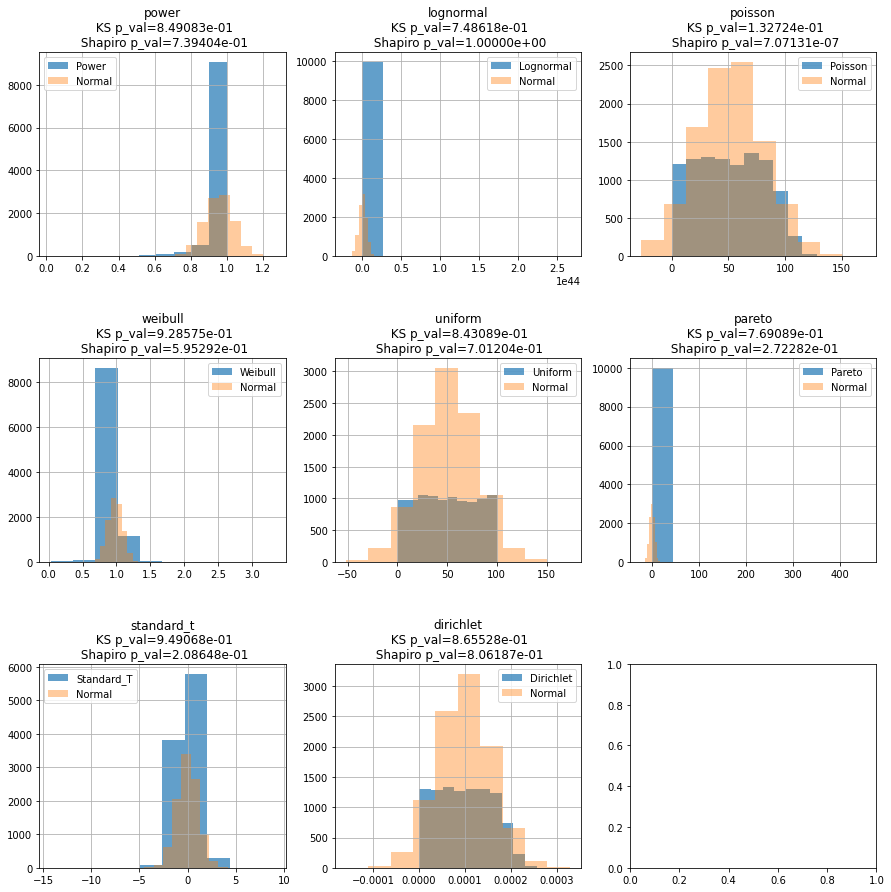

In [ ]:
n = len(funcs)
cols = 3
rows=(n//3) + 1 if n%3 !=0 else (n // 3)

#generate a figures grid:
fig, axes = plt.subplots(rows,cols,figsize=(cols*5,rows*5))
fig.subplots_adjust(hspace=0.5)

for i, func in enumerate(funcs):
    # simple example - from uniform to normal
    if func is not np.random.uniform:
        src_dist = func(np.random.uniform(1, 100, 10_000))
    else:
        src_dist = np.random.uniform(1, 100, 10_000)

    m, s = src_dist.mean(), src_dist.std()
    dst_dist = np.random.normal(m, s, 10_000)

    match = histogram_matching(src_dist, dst_dist)

    #calculate the current place on the grid
    r=int(i/cols)
    c=i%cols

    df = pd.DataFrame({f'{func.__name__}':src_dist, 'normal_match':match}, index=[np.zeros(10_000)])


    m,s = stats._continuous_distns.norm.fit(df['normal_match'])
    ks_res, ks_pval = scipy.stats.kstest(df['normal_match'].values,stats._continuous_distns.norm.cdf,args=(m,s))

    shapiro_res, shapiro_pval = stats.shapiro(df['normal_match'].values)
    # build the histograms

    df[f'{func.__name__}'].hist(alpha=0.7, ax=axes[r,c])
    df.normal_match.hist(alpha=0.4, ax=axes[r,c])
    axes[r,c].set_title(f'{func.__name__}\n KS p_val={ks_pval:.5e}\n Shapiro p_val={shapiro_pval:.5e}')
    axes[r,c].legend([f'{func.__name__.title()}', 'Normal'])

One of the most common examples is using the histogram matching algorithm in order to alter an image contrust.\
In this example, we took an image with low contrust and matched it to a unifom distribution in order to have better quality.

### Download example image

In [ ]:
!wget http://3.bp.blogspot.com/-SC-w7eTgpM0/URE9NsI_nuI/AAAAAAAAAGE/YmlWnimNuPM/s320/7957178556_001939ffc5_z.jpg -O ./image.jpg

--2022-03-06 09:46:31--  http://3.bp.blogspot.com/-SC-w7eTgpM0/URE9NsI_nuI/AAAAAAAAAGE/YmlWnimNuPM/s320/7957178556_001939ffc5_z.jpg
Resolving 3.bp.blogspot.com (3.bp.blogspot.com)... 74.125.20.132, 2607:f8b0:400e:c07::84
Connecting to 3.bp.blogspot.com (3.bp.blogspot.com)|74.125.20.132|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22102 (22K) [image/jpeg]
Saving to: ‘./image.jpg’

./image.jpg         100%[===================>]  21.58K  --.-KB/s    in 0s      

2022-03-06 09:46:32 (149 MB/s) - ‘./image.jpg’ saved [22102/22102]



### Example on images

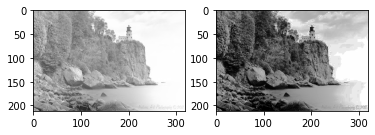

In [ ]:
from PIL import Image, ImageOps

# load the image
low_contrast_image = Image.open('./image.jpg')
low_contrast_image = ImageOps.grayscale(low_contrast_image)

low_contrast_image = np.array(low_contrast_image)

dst_dist = np.arange(0, 256)

image = histogram_matching(low_contrast_image, dst_dist)

fig, (ax1, ax2) = plt.subplots(1, 2)
# show low contrast image
ax1.imshow(low_contrast_image, cmap=plt.cm.gray)
# show image after histogram matching to uniform distribution
ax2.imshow(image, cmap=plt.cm.gray)

# Utils

In [ ]:
def match_to_normal_distribution(src_dist, mapping=None):

    new_mapping = mapping

    # try:
    if mapping is None:
        # get mean and std
        src_m, src_s = src_dist.mean(), src_dist.std()

        # generate a normal distribution vector with m and s
        dst_dist = np.random.normal(src_m, src_s, src_dist.size)
        dst_dist = np.array(dst_dist, dtype=np.float)

        new_mapping = get_histogram_mapping(source=src_dist, template=dst_dist)
    
    matched_dist = apply_histogram_mapping(src_dist, new_mapping)

    if mapping is None:
        return matched_dist, new_mapping
    return matched_dist

In [ ]:
def get_numeric_categorical_columns(df, target_columns, threshold_prec=5):
    numeric_columns = []
    categorical_columns = []

    for column in df.columns:
        categories = len(set(df[column]))
        prec_categories = (categories / len(df[column])) * 100
        
        if column not in target_columns:
            print(f'column: {column}, %: {prec_categories}')
            if prec_categories <= threshold_prec:
                categorical_columns.append(column)
            else:
                numeric_columns.append(column)

    print(f'numeric_columns = {numeric_columns}')
    print(f'categorical_columns = {categorical_columns}')

    return numeric_columns, categorical_columns

In [ ]:
def transform_dataset(src_df, transformation=match_to_normal_distribution, mapping=None, correction_threshold=0.95, correction=None):
    new_df = pd.DataFrame(index=src_df.index)
    new_mapping = dict() if mapping is None else mapping

    for column in src_df:
        dist = src_df[column].to_numpy()

        # If no mapping was provided
        if mapping is None:
            transformed_dist, new_column_mapping = transformation(dist)
            new_mapping[column] = new_column_mapping
        else:
            transformed_dist = transformation(dist, mapping[column])

        if correction:
            print(f'Correction: {column}')
            transformed_dist = correction(transformed_dist, dist)
            new_mapping[column] = correction(new_mapping[column], dist)

        new_df[column] = transformed_dist
    
    return new_df, new_mapping

In [ ]:
correction_func = lambda x, y: ((x - x.min()) * ((y.max() - y.min()) / (x.max() - x.min()))) + y.min()

In [ ]:
def compare_one_norm_column(regular_train_X, regular_test_X, regular_train_y,\
                            regular_test_y, matched_train_X, matched_test_X, \
                            yeo_train_X, yeo_test_X, target_column, numerical_columns,\
                            acc=False, **kwargs):
    if not acc:
        model = LinearRegression()
    else:
        if 'multi_class' in kwargs:
            model = LogisticRegression(multi_class=kwargs['multi_class'], solver=kwargs['solver'])
        else:
            model = LogisticRegression()

    prediction = model.fit(regular_train_X,regular_train_y).predict(regular_test_X)
    print('=== Measure for regular model: ===')
    
    if not acc:
        print(f'column={target_column}, r2={r2_score(regular_test_y,prediction)}')
    else:
        print(f'column={target_column}, acc={accuracy_score(regular_test_y,prediction)}')

    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(regular_test_y,prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(regular_test_y, prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(regular_test_y, prediction))))
    print('=' * 20)

    for norm_column in numerical_columns:
        print(f'\n=== Compare for column {norm_column} ===')
        norm_df_train_X = regular_train_X.drop(norm_column, axis=1)
        norm_df_train_X[norm_column] = matched_train_X[norm_column]

        norm_df_test_X = regular_test_X.drop(norm_column, axis=1)
        norm_df_test_X[norm_column] = matched_test_X[norm_column]

        yeo_norm_train_X = regular_train_X.drop(norm_column, axis=1)
        yeo_norm_train_X[norm_column] = yeo_train_X[norm_column]

        yeo_norm_test_X = regular_test_X.drop(norm_column, axis=1)
        yeo_norm_test_X[norm_column] = yeo_test_X[norm_column]

        if not acc:
            matched_model = LinearRegression()
            yeo_model = LinearRegression()
        else:
            if 'multi_class' in kwargs:
                matched_model = LogisticRegression(multi_class=kwargs['multi_class'], solver=kwargs['solver'])
                yeo_model = LogisticRegression(multi_class=kwargs['multi_class'], solver=kwargs['solver'])
            else:
                matched_model = LogisticRegression()
                yeo_model = LogisticRegression()

        matched_prediction = matched_model.fit(norm_df_train_X,regular_train_y).predict(norm_df_test_X)
        yeo_prediction = yeo_model.fit(yeo_norm_train_X,regular_train_y).predict(yeo_norm_test_X)

        if not acc:
            print(f'column={norm_column}, matched r2={r2_score(regular_test_y,matched_prediction)}')
            print(f'column={norm_column}, yeo r2={r2_score(regular_test_y,yeo_prediction)}')
        else:
            print(f'column={norm_column}, matched acc={accuracy_score(regular_test_y,matched_prediction)}')
            print(f'column={norm_column}, yeo acc={accuracy_score(regular_test_y,yeo_prediction)}')

    print('\n' + '=' * 50)

## Data proccessing

In [ ]:
# From: https://stackoverflow.com/a/45091961/11915280
from math import e

def get_entropy(df, base=None):
    ent = []
    for column in df.columns:
        value,counts = np.unique(df[column], return_counts=True)
        norm_counts = counts / counts.sum()
        base = e if base is None else base
        ent.append(-(norm_counts * np.log(norm_counts)/np.log(base)).sum())
    return np.array(ent)

In [ ]:
def get_insights(df):
    return pd.DataFrame([ i for i in zip(df.min(), df.max(), df.mean(), df.median(), df.std(), df.var(), df.skew(), df.kurtosis(), get_entropy(df))], 
                        index=df.columns,
                        columns=['min', 'max', 'mean', 'median', 'std', 'var', 'skew', 'kurtosis', 'entropy'])

In [ ]:
# def kl_divergence(p, q):
#     return np.sum(np.where(p != 0, p * np.log(p / q), 0))
from scipy.special import kl_div

def kl_divergence(df_p, df_q):
    dkl = []
    for column in df_p.columns:
        p_values,p_counts = np.unique(df_p[column], return_counts=True)
        q_values,q_counts = np.unique(df_q[column], return_counts=True)
        p = p_counts / p_counts.sum()
        q = q_counts / q_counts.sum()

        p_probs = np.zeros(max(p, q))
        q_probs = np.zeros(max(p, q))

        p_probs[p_values] = p_counts
        q_probs[q_values] = q_counts

        kl = kl_div(p, q)
        dkl.append(sum(kl))
        # dkl.append(np.sum(np.where(p != 0, p * np.log(p / q), 0)))
    return np.array(dkl)

In [ ]:
from scipy.stats import ks_2samp

def find_data_distribution(column_name: str, column):
    mean, std, size = column.mean(), column.std(), len(column)
    min, max = column.min(), column.max()
    dists = [rnd.normal, rnd.power, rnd.lognormal, rnd.poisson, rnd.weibull, rnd.uniform, rnd.pareto, rnd.standard_t, rnd.dirichlet]
    
    for dist in dists:
        # simple example - from uniform to normal
        target_dist = np.random.uniform(min, max, size)
        if dist is not np.random.uniform:
            target_dist = dist(target_dist)
        
        # statistic, p_value = ks_2samp(column, target_dist)

        # x = np.arange(min, max, float(min + max) / size)

        # target_dist = np.where(target_dist == np.NAN or target_dist == np.inf, self.clip_value, target_dist)

        combined_df = pd.DataFrame({
            f'{column_name}': column,
            f'{dist.__name__}': target_dist
        })
        # combined_df.plot(title=f'KL({column_name}||{dist.__name__})) = %1.3f' % kl_divergence(column, target_dist), kind='density')

        plot_numerical_histograms(combined_df, [f'{column_name}'])

        # column.plot.kde()

        # plt.scatter(column, target_dist)
        # plt.show()

        # plt.title(f'KL({column_name}||{dist.__name__})) = %1.3f' % kl_divergence(column, target_dist))
        # plt.plot(x, column)
        # plt.plot(x, target_dist, c='red')

## Plots

In [ ]:
def plot_histograms_side_by_side(df1, df2):
    cols = 2
    rows = df1.shape[1]

    fig, axes = plt.subplots(rows,cols,figsize=(cols * 5,rows * 5))
    fig.subplots_adjust(hspace=0.5)

    for row, column in enumerate(df1.columns):        
        # get the p_value of the KS test for the current column
        m1,s1 = stats._continuous_distns.norm.fit(df1[column])
        ks_res1, ks_pval1 = scipy.stats.kstest(df1[column].values,stats._continuous_distns.norm.cdf,args=(m1,s1))
        shapiro_res1, shapiro_pval1 = stats.shapiro(df1[column].values)

        # build the histograms
        df1[column].hist(ax=axes[row,0])
        axes[row,0].set_title(f'{column}\n KS p_val={ks_pval1:.5e}\n Shapiro p_val={shapiro_pval1:.5e}')

        # get the p_value of the KS test for the current column
        m2,s2 = stats._continuous_distns.norm.fit(df2[column])
        ks_res2, ks_pval2 = scipy.stats.kstest(df2[column].values,stats._continuous_distns.norm.cdf,args=(m2,s2))
        shapiro_res2, shapiro_pval2 = stats.shapiro(df2[column].values)

        # build the histograms
        df2[column].hist(ax=axes[row,1])
        axes[row,1].set_title(f'{column}\n KS p_val={ks_pval2:.5e}\n Shapiro p_val={shapiro_pval2}')

In [ ]:
def plot_numerical_histograms(df, numeric_columns):
    #we will create a histogram for each categorical attribute
    n=len(numeric_columns)
    cols = 3
    rows=(n//3) + 1 if n%3 !=0 else (n // 3)
    #max_bars = 8

    #generate a figures grid:
    fig, axes = plt.subplots(rows,cols,figsize=(cols*5,rows*5))
    fig.subplots_adjust(hspace=0.5)

    for i, column in enumerate(numeric_columns):
        #calculate the current place on the grid
        r=int(i/cols)
        c=i%cols
        
        # get the p_value of the KS test for the current column
        m,s = stats._continuous_distns.norm.fit(df[column])
        ks_res, ks_pval = scipy.stats.kstest(df[column].values,stats._continuous_distns.norm.cdf,args=(m,s))

        shapiro_res, shapiro_pval = stats.shapiro(df[column].values)

        # build the histograms
        df[column].hist(ax=axes[r,c])
        axes[r,c].set_title(f'{column}\n KS p_val={ks_pval:.5e}\n Shapiro p_val={shapiro_pval:.5e}')

In [ ]:
# def plot_histograms(df, numeric_columns):
#     #we will create a histogram for each categorical attribute
#     n=len(numeric_columns)
#     cols = 3
#     rows=(n//3) + 1 if n%3 !=0 else (n // 3)
#     #max_bars = 8

#     #generate a figures grid:
#     fig, axes = plt.subplots(rows,cols,figsize=(cols*5,rows*5))
#     fig.subplots_adjust(hspace=0.5)

#     for i, column in enumerate(numeric_columns):
#         #calculate the current place on the grid
#         r=int(i/cols)
#         c=i%cols
        
#         # get the p_value of the KS test for the current column
#         m,s = stats._continuous_distns.norm.fit(df[column])
#         res, pval = scipy.stats.kstest(df[column].values,stats._continuous_distns.norm.cdf,args=(m,s))

#         # build the histograms
#         df[column].hist(ax=axes[r,c])
#         axes[r,c].set_title(f'{column}, p_val={pval:.5e}')

In [ ]:
def qq_plot_data(df, numeric_columns):
    #we will create a histogram for each categorical attribute
    n=len(numeric_columns)
    cols = 3
    rows=(n//3) + 1 if n%3 !=0 else (n//3)
    #max_bars = 8

    #generate a figures grid:
    fig, axes = plt.subplots(rows,cols,figsize=(cols*5,rows*5))
    fig.subplots_adjust(hspace=0.5)



    for i, column in enumerate(numeric_columns):
        #calculate the current place on the grid
        r=int(i/cols)
        c=i%cols

        m = df[column].mean()
        s = df[column].std()
        
        # build the qqplots
        sm.qqplot(df[column].dropna(),loc=m,scale=s,line='r',ax=axes[r,c])
        axes[r,c].set_title(column)

In [ ]:
def plot_correlation_heatmaps(original_df, matched_df, yeo_df, columns):
    original_df_corr = original_df[columns].corr(method="pearson").loc[columns]
    matched_df_corr = matched_df[columns].corr(method="pearson").loc[columns]
    yeo_df_corr = yeo_df[columns].corr(method="pearson").loc[columns]

    fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(60, 60))
    sns.heatmap(original_df_corr, annot=True, fmt='.2f', cmap="YlGnBu", cbar=True, linewidths=0.5,ax=ax1)
    ax1.set_title('Original')
    sns.heatmap(matched_df_corr, annot=True, fmt='.2f', cmap="YlGnBu", cbar=True, linewidths=0.5,ax=ax2)
    ax2.set_title('Matched')
    sns.heatmap(yeo_df_corr, annot=True, fmt='.2f', cmap="YlGnBu", cbar=True, linewidths=0.5,ax=ax3)
    ax3.set_title('Yeo-Johnson')
    sns.heatmap(original_df_corr - matched_df_corr, annot=True, fmt='.2f', cmap="YlGnBu", cbar=True, linewidths=0.5,ax=ax4)
    ax4.set_title('Original-Matched Difference')
    sns.heatmap(original_df_corr - yeo_df_corr, annot=True, fmt='.2f', cmap="YlGnBu", cbar=True, linewidths=0.5,ax=ax5)
    ax5.set_title('Original-Yeo Difference')

In [ ]:
def plot_histograms(original, new, yeo):
    cols = 3
    n=len(original.columns)
    rows=(n//3) + 1 if n%3 !=0 else (n // 3)

    #generate a figures grid:
    fig, axes = plt.subplots(rows,cols,figsize=(cols*5,rows*5))
    fig.subplots_adjust(hspace=0.5)

    for i, (col1, col2, col3) in enumerate(zip(original, new, yeo)):
        #calculate the current place on the grid
        r=int(i/cols)
        c=i%cols

        collective_df = pd.DataFrame({
            'original': original[col1],
            'new': new[col2],
            'yeo': yeo[col3]
        })

        collective_df['original'].hist(alpha=1, ax=axes[r,c], color='red')
        collective_df['new'].hist(alpha=0.3, ax=axes[r,c], color='green')
        collective_df['yeo'].hist(alpha=0.3, ax=axes[r,c], color='blue')

        axes[r,c].set_title(f'{col1}')
        axes[r,c].legend(['original', 'new', 'yeo'])

# Try on first Dataset (Regression)

https://www.kaggle.com/wkirgsn/electric-motor-temperature

In [ ]:
!kaggle datasets download -d wkirgsn/electric-motor-temperature

 90% 105M/117M [00:01<00:00, 82.5MB/s] 
100% 117M/117M [00:01<00:00, 82.5MB/s]


In [ ]:
# !cp '/content/drive/MyDrive/Colab Notebooks/Tabular DS/measures_v2.csv.zip' -d './measures_v2.csv.zip'

In [ ]:
!unzip -n ./electric-motor-temperature.zip -d .
!rm -rf ./electric-motor-temperature.zip

Archive:  ./electric-motor-temperature.zip
  inflating: ./measures_v2.csv       


In [ ]:
# !unzip -n ./measures_v2.csv.zip -d .
# !rm -rf ./measures_v2.csv.zip

In [ ]:
measures_df = pd.read_csv('./measures_v2.csv')

In [ ]:
measures_df.describe()

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
count,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06
mean,5.427900e+01,3.622999e+01,6.634275e+01,-2.513381e+01,5.687858e+01,2.202081e+03,-6.871681e+01,3.741278e+01,5.850678e+01,4.818796e+01,2.456526e+01,3.110603e+01,4.079306e+01
std,4.417323e+01,2.178615e+01,2.867206e+01,6.309197e+01,2.295223e+01,1.859663e+03,6.493323e+01,9.218188e+01,1.900150e+01,1.999100e+01,1.929522e+00,7.713575e+01,2.504549e+01
min,-2.529093e+01,1.062375e+01,1.858582e+01,-1.315304e+02,1.813398e+01,-2.755491e+02,-2.780036e+02,-2.934268e+02,2.085696e+01,1.807669e+01,8.783478e+00,-2.464667e+02,2.000000e+00
25%,1.206992e+01,1.869814e+01,4.278796e+01,-7.869090e+01,3.841601e+01,3.171107e+02,-1.154061e+02,1.095863e+00,4.315158e+01,3.199033e+01,2.318480e+01,-1.374265e-01,1.700000e+01
50%,4.893818e+01,2.690014e+01,6.511013e+01,-7.429755e+00,5.603635e+01,1.999977e+03,-5.109376e+01,1.577401e+01,6.026629e+01,4.562551e+01,2.479733e+01,1.086035e+01,4.300000e+01
75%,9.003439e+01,4.985749e+01,8.814114e+01,1.470271e+00,7.558668e+01,3.760639e+03,-2.979688e+00,1.006121e+02,7.200837e+01,6.146083e+01,2.621702e+01,9.159718e+01,6.500000e+01
max,1.330370e+02,1.015985e+02,1.413629e+02,1.314698e+02,1.119464e+02,6.000015e+03,5.189670e-02,3.017079e+02,1.136066e+02,1.011480e+02,3.071420e+01,2.610057e+02,8.100000e+01


In [ ]:
print(measures_df.shape)
measures_df.head()

(1330816, 13)


,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
0,-0.450682,18.805172,19.086670,-0.350055,18.293219,0.002866,0.004419,0.000328,24.554214,18.316547,19.850691,0.187101,17
1,-0.325737,18.818571,19.092390,-0.305803,18.294807,0.000257,0.000606,-0.000785,24.538078,18.314955,19.850672,0.245417,17
2,-0.440864,18.828770,19.089380,-0.372503,18.294094,0.002355,0.001290,0.000386,24.544693,18.326307,19.850657,0.176615,17
3,-0.327026,18.835567,19.083031,-0.316199,18.292542,0.006105,0.000026,0.002046,24.554018,18.330833,19.850647,0.238303,17
4,-0.471150,18.857033,19.082525,-0.332272,18.291428,0.003133,-0.064317,0.037184,24.565397,18.326662,19.850639,0.208197,17


In [ ]:
measures_test_df = measures_df.loc[measures_df['profile_id'].isin([65, 72])].drop('profile_id', axis=1)
measures_train_df = measures_df.loc[~measures_df['profile_id'].isin([65, 72])].drop('profile_id', axis=1)

In [ ]:
print(measures_train_df.shape)
print(measures_test_df.shape)

(1275421, 12)
(55395, 12)


In [ ]:
measures_train_df_X, measures_train_df_y = measures_train_df[['u_q', 'coolant', 'u_d', 'motor_speed', 'i_d', 'i_q', 'ambient', 'torque']], measures_train_df[['stator_yoke', 'stator_winding', 'stator_tooth', 'pm']]

In [ ]:
print(measures_train_df_X.shape)
print(measures_train_df_y.shape)

(1275421, 8)
(1275421, 4)


In [ ]:
measures_test_df_X, measures_test_df_y = measures_test_df[['u_q', 'coolant', 'u_d', 'motor_speed', 'i_d', 'i_q', 'ambient', 'torque']], measures_test_df[['stator_yoke', 'stator_winding', 'stator_tooth', 'pm']]

In [ ]:
print(measures_test_df_X.shape)
print(measures_test_df_y.shape)

(55395, 8)
(55395, 4)


### Visualize histograms of features

In [ ]:
measures_numeric_columns = measures_train_df_X.dtypes[(measures_train_df_X.dtypes=="float64") | (measures_train_df_X.dtypes=="int64")].index.tolist()

In [ ]:
measures_numeric_columns, measures_categorical_columns = get_numeric_categorical_columns(measures_train_df_X, ['profile_id'])

column: u_q, %: 95.3708618565948
column: coolant, %: 83.24388574439342
column: u_d, %: 97.25282867382613
column: motor_speed, %: 56.62208792234094
column: i_d, %: 77.78576642536072
column: i_q, %: 76.01795799191012
column: ambient, %: 89.76486979593405
column: torque, %: 87.38659626899667
numeric_columns = ['u_q', 'coolant', 'u_d', 'motor_speed', 'i_d', 'i_q', 'ambient', 'torque']
categorical_columns = []


In [ ]:
len(measures_train_df_X)

1275421

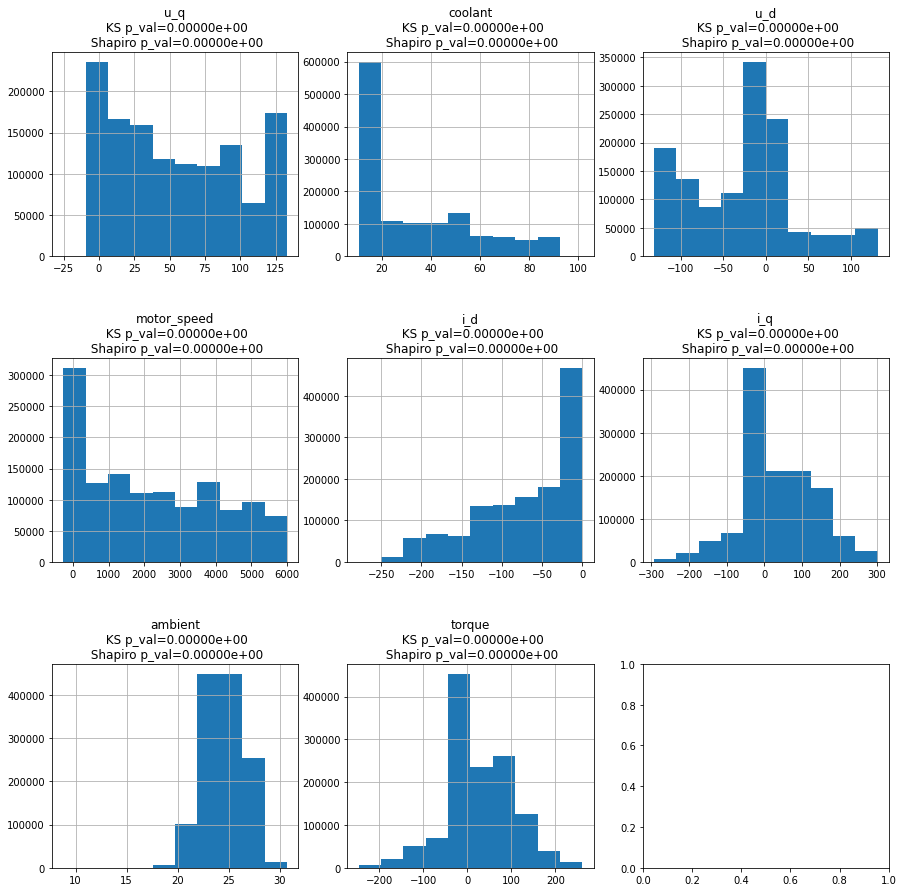

In [ ]:
plot_numerical_histograms(measures_train_df_X, measures_numeric_columns)

### Compare Histogram-Matching to Yeo-Johnson

Correction: u_q
Correction: coolant
Correction: u_d
Correction: motor_speed
Correction: i_d
Correction: i_q
Correction: ambient
Correction: torque


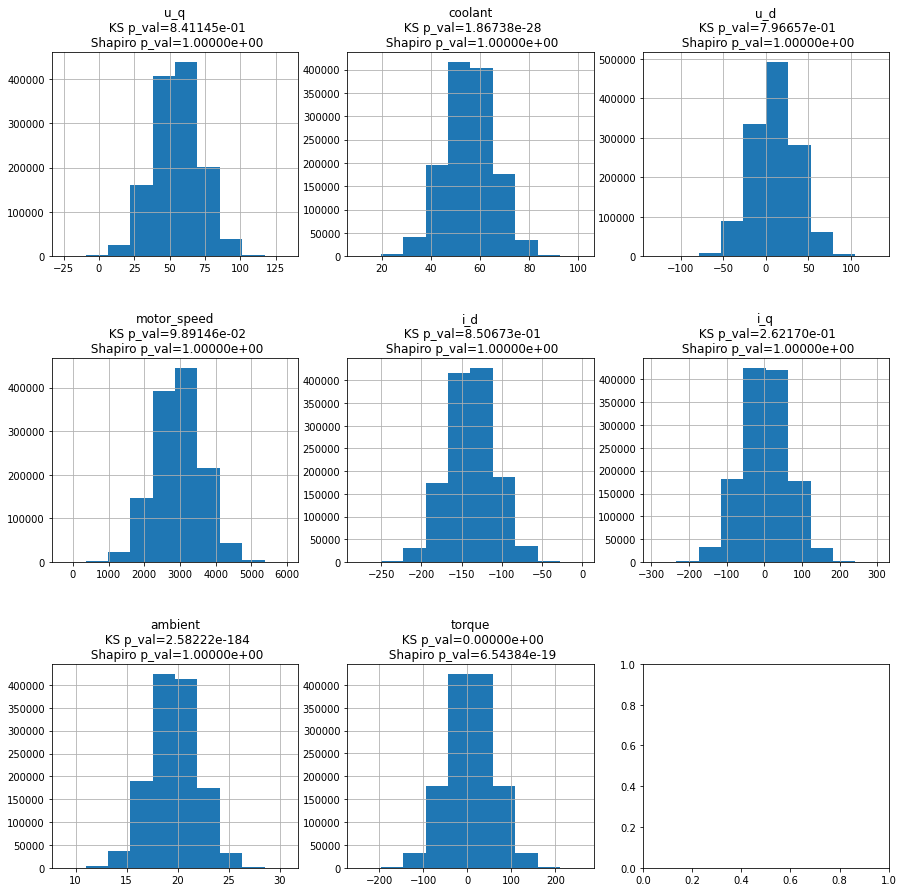

In [ ]:
matched_measures_train_df_X, train_df_X_normal_mapping = transform_dataset(measures_train_df_X,\
                                                                           match_to_normal_distribution,
                                                                           correction=correction_func
                                                                           )

matched_measures_train_df_X_not, train_df_X_normal_mapping_not = transform_dataset(measures_train_df_X,\
                                                                           match_to_normal_distribution
                                                                           )

plot_numerical_histograms(matched_measures_train_df_X, measures_numeric_columns)

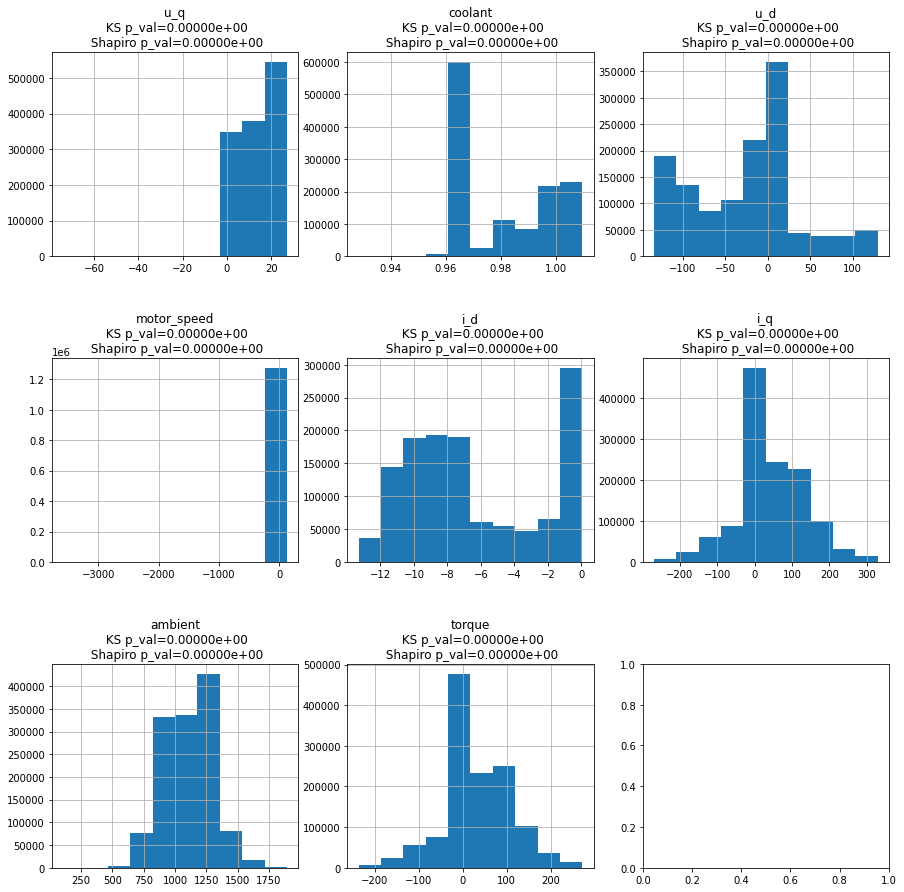

In [ ]:
yeo_measures_train_df_X, train_df_X_yeo_mapping = transform_dataset(measures_train_df_X, stats.yeojohnson)
plot_numerical_histograms(yeo_measures_train_df_X, measures_numeric_columns)

#### Match test set X

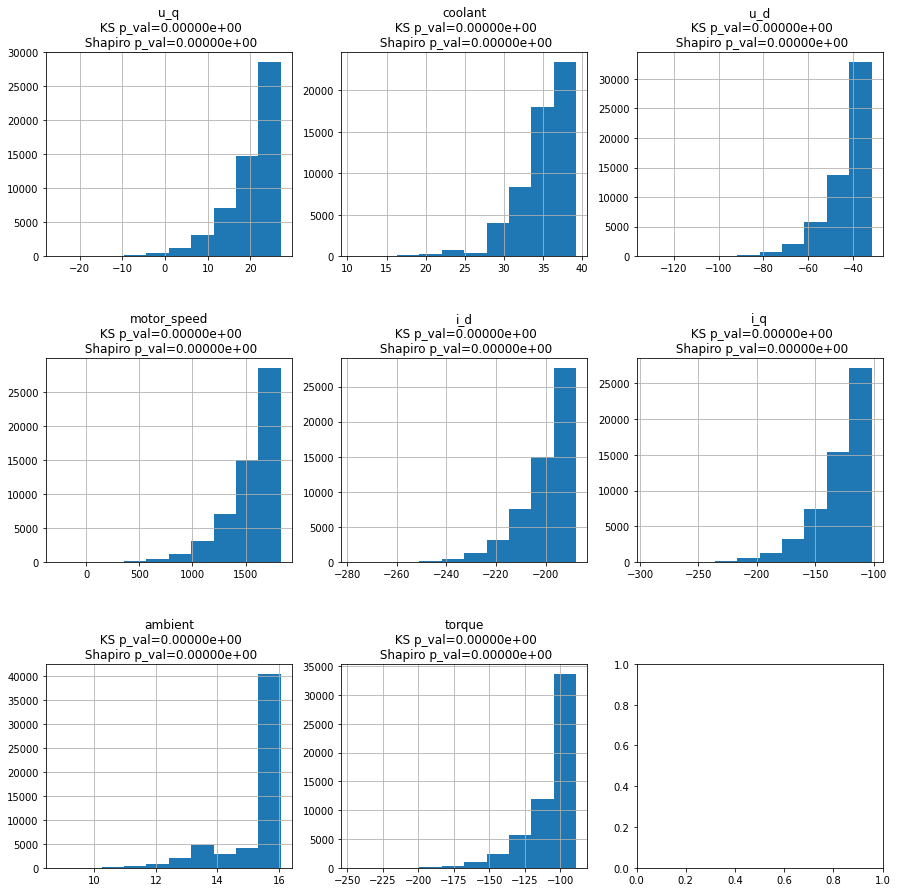

In [ ]:
matched_measures_test_df_X, _ = transform_dataset(measures_test_df_X,\
                                                  match_to_normal_distribution,\
                                                  mapping=train_df_X_normal_mapping)
plot_numerical_histograms(matched_measures_test_df_X, measures_numeric_columns)

In [ ]:
yeo_measures_test_df_X, _ = transform_dataset(measures_test_df_X, stats.yeojohnson, mapping=train_df_X_yeo_mapping)

## QQ plots of features

### QQ plots for regular features

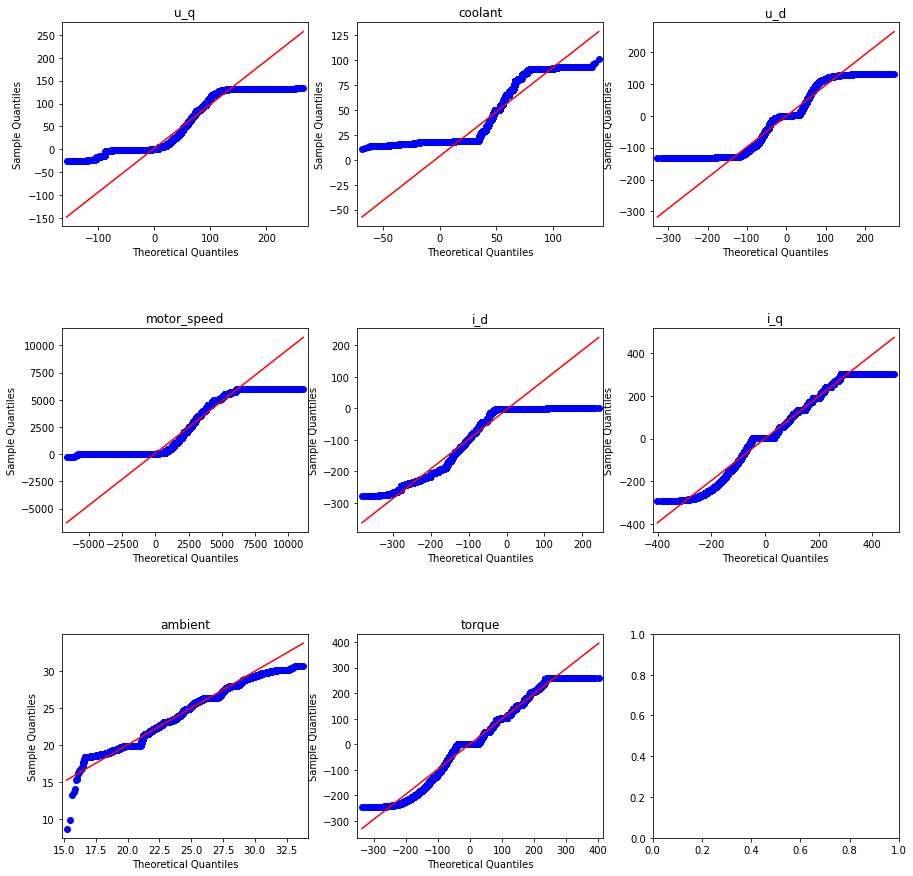

In [ ]:
qq_plot_data(measures_train_df_X, measures_numeric_columns)

### QQ plots for Matched features

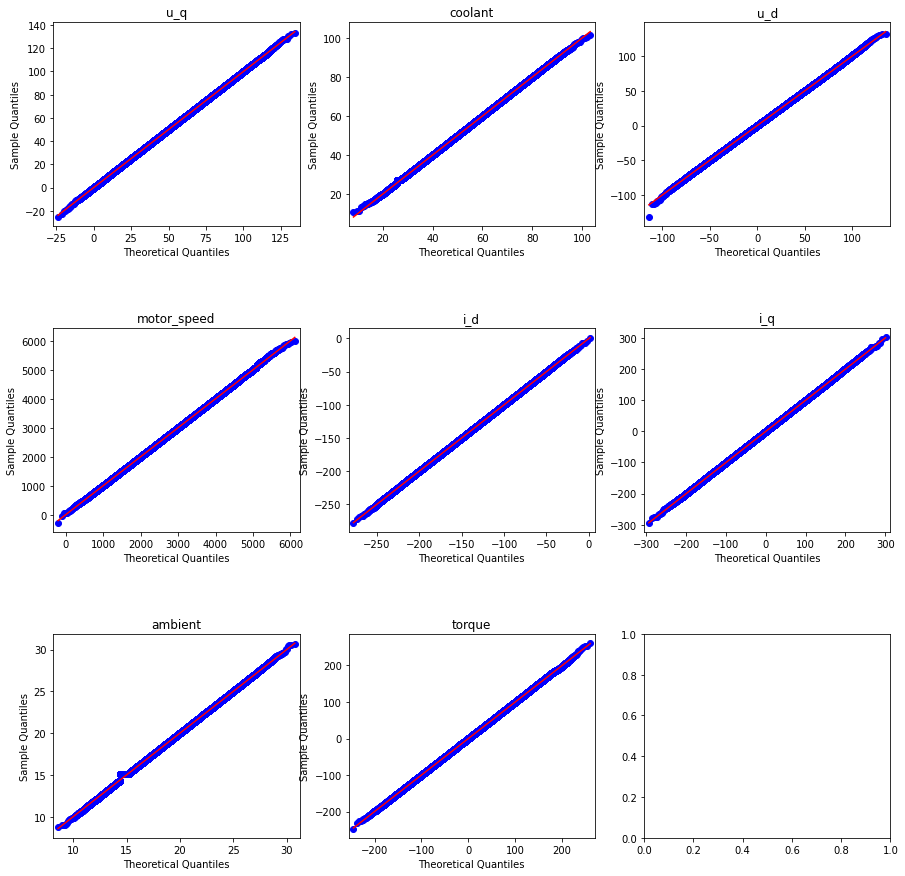

In [ ]:
qq_plot_data(matched_measures_train_df_X, measures_numeric_columns)

### QQ plots for Yeo-Johnson features

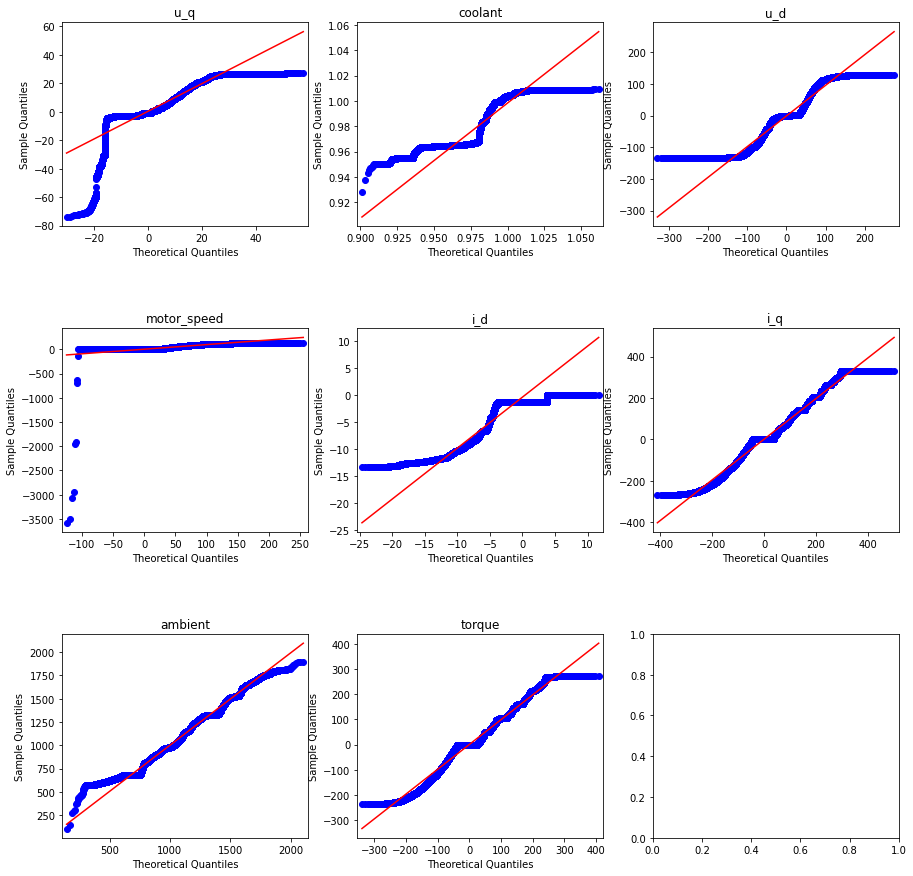

In [ ]:
qq_plot_data(yeo_measures_train_df_X, measures_numeric_columns)

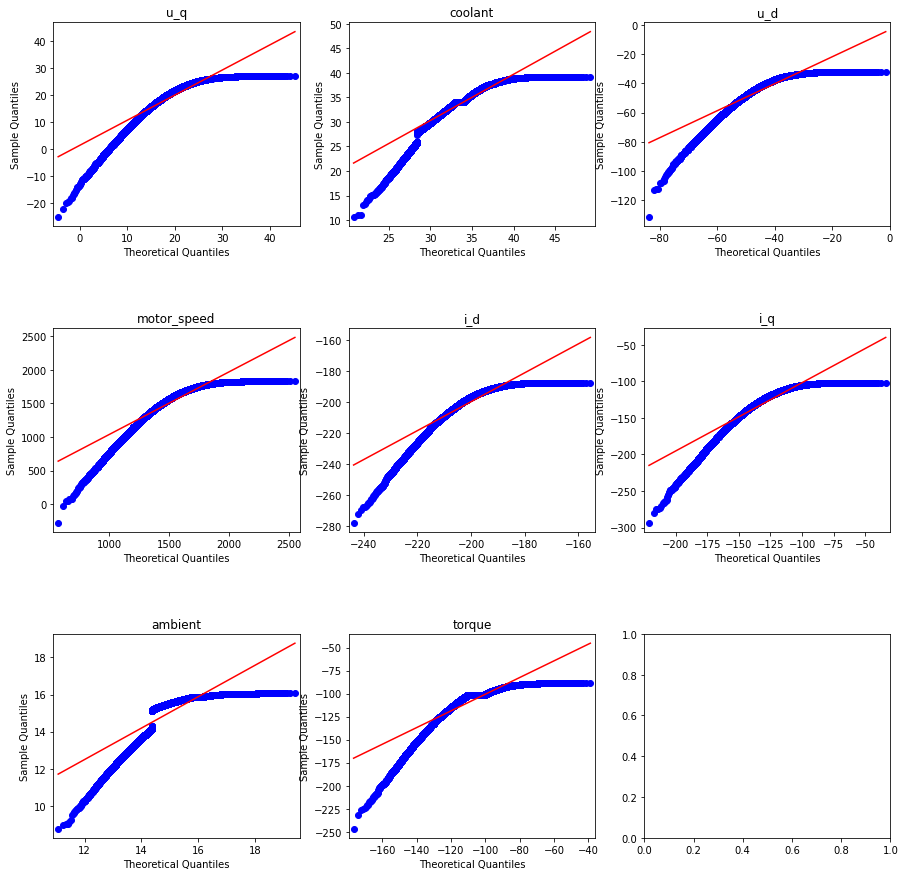

In [ ]:
qq_plot_data(matched_measures_test_df_X, measures_numeric_columns)

## Compare model preformance

### Test on regular data

In [ ]:
for column in measures_test_df_y:
    model = LinearRegression()
    prediction = model.fit(measures_train_df_X,measures_train_df_y[column]).predict(measures_test_df_X)
    print(f'column={column}, r2={r2_score(measures_test_df_y[column],prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(measures_test_df_y[column],prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(measures_test_df_y[column], prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(measures_test_df_y[column], prediction))))
    print('=' * 50)

column=stator_yoke, r2=0.8157037365081543
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.126
Mean Absolute Error (Σ|y - pred|/n): 6
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 8
column=stator_winding, r2=0.5806161453601705
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.215
Mean Absolute Error (Σ|y - pred|/n): 13
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 17
column=stator_tooth, r2=0.6648058996604784
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.178
Mean Absolute Error (Σ|y - pred|/n): 10
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 12
column=pm, r2=0.2822513736271022
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.170
Mean Absolute Error (Σ|y - pred|/n): 10
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 12


### Test on matched data

In [ ]:
for column in measures_test_df_y:
    matched_model = LinearRegression()
    matched_prediction = matched_model.fit(matched_measures_train_df_X,measures_train_df_y[column]).predict(matched_measures_test_df_X)
    print(f'column={column}, r2={r2_score(measures_test_df_y[column], matched_prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(measures_test_df_y[column],matched_prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(measures_test_df_y[column], matched_prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(measures_test_df_y[column], matched_prediction))))
    print('=' * 50)

column=stator_yoke, r2=-3.4266459755165632
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.627
Mean Absolute Error (Σ|y - pred|/n): 36
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 38
column=stator_winding, r2=0.16753425468362837
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.285
Mean Absolute Error (Σ|y - pred|/n): 20
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 24
column=stator_tooth, r2=-0.7209181712734998
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.304
Mean Absolute Error (Σ|y - pred|/n): 22
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 28
column=pm, r2=0.20803732752838533
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.186
Mean Absolute Error (Σ|y - pred|/n): 11
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 13


### Test on Yeo-Johnson data

In [ ]:
for column in measures_test_df_y:
    yeo_model = LinearRegression()
    yeo_prediction = yeo_model.fit(yeo_measures_train_df_X,measures_train_df_y[column]).predict(yeo_measures_test_df_X)
    print(f'column={column}, r2={r2_score(measures_test_df_y[column], yeo_prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(measures_test_df_y[column],yeo_prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(measures_test_df_y[column], yeo_prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(measures_test_df_y[column], yeo_prediction))))
    print('=' * 50)

column=stator_yoke, r2=0.6276056241298331
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.201
Mean Absolute Error (Σ|y - pred|/n): 10
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 11
column=stator_winding, r2=0.5092807186142274
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.254
Mean Absolute Error (Σ|y - pred|/n): 15
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 18
column=stator_tooth, r2=0.5503797537621024
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.225
Mean Absolute Error (Σ|y - pred|/n): 12
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 14
column=pm, r2=0.3229405128920547
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.167
Mean Absolute Error (Σ|y - pred|/n): 9
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 12


## Try to normalize only 1 column at a time and Compare to regular model

In [ ]:
for column in measures_test_df_y:   
    compare_one_norm_column(measures_train_df_X, measures_test_df_X, measures_train_df_y[column], \
                            measures_test_df_y[column], matched_measures_train_df_X, \
                            matched_measures_test_df_X, yeo_measures_train_df_X, yeo_measures_test_df_X,\
                            column, measures_numeric_columns)

=== Measure for regular model: ===
column=stator_yoke, r2=0.8157037365081543
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.126
Mean Absolute Error (Σ|y - pred|/n): 6
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 8

=== Compare for column u_q ===
column=u_q, matched r2=0.8134080713065859
column=u_q, yeo r2=0.8156448286699057

=== Compare for column coolant ===
column=coolant, matched r2=-3.668166577425593
column=coolant, yeo r2=0.6018165773800623

=== Compare for column u_d ===
column=u_d, matched r2=0.7435284907269273
column=u_d, yeo r2=0.8157464061540274

=== Compare for column motor_speed ===
column=motor_speed, matched r2=0.8192778653339461
column=motor_speed, yeo r2=0.8154367659234811

=== Compare for column i_d ===
column=i_d, matched r2=0.30850052325619914
column=i_d, yeo r2=0.8219467140679425

=== Compare for column i_q ===
column=i_q, matched r2=0.8259901872118665
column=i_q, yeo r2=0.8169902947397295

=== Compare for column ambient ===
column=ambient, matched r2=0.7655955

## Get insights about the data

In [ ]:
measures_insights = get_insights(measures_train_df_X[measures_numeric_columns])
measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,-25.290930,133.036994,54.672782,49.121655,44.017220,1.937516e+03,0.309313,-1.239211,13.983263
coolant,10.623751,101.598512,35.739074,24.507384,21.773772,4.740972e+02,1.088849,-0.021891,13.674890
u_d,-131.530411,131.469788,-26.654494,-7.612911,62.633535,3.922960e+03,0.151665,-0.283908,14.018684
motor_speed,-275.549144,6000.015137,2213.149549,1999.977173,1853.909143,3.436979e+06,0.387876,-1.137312,12.037969
i_d,-278.003632,0.051897,-69.151568,-52.044140,65.000795,4.225103e+03,-0.708554,-0.558587,13.373278
i_q,-293.426793,301.707855,39.616075,21.105413,91.906337,8.446775e+03,-0.156577,0.685779,13.150222
ambient,8.783478,30.714205,24.506731,24.755806,1.938694,3.758534e+00,-0.306136,-0.162134,13.715699
torque,-246.466663,261.005707,32.968623,16.273051,76.860488,5.907535e+03,-0.135584,0.681981,13.175017


In [ ]:
matched_measures_insights = get_insights(matched_measures_train_df_X[measures_numeric_columns])
matched_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,-25.290930,133.036994,55.260147,55.253550,16.456209,270.806805,-0.000382,0.004359,13.983263
coolant,10.623751,101.598512,55.722506,55.718772,9.885962,97.732237,0.002617,-0.016969,13.674890
u_d,-131.530411,131.469788,10.598638,10.590323,25.947496,673.272545,-0.001423,0.003597,14.018684
motor_speed,-275.549144,6000.015137,2956.541554,2956.419687,657.490843,432294.208412,0.004085,0.008163,12.037969
i_d,-278.003632,0.051897,-138.114556,-138.108577,29.086038,845.997597,0.001060,0.000337,13.373278
i_q,-293.426793,301.707855,3.599889,3.528482,61.893610,3830.818969,0.002968,-0.001423,13.150222
ambient,8.783478,30.714205,19.673368,19.668680,2.308023,5.326969,0.017633,-0.013482,13.715699
torque,-246.466663,261.005707,7.466466,7.340028,52.556059,2762.139336,0.000811,0.006852,13.175017


In [ ]:
matched_not_measures_insights = get_insights(matched_measures_train_df_X_not[measures_numeric_columns])
matched_not_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,-181.976195,289.252986,54.649925,54.628756,44.066015,1.941814e+03,0.000620,0.003569,13.983263
coolant,-67.404967,138.995677,35.741603,35.751981,21.782418,4.744737e+02,0.002240,-0.009183,13.674890
u_d,-331.748593,257.454966,-26.596598,-26.619944,62.701057,3.931423e+03,0.000402,0.002996,14.018684
motor_speed,-6316.291359,10892.350959,2213.703466,2213.821862,1854.456137,3.439008e+06,-0.000795,0.001114,12.037969
i_d,-401.454051,268.123561,-69.133048,-69.125341,64.987239,4.223341e+03,0.001183,-0.008033,13.373278
i_q,-425.938860,486.338274,39.762452,39.750877,91.966702,8.457874e+03,0.001837,-0.000901,13.150222
ambient,14.561128,33.462978,24.509675,24.505413,1.929182,3.721742e+00,0.021640,-0.020507,13.715699
torque,-342.488494,407.014630,33.095116,33.106445,76.875700,5.909873e+03,-0.008545,0.010504,13.175017


In [ ]:
yeo_measures_insights = get_insights(yeo_measures_train_df_X[measures_numeric_columns])
yeo_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,-73.898398,27.052662,13.700576,14.659157,9.156518,83.841823,-0.371198,0.048266,13.983263
coolant,0.928289,1.009609,0.981466,0.977824,0.016752,0.000281,0.296149,-1.596986,13.667813
u_d,-133.565361,129.468607,-27.331076,-7.655808,62.979182,3966.377425,0.113435,-0.333258,14.018684
motor_speed,-3578.756002,123.829657,65.353999,73.138826,39.515984,1561.512985,-2.466310,175.475974,12.037969
i_d,-13.306719,0.052873,-6.477371,-7.142497,3.788179,14.350299,0.218281,-1.394630,13.373278
i_q,-268.876813,329.524340,44.884537,22.006636,94.726074,8973.029056,0.091339,0.445453,13.150222
ambient,106.880880,1894.280258,1124.088623,1139.542298,204.013217,41621.392704,-0.021229,-0.301041,13.715699
torque,-236.648719,271.990202,34.973780,16.571677,77.878065,6064.993065,-0.018096,0.564177,12.323850


In [ ]:
measures_insights - matched_not_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,156.685265,-156.215993,0.022857,-5.507102,-0.048795,-4.298031,0.308693,-1.242779,0.0
coolant,78.028718,-37.397165,-0.002529,-11.244597,-0.008646,-0.376579,1.086608,-0.012708,0.0
u_d,200.218182,-125.985178,-0.057896,19.007033,-0.067522,-8.462829,0.151263,-0.286904,0.0
motor_speed,6040.742215,-4892.335822,-0.553916,-213.844690,-0.546994,-2028.453030,0.388671,-1.138426,0.0
i_d,123.450419,-268.071665,-0.018520,17.081201,0.013556,1.762085,-0.709738,-0.550554,0.0
i_q,132.512067,-184.630418,-0.146378,-18.645464,-0.060365,-11.099462,-0.158414,0.686680,0.0
ambient,-5.777650,-2.748773,-0.002944,0.250393,0.009512,0.036792,-0.327776,-0.141627,0.0
torque,96.021831,-146.008923,-0.126492,-16.833394,-0.015212,-2.338631,-0.127039,0.671476,0.0


In [ ]:
measures_insights - matched_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,0.0,0.000000e+00,-0.587365,-6.131895,27.561011,1.666709e+03,0.309695,-1.243570,0.0
coolant,0.0,0.000000e+00,-19.983432,-31.211387,11.887811,3.763649e+02,1.086232,-0.004922,0.0
u_d,0.0,0.000000e+00,-37.253132,-18.203234,36.686039,3.249687e+03,0.153088,-0.287506,0.0
motor_speed,0.0,0.000000e+00,-743.392005,-956.442514,1196.418300,3.004685e+06,0.383791,-1.145475,0.0
i_d,0.0,-5.551115e-17,68.962988,86.064437,35.914757,3.379106e+03,-0.709614,-0.558924,0.0
i_q,0.0,5.684342e-14,36.016186,17.576930,30.012727,4.615956e+03,-0.159545,0.687202,0.0
ambient,0.0,0.000000e+00,4.833363,5.087126,-0.369329,-1.568435e+00,-0.323769,-0.148652,0.0
torque,0.0,5.684342e-14,25.502158,8.933023,24.304429,3.145395e+03,-0.136394,0.675128,0.0


In [ ]:
measures_insights - yeo_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,48.607468,105.984332,40.972206,34.462497,34.860702,1.853674e+03,0.680512,-1.287477,0.000000
coolant,9.695462,100.588903,34.757608,23.529560,21.757020,4.740969e+02,0.792700,1.575095,0.007077
u_d,2.034951,2.001181,0.676582,0.042897,-0.345647,-4.341770e+01,0.038231,0.049349,0.000000
motor_speed,3303.206858,5876.185480,2147.795551,1926.838347,1814.393159,3.435418e+06,2.854186,-176.613285,0.000000
i_d,-264.696912,-0.000977,-62.674197,-44.901643,61.212616,4.210753e+03,-0.926836,0.836043,0.000000
i_q,-24.549980,-27.816485,-5.268463,-0.901223,-2.819737,-5.262543e+02,-0.247916,0.240326,0.000000
ambient,-98.097402,-1863.566053,-1099.581892,-1114.786492,-202.074523,-4.161763e+04,-0.284907,0.138907,0.000000
torque,-9.817944,-10.984495,-2.005157,-0.298626,-1.017578,-1.574585e+02,-0.117487,0.117803,0.851167


## Plot distirbutions

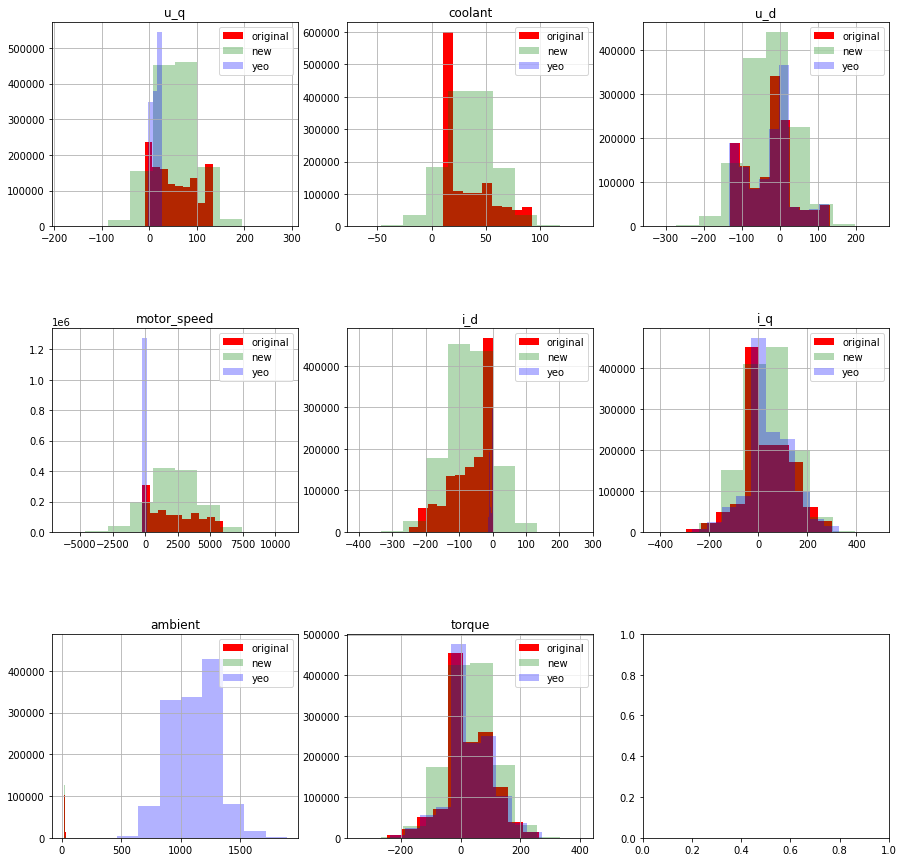

In [ ]:
plot_histograms(measures_train_df_X[measures_numeric_columns], 
                matched_measures_train_df_X_not[measures_numeric_columns], 
                yeo_measures_train_df_X[measures_numeric_columns])

## Plot a Heatmap of all columns to targets

In [ ]:
matched_measures_df_corr = pd.concat([matched_measures_train_df_X, measures_train_df_y], axis=1)
matched_measures_df_corr_not = pd.concat([matched_measures_train_df_X_not, measures_train_df_y], axis=1)
yeo_measures_df_corr = pd.concat([yeo_measures_train_df_X, measures_train_df_y], axis=1)

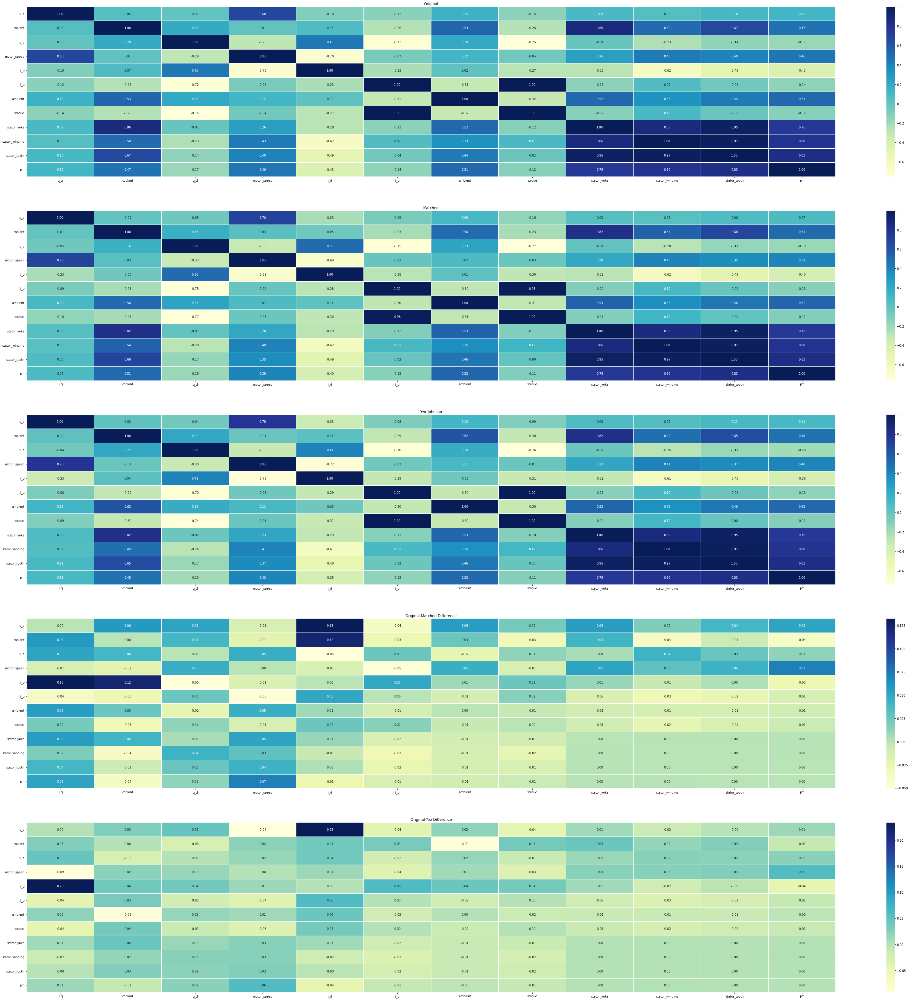

In [ ]:
plot_correlation_heatmaps(measures_df, matched_measures_df_corr, yeo_measures_df_corr,\
                          measures_numeric_columns + ['stator_yoke', 'stator_winding', 'stator_tooth', 'pm'])

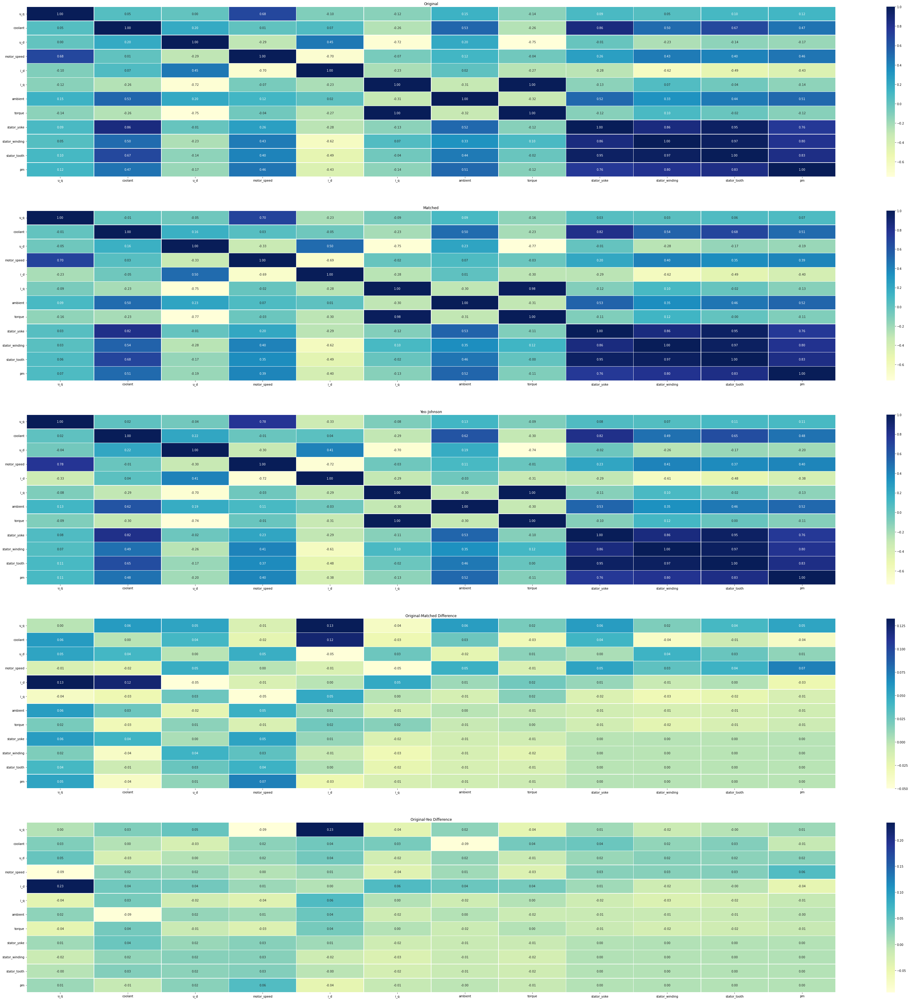

In [ ]:
plot_correlation_heatmaps(measures_df, matched_measures_df_corr_not, yeo_measures_df_corr,\
                          measures_numeric_columns + ['stator_yoke', 'stator_winding', 'stator_tooth', 'pm'])

In [ ]:
for column in measures_train_df_y.columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_measures_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_measures_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: stator_yoke ===============
matched corr sum: 5.678861074295586
yeo corr sum: 5.759830481058777
=============== Compare sum of corr for target column: stator_winding ===============
matched corr sum: 6.058121744479972
yeo corr sum: 6.01196858522478
=============== Compare sum of corr for target column: stator_tooth ===============
matched corr sum: 5.995084161834031
yeo corr sum: 6.00172454386361
=============== Compare sum of corr for target column: pm ===============
matched corr sum: 5.693812666214627
yeo corr sum: 5.7033395789160135


In [ ]:
measures_diff_corr_df = pd.concat([
           matched_measures_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_measures_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')

measures_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
u_q,2.523551,2.840165
coolant,4.750192,4.918981
u_d,4.424197,4.250147
motor_speed,4.221151,4.362243
i_d,4.851387,4.887881
i_q,4.004592,4.055712
ambient,4.369847,4.514042
torque,4.109725,4.075795
stator_yoke,5.678861,5.759830
stator_winding,6.058122,6.011969


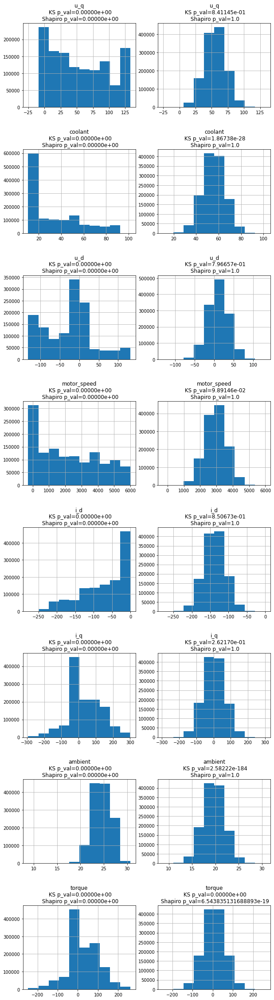

In [ ]:
plot_histograms_side_by_side(measures_train_df_X, matched_measures_train_df_X)

## Plot waterfall of each model

In [ ]:
# def plot_waterfall_coeficients(X_train, X_test, y_test, prediction, model, sample_size=1000):
#     # prediction = prediction.reshape(-1, 1)
#     ## residuals
#     residuals = y_test - prediction

#     rel_res=residuals/y_test
#     rel_res=rel_res.abs()

#     shap_sample = X_train.sample(sample_size)

#     explainer = shap.Explainer(model.predict, shap_sample)
#     shap_values = explainer(shap_sample)

#     test_shap_values = explainer(X_test)

#     max_id = rel_res[rel_res==rel_res.max()].index[0]
#     max_ordinal_id = X_test.index.get_loc(max_id)

#     shap.plots.waterfall(test_shap_values[max_ordinal_id])

Plot for regular model

In [ ]:
# for column in measures_test_df_y:
#     print(f'Plot for column: {column}')
#     model = LinearRegression()
#     prediction = model.fit(measures_train_df_X,measures_train_df_y[column]).predict(measures_test_df_X)
#     plot_waterfall_coeficients(measures_train_df_X, measures_test_df_X, measures_test_df_y[column], prediction, model)

Plot for normalized model

In [ ]:
# for column in measures_test_df_y:
#     print(f'Plot for column: {column}')
#     matched_model = LinearRegression()
#     matched_prediction = matched_model.fit(matched_measures_train_df_X,measures_train_df_y[column]).predict(matched_measures_test_df_X)
#     plot_waterfall_coeficients(matched_measures_train_df_X, matched_measures_test_df_X, measures_test_df_y[column], matched_prediction, matched_model)

Plot for Yeo-Johnson model

In [ ]:
# for column in measures_test_df_y:
#     print(f'Plot for column: {column}')
#     plot_waterfall_coeficients(yeo_measures_train_df_X, yeo_measures_test_df_X, measures_test_df_y[column], yeo_prediction, yeo_model)

# Try on second Dataset (Regression)

https://www.kaggle.com/deepcontractor/miami-housing-dataset

In [ ]:
!kaggle datasets download -d deepcontractor/miami-housing-dataset

  0% 0.00/650k [00:00<?, ?B/s]
100% 650k/650k [00:00<00:00, 44.1MB/s]


In [ ]:
# !cp '/content/drive/MyDrive/Colab Notebooks/Tabular DS/miami-housing.zip' -d './miami-housing.zip'

In [ ]:
!unzip -n ./miami-housing-dataset.zip -d .
!rm -rf ./miami-housing-dataset.zip

Archive:  ./miami-housing-dataset.zip
  inflating: ./miami-housing.csv     


In [ ]:
# !unzip -n ./miami-housing.zip -d .
# !rm -rf ./miami-housing.zip

In [ ]:
miami_df = pd.read_csv('./miami-housing.csv')

In [ ]:
get_insights(miami_df)

,min,max,mean,median,std,var,skew,kurtosis,entropy
LATITUDE,2.543433e+01,2.597438e+01,2.572881e+01,2.573181e+01,1.406333e-01,1.977772e-02,-0.094570,-0.969276,9.526271
LONGITUDE,-8.054217e+01,-8.011975e+01,-8.032748e+01,-8.033891e+01,8.919907e-02,7.956474e-03,0.292592,-0.908129,9.526271
PARCELNO,1.020008e+11,3.660170e+12,2.356496e+12,3.040300e+12,1.199290e+12,1.438298e+24,-0.897812,-0.938196,9.526271
SALE_PRC,7.200000e+04,2.650000e+06,3.999419e+05,3.100000e+05,3.172147e+05,1.006252e+11,3.215506,13.275156,6.333583
LND_SQFOOT,1.248000e+03,5.706400e+04,8.620880e+03,7.500000e+03,6.070089e+03,3.684598e+07,3.830115,19.076805,6.992606
TOT_LVG_AREA,8.540000e+02,6.287000e+03,2.058045e+03,1.877500e+03,8.135385e+02,6.618449e+05,1.346930,2.487290,7.688164
SPEC_FEAT_VAL,0.000000e+00,1.750200e+05,9.562493e+03,2.765500e+03,1.389097e+04,1.929590e+08,1.902250,4.667249,7.703347
RAIL_DIST,1.050000e+01,2.962150e+04,8.348549e+03,7.106300e+03,6.178027e+03,3.816802e+07,0.824282,-0.012673,9.471141
OCEAN_DIST,2.361000e+02,7.574490e+04,3.169099e+04,2.854175e+04,1.759508e+04,3.095868e+08,0.393140,-0.690381,9.510187
WATER_DIST,0.000000e+00,5.039980e+04,1.196029e+04,6.922600e+03,1.193299e+04,1.423963e+08,1.138049,0.328991,9.444248


In [ ]:
miami_df.describe()

,LATITUDE,LONGITUDE,PARCELNO,SALE_PRC,LND_SQFOOT,TOT_LVG_AREA,SPEC_FEAT_VAL,RAIL_DIST,OCEAN_DIST,WATER_DIST,CNTR_DIST,SUBCNTR_DI,HWY_DIST,age,avno60plus,month_sold,structure_quality
count,13932.000000,13932.000000,1.393200e+04,1.393200e+04,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000
mean,25.728811,-80.327475,2.356496e+12,3.999419e+05,8620.879917,2058.044574,9562.493468,8348.548715,31690.993798,11960.285235,68490.327132,41115.047265,7723.770693,30.669251,0.014930,6.655828,3.513997
std,0.140633,0.089199,1.199290e+12,3.172147e+05,6070.088742,813.538535,13890.967782,6178.027333,17595.079468,11932.992369,32008.474808,22161.825935,6068.936108,21.153068,0.121276,3.301523,1.097444
min,25.434333,-80.542172,1.020008e+11,7.200000e+04,1248.000000,854.000000,0.000000,10.500000,236.100000,0.000000,3825.600000,1462.800000,90.200000,0.000000,0.000000,1.000000,1.000000
25%,25.620056,-80.403278,1.079160e+12,2.350000e+05,5400.000000,1470.000000,810.000000,3299.450000,18079.350000,2675.850000,42823.100000,23996.250000,2998.125000,14.000000,0.000000,4.000000,2.000000
50%,25.731810,-80.338911,3.040300e+12,3.100000e+05,7500.000000,1877.500000,2765.500000,7106.300000,28541.750000,6922.600000,65852.400000,41109.900000,6159.750000,26.000000,0.000000,7.000000,4.000000
75%,25.852269,-80.258019,3.060170e+12,4.280000e+05,9126.250000,2471.000000,12352.250000,12102.600000,44310.650000,19200.000000,89358.325000,53949.375000,10854.200000,46.000000,0.000000,9.000000,4.000000
max,25.974382,-80.119746,3.660170e+12,2.650000e+06,57064.000000,6287.000000,175020.000000,29621.500000,75744.900000,50399.800000,159976.500000,110553.800000,48167.300000,96.000000,1.000000,12.000000,5.000000


In [ ]:
print(miami_df.shape)
miami_df.head()

(13932, 17)


,LATITUDE,LONGITUDE,PARCELNO,SALE_PRC,LND_SQFOOT,TOT_LVG_AREA,SPEC_FEAT_VAL,RAIL_DIST,OCEAN_DIST,WATER_DIST,CNTR_DIST,SUBCNTR_DI,HWY_DIST,age,avno60plus,month_sold,structure_quality
0,25.891031,-80.160561,622280070620,440000.0,9375,1753,0,2815.9,12811.4,347.6,42815.3,37742.2,15954.9,67,0,8,4
1,25.891324,-80.153968,622280100460,349000.0,9375,1715,0,4359.1,10648.4,337.8,43504.9,37340.5,18125.0,63,0,9,4
2,25.891334,-80.153740,622280100470,800000.0,9375,2276,49206,4412.9,10574.1,297.1,43530.4,37328.7,18200.5,61,0,2,4
3,25.891765,-80.152657,622280100530,988000.0,12450,2058,10033,4585.0,10156.5,0.0,43797.5,37423.2,18514.4,63,0,9,4
4,25.891825,-80.154639,622280100200,755000.0,12800,1684,16681,4063.4,10836.8,326.6,43599.7,37550.8,17903.4,42,0,7,4


In [ ]:
miami_df_train, miami_df_test = train_test_split(miami_df, test_size=0.25)

print(miami_df_train.shape)
print(miami_df_test.shape)

(10449, 17)
(3483, 17)


Remove target column

In [ ]:
labels_to_remove = ['SALE_PRC', 'PARCELNO', 'LATITUDE', 'LONGITUDE', 'month_sold']

miami_train_X = miami_df_train.drop(labels_to_remove, axis=1)
miami_train_y = miami_df_train['SALE_PRC']

miami_test_X = miami_df_test.drop(labels_to_remove, axis=1)
miami_test_y = miami_df_test['SALE_PRC']

Split to numeric and categorical columns

In [ ]:
miami_numeric_columns, miami_categorical_columns = get_numeric_categorical_columns(miami_train_X, ['SALE_PRC'], 1)

column: LND_SQFOOT, %: 37.056177624653074
column: TOT_LVG_AREA, %: 26.318307972054743
column: SPEC_FEAT_VAL, %: 58.57019810508183
column: RAIL_DIST, %: 95.90391425016747
column: OCEAN_DIST, %: 98.25820652694037
column: WATER_DIST, %: 95.8177816058953
column: CNTR_DIST, %: 98.60273710402909
column: SUBCNTR_DI, %: 98.37305005263661
column: HWY_DIST, %: 96.152741889176
column: age, %: 0.9091779117618911
column: avno60plus, %: 0.019140587616039813
column: structure_quality, %: 0.04785146904009953
numeric_columns = ['LND_SQFOOT', 'TOT_LVG_AREA', 'SPEC_FEAT_VAL', 'RAIL_DIST', 'OCEAN_DIST', 'WATER_DIST', 'CNTR_DIST', 'SUBCNTR_DI', 'HWY_DIST']
categorical_columns = ['age', 'avno60plus', 'structure_quality']


### Visualize histograms of features

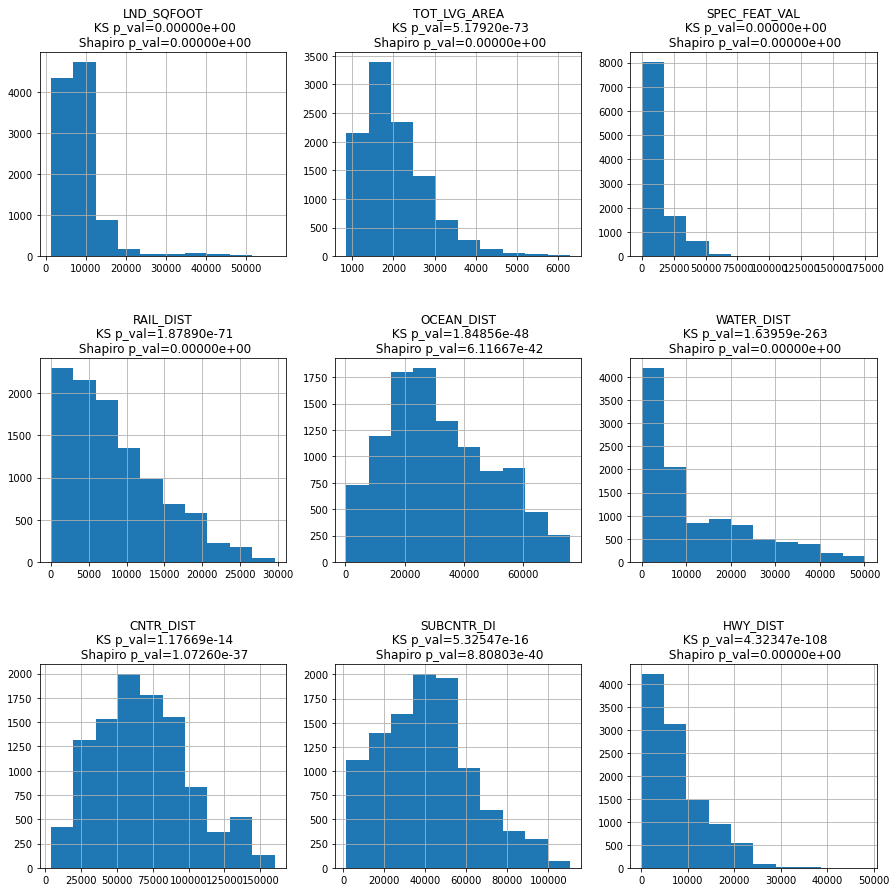

In [ ]:
plot_numerical_histograms(miami_train_X, miami_numeric_columns)

### Compare Histogram-Matching to Yeo-Johnson

Correction: LND_SQFOOT
Correction: TOT_LVG_AREA
Correction: SPEC_FEAT_VAL
Correction: RAIL_DIST
Correction: OCEAN_DIST
Correction: WATER_DIST
Correction: CNTR_DIST
Correction: SUBCNTR_DI
Correction: HWY_DIST


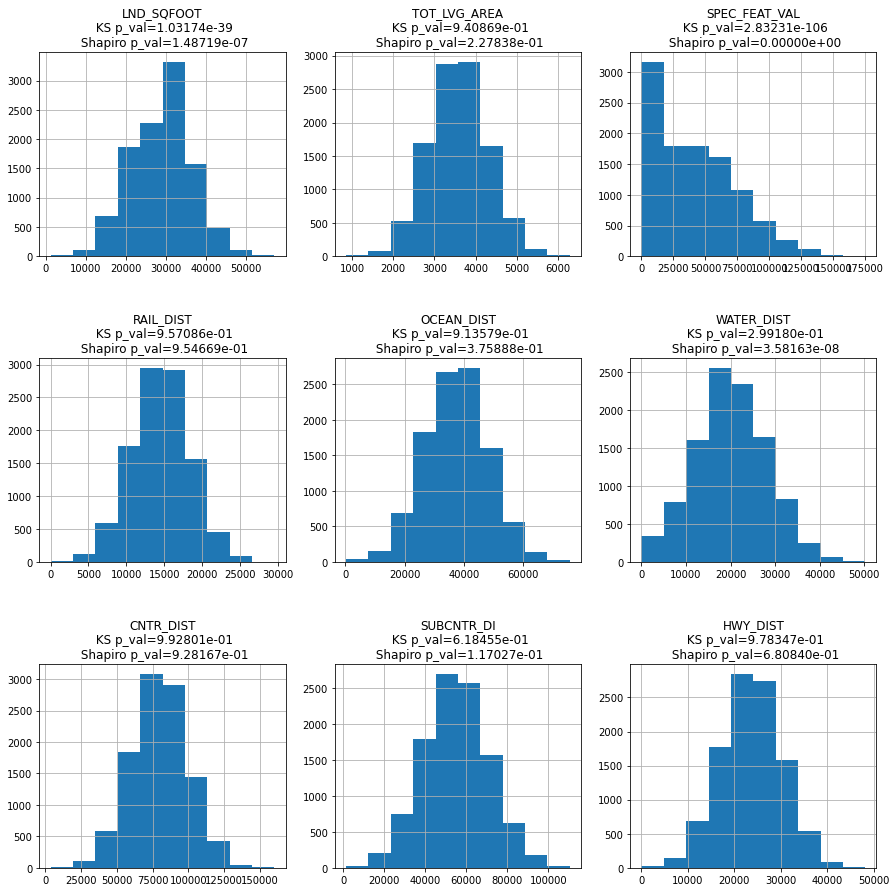

In [ ]:
matched_miami_train_df_X, matched_miami_train_df_X_normal_mapping = transform_dataset(miami_train_X[miami_numeric_columns],\
                                                                                    match_to_normal_distribution,\
                                                                                    correction=correction_func)
matched_miami_train_df_X_not, matched_miami_train_df_X_normal_mapping_not = transform_dataset(miami_train_X[miami_numeric_columns],\
                                                                                    match_to_normal_distribution)
plot_numerical_histograms(matched_miami_train_df_X, miami_numeric_columns)

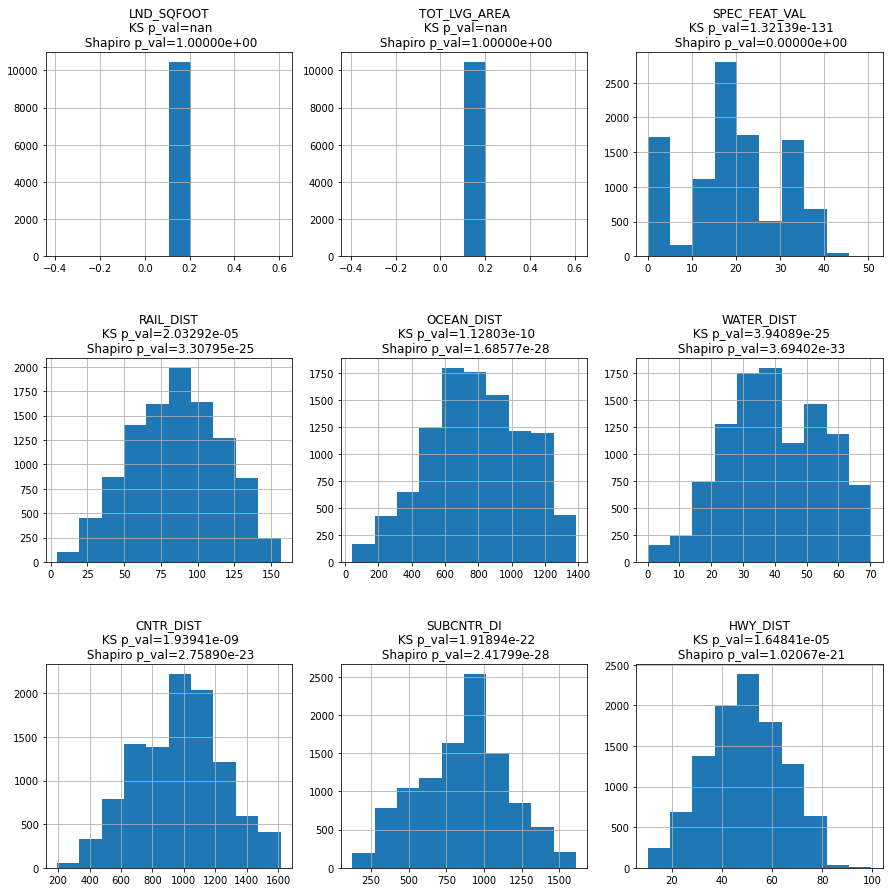

In [ ]:
yeo_miami_train_df_X, yeo_miami_train_df_X_normal_mapping = transform_dataset(miami_train_X[miami_numeric_columns], stats.yeojohnson)
plot_numerical_histograms(yeo_miami_train_df_X, miami_numeric_columns)

#### Match test set X

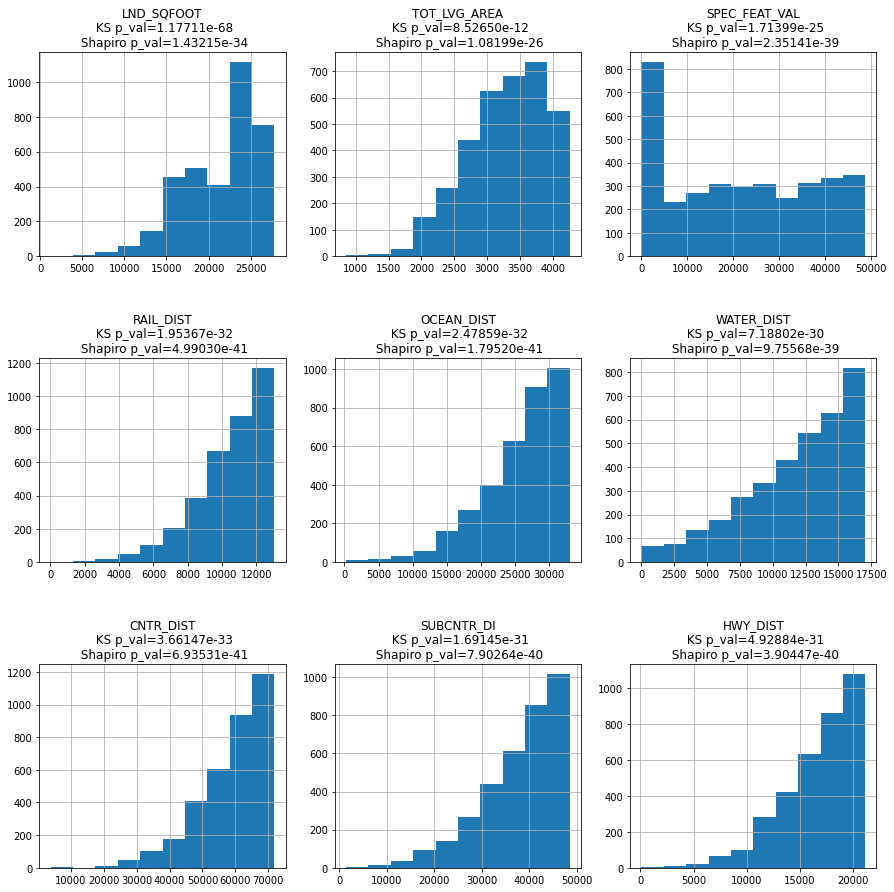

In [ ]:
matched_miami_test_df_X, _ = transform_dataset(miami_test_X[miami_numeric_columns], match_to_normal_distribution, mapping=matched_miami_train_df_X_normal_mapping)
plot_numerical_histograms(matched_miami_test_df_X, miami_numeric_columns)

In [ ]:
yeo_miami_test_df_X, _ = transform_dataset(miami_test_X[miami_numeric_columns], stats.yeojohnson, mapping=yeo_miami_train_df_X_normal_mapping)

In [ ]:
matched_miami_train_df_X = pd.concat([matched_miami_train_df_X, miami_train_X[miami_categorical_columns]], axis=1)
matched_miami_test_df_X = pd.concat([matched_miami_test_df_X, miami_test_X[miami_categorical_columns]], axis=1)

yeo_miami_train_df_X = pd.concat([yeo_miami_train_df_X, miami_train_X[miami_categorical_columns]], axis=1)
yeo_miami_test_df_X = pd.concat([yeo_miami_test_df_X, miami_test_X[miami_categorical_columns]], axis=1)

## QQ plots of features

### QQ plots for regular features

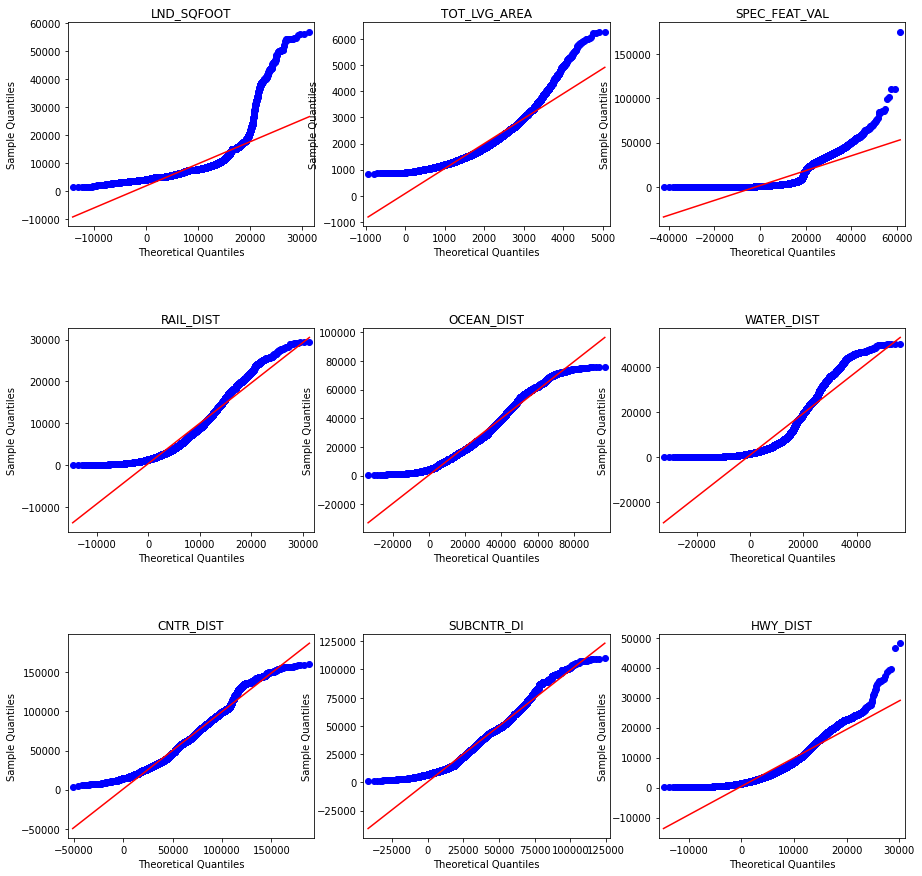

In [ ]:
qq_plot_data(miami_train_X, miami_numeric_columns)

### QQ plots for Matched features

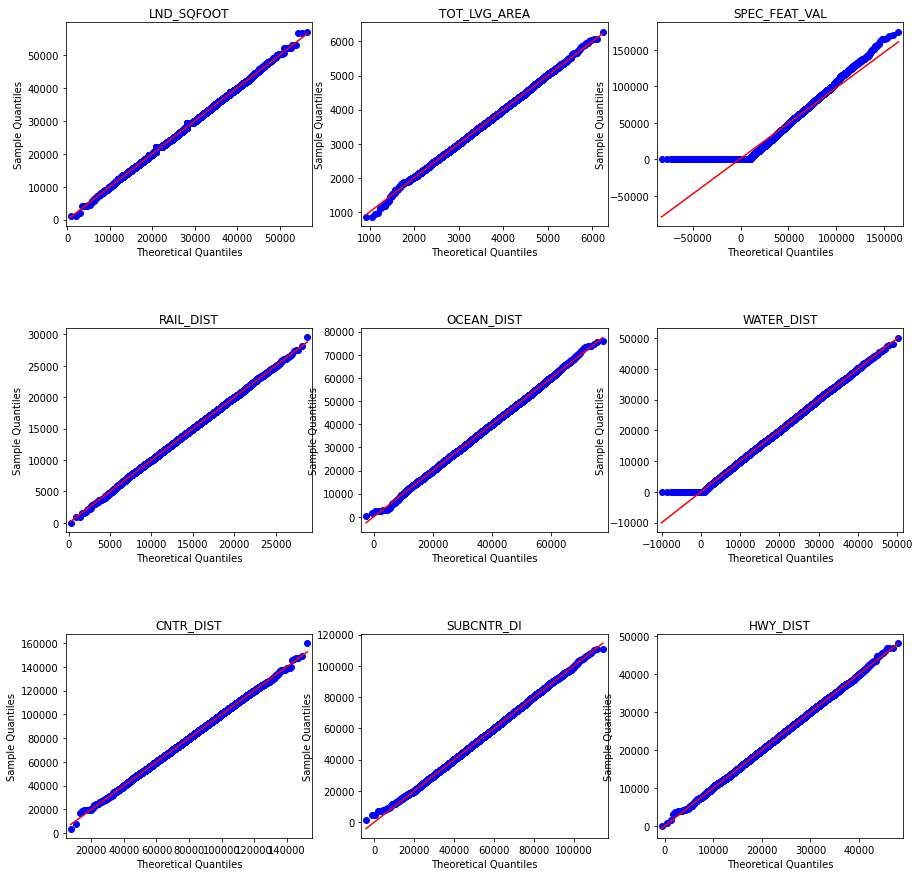

In [ ]:
qq_plot_data(matched_miami_train_df_X, miami_numeric_columns)

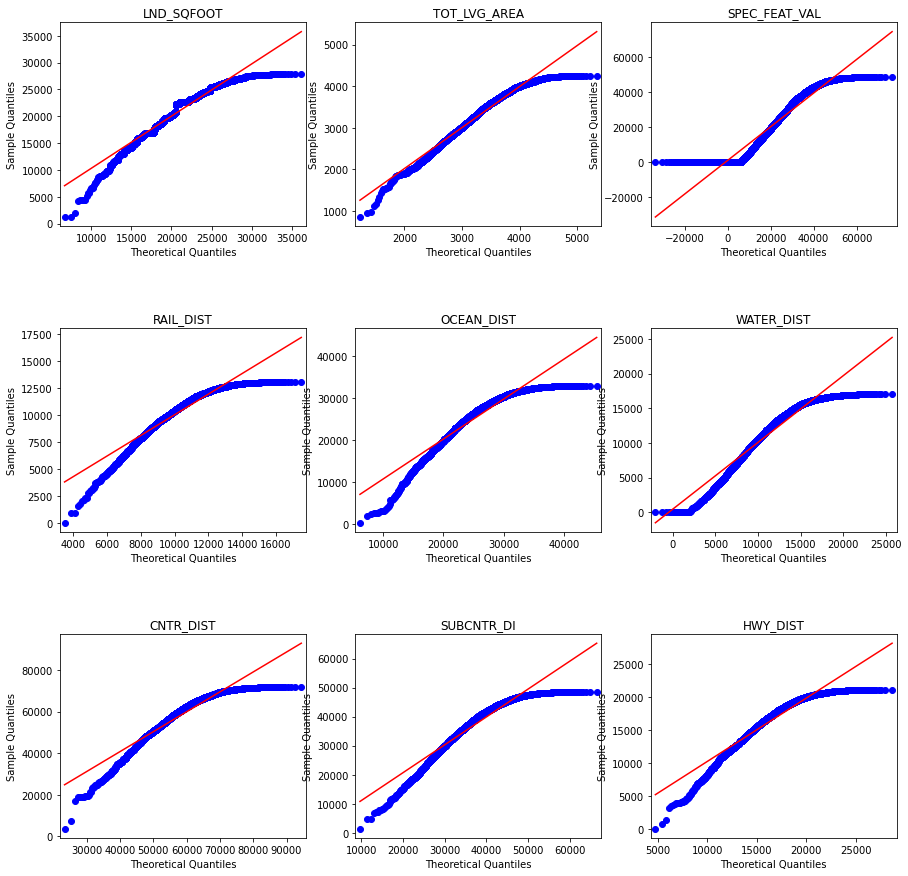

In [ ]:
qq_plot_data(matched_miami_test_df_X, miami_numeric_columns)

### QQ plots for Yeo-Johnson features

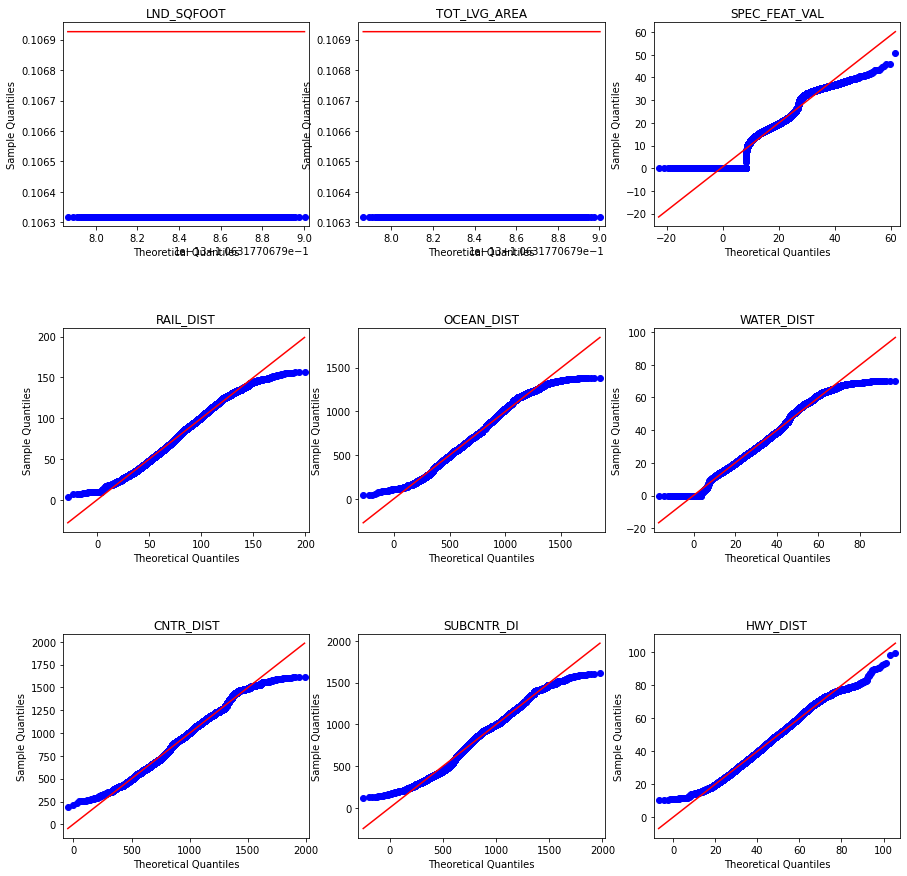

In [ ]:
qq_plot_data(yeo_miami_train_df_X, miami_numeric_columns)

## Compare model preformance

### Test on regular data

In [ ]:
model = LinearRegression()
prediction = model.fit(miami_train_X, miami_train_y).predict(miami_test_X)
print(f'r2={r2_score(miami_test_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(miami_test_y, prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(miami_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(miami_test_y, prediction))))

r2=0.6909810006790187
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.330
Mean Absolute Error (Σ|y - pred|/n): 114,963
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 185,248


### Test on matched data

In [ ]:
model = LinearRegression()
prediction = model.fit(matched_miami_train_df_X, miami_train_y).predict(matched_miami_test_df_X)
print(f'r2={r2_score(miami_test_y, prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(miami_test_y, prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(miami_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(miami_test_y, prediction))))

r2=0.49679922890401973
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.452
Mean Absolute Error (Σ|y - pred|/n): 158,466
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 236,391


### Test on Yeo-Johnson data

In [ ]:
model = LinearRegression()
prediction = model.fit(yeo_miami_train_df_X, miami_train_y).predict(yeo_miami_test_df_X)
print(f'r2={r2_score(miami_test_y, prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(miami_test_y, prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(miami_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(miami_test_y, prediction))))

r2=0.49070977939489324
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.423
Mean Absolute Error (Σ|y - pred|/n): 150,102
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 237,817


## Try to normalize only 1 column at a time and Compare to regular model

In [ ]:
compare_one_norm_column(miami_train_X, miami_test_X, miami_train_y, miami_test_y,\
                        matched_miami_train_df_X, matched_miami_test_df_X, yeo_miami_train_df_X,\
                        yeo_miami_test_df_X, 'SALE_PRC', miami_numeric_columns)

=== Measure for regular model: ===
column=SALE_PRC, r2=0.6909810006790187
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.330
Mean Absolute Error (Σ|y - pred|/n): 114,963
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 185,248

=== Compare for column LND_SQFOOT ===
column=LND_SQFOOT, matched r2=0.6871031573410843
column=LND_SQFOOT, yeo r2=0.6883677600520534

=== Compare for column TOT_LVG_AREA ===
column=TOT_LVG_AREA, matched r2=0.5806920042780405
column=TOT_LVG_AREA, yeo r2=0.56408294825453

=== Compare for column SPEC_FEAT_VAL ===
column=SPEC_FEAT_VAL, matched r2=0.6777459651406992
column=SPEC_FEAT_VAL, yeo r2=0.6847173243505035

=== Compare for column RAIL_DIST ===
column=RAIL_DIST, matched r2=0.6797360344675585
column=RAIL_DIST, yeo r2=0.6881973467503462

=== Compare for column OCEAN_DIST ===
column=OCEAN_DIST, matched r2=0.5982801979096634
column=OCEAN_DIST, yeo r2=0.6995814848461581

=== Compare for column WATER_DIST ===
column=WATER_DIST, matched r2=0.6847276618038185
column=WA

## Get insights about the data

In [ ]:
miami_insights = get_insights(miami_train_X[miami_numeric_columns])
miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,1248.0,57064.0,8624.679395,7500.0,6104.533195,3.726533e+07,3.834553,19.029902,6.916737
TOT_LVG_AREA,854.0,6287.0,2054.856158,1880.0,804.661892,6.474808e+05,1.320762,2.450672,7.642591
SPEC_FEAT_VAL,0.0,175020.0,9562.104412,2756.0,13891.011919,1.929602e+08,1.902705,4.825387,7.566226
RAIL_DIST,10.5,29528.6,8339.431017,7138.6,6158.831227,3.793120e+07,0.833334,0.029521,9.196419
OCEAN_DIST,236.1,75744.9,31729.098785,28527.4,17566.230471,3.085725e+08,0.392413,-0.694626,9.229765
WATER_DIST,0.0,50206.2,11956.331247,6915.3,11908.668391,1.418164e+08,1.137665,0.338525,9.170838
CNTR_DIST,3825.6,159976.5,68706.436310,65910.2,32091.052364,1.029836e+09,0.428230,-0.307174,9.234741
SUBCNTR_DI,1462.8,110553.8,41225.368341,41285.7,22261.012733,4.955527e+08,0.452673,-0.213220,9.231557
HWY_DIST,93.9,48167.3,7710.897052,6187.3,6025.362798,3.630500e+07,1.114644,1.101719,9.200176


In [ ]:
matched_miami_insights = get_insights(matched_miami_train_df_X[miami_numeric_columns])
matched_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,1248.0,57064.0,28662.343811,29426.350827,7463.806877,5.570841e+07,0.003786,0.011074,6.916737
TOT_LVG_AREA,854.0,6287.0,3578.735257,3574.849499,711.969326,5.069003e+05,0.031769,0.021072,7.642591
SPEC_FEAT_VAL,0.0,175020.0,40991.417088,37523.803741,33132.167012,1.097740e+09,0.593339,-0.243247,7.566226
RAIL_DIST,10.5,29528.6,14537.664317,14567.536153,3828.619578,1.465833e+07,-0.013941,0.018986,9.196419
OCEAN_DIST,236.1,75744.9,37457.279372,37565.917403,10722.285587,1.149674e+08,0.007392,0.037978,9.229765
WATER_DIST,0.0,50206.2,20099.479503,19927.827772,8076.720075,6.523341e+07,0.038857,-0.128864,9.170838
CNTR_DIST,3825.6,159976.5,79998.175725,79907.999955,19500.336765,3.802631e+08,0.000203,-0.045897,9.234741
SUBCNTR_DI,1462.8,110553.8,55221.994510,55114.326821,15867.449297,2.517759e+08,0.034157,-0.083701,9.231557
HWY_DIST,93.9,48167.3,23705.767826,23708.547753,6539.474684,4.276473e+07,0.000285,-0.050134,9.200176


In [ ]:
matched_not_miami_insights = get_insights(matched_miami_train_df_X_not[miami_numeric_columns])
matched_not_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,-15242.696298,30420.664266,8745.871272,9404.604737,6047.819884,3.657613e+07,-0.017856,-0.036861,6.916737
TOT_LVG_AREA,-796.374655,5181.933827,2047.531665,2050.439982,797.773053,6.364418e+05,0.022507,0.070246,7.642591
SPEC_FEAT_VAL,-4346.641317,63774.796149,10583.064159,9306.182831,12116.891178,1.468191e+08,0.625233,-0.137058,7.566226
RAIL_DIST,-14949.241127,35951.691734,8220.065477,8228.109562,6134.565729,3.763290e+07,0.009815,0.041173,9.196419
OCEAN_DIST,-33438.713376,89799.455746,31712.990510,31922.824546,17485.815943,3.057538e+08,-0.055787,-0.016005,9.229765
WATER_DIST,-16039.963614,59133.963373,12112.947361,11999.648692,11831.649627,1.399879e+08,0.081038,-0.129983,9.170838
CNTR_DIST,-63597.189920,191621.360372,68739.729589,68631.905055,32287.481844,1.042481e+09,-0.009760,-0.007575,9.234741
SUBCNTR_DI,-55468.121147,147091.642179,41036.212173,40969.503640,22402.823507,5.018865e+08,0.014158,0.081149,9.231557
HWY_DIST,-20019.270493,34964.091138,7689.869806,7686.100001,6047.800073,3.657589e+07,0.003304,0.065410,9.200176


In [ ]:
yeo_miami_insights = get_insights(yeo_miami_train_df_X[miami_numeric_columns])
yeo_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,0.106318,0.106318,0.106318,0.106318,1.523854e-14,2.322131e-28,0.000000,0.000000,-0.000000
TOT_LVG_AREA,0.106318,0.106318,0.106318,0.106318,1.523854e-14,2.322131e-28,0.000000,0.000000,-0.000000
SPEC_FEAT_VAL,0.000000,50.673329,19.348560,19.324201,1.130771e+01,1.278642e+02,-0.235792,-0.688981,7.566226
RAIL_DIST,4.167220,156.478246,85.618432,87.035534,3.047347e+01,9.286327e+02,-0.098377,-0.644081,9.196419
OCEAN_DIST,42.365394,1384.888431,787.626428,771.467822,2.848496e+02,8.113927e+04,-0.100863,-0.620243,9.229765
WATER_DIST,0.000000,70.354088,40.051263,38.871956,1.529525e+01,2.339447e+02,-0.093496,-0.661945,9.170838
CNTR_DIST,191.133656,1615.695836,968.813839,974.275849,2.728104e+02,7.442551e+04,-0.055371,-0.476467,9.234741
SUBCNTR_DI,123.664327,1610.010190,862.636944,899.175246,2.985841e+02,8.915249e+04,-0.092268,-0.516017,9.231557
HWY_DIST,10.447270,99.579700,49.355059,49.573811,1.508206e+01,2.274684e+02,-0.062208,-0.542619,9.200176


In [ ]:
miami_insights - matched_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,0.0,0.000000e+00,-20037.664416,-21926.350827,-1359.273682,-1.844309e+07,3.830766,19.018829,0.0
TOT_LVG_AREA,0.0,0.000000e+00,-1523.879098,-1694.849499,92.692566,1.405804e+05,1.288993,2.429600,0.0
SPEC_FEAT_VAL,0.0,0.000000e+00,-31429.312676,-34767.803741,-19241.155093,-9.047803e+08,1.309366,5.068635,0.0
RAIL_DIST,0.0,-3.637979e-12,-6198.233299,-7428.936153,2330.211649,2.327287e+07,0.847275,0.010535,0.0
OCEAN_DIST,0.0,0.000000e+00,-5728.180588,-9038.517403,6843.944884,1.936050e+08,0.385022,-0.732604,0.0
WATER_DIST,0.0,0.000000e+00,-8143.148256,-13012.527772,3831.948316,7.658298e+07,1.098808,0.467388,0.0
CNTR_DIST,0.0,0.000000e+00,-11291.739416,-13997.799955,12590.715599,6.495725e+08,0.428027,-0.261277,0.0
SUBCNTR_DI,0.0,-1.455192e-11,-13996.626169,-13828.626821,6393.563437,2.437767e+08,0.418516,-0.129518,0.0
HWY_DIST,0.0,0.000000e+00,-15994.870773,-17521.247753,-514.111885,-6.459732e+06,1.114359,1.151853,0.0


In [ ]:
miami_insights - matched_not_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,16490.696298,26643.335734,-121.191877,-1904.604737,56.713310,6.892002e+05,3.852408,19.066764,0.0
TOT_LVG_AREA,1650.374655,1105.066173,7.324494,-170.439982,6.888839,1.103892e+04,1.298255,2.380426,0.0
SPEC_FEAT_VAL,4346.641317,111245.203851,-1020.959748,-6550.182831,1774.120741,4.614116e+07,1.277472,4.962446,0.0
RAIL_DIST,14959.741127,-6423.091734,119.365541,-1089.509562,24.265499,2.983054e+05,0.823519,-0.011651,0.0
OCEAN_DIST,33674.813376,-14054.555746,16.108275,-3395.424546,80.414528,2.818694e+06,0.448200,-0.678621,0.0
WATER_DIST,16039.963614,-8927.763373,-156.616114,-5084.348692,77.018764,1.828450e+06,1.056627,0.468507,0.0
CNTR_DIST,67422.789920,-31644.860372,-33.293279,-2721.705055,-196.429480,-1.264584e+07,0.437990,-0.299599,0.0
SUBCNTR_DI,56930.921147,-36537.842179,189.156168,316.196360,-141.810774,-6.333813e+06,0.438515,-0.294369,0.0
HWY_DIST,20113.170493,13203.208862,21.027246,-1498.800001,-22.437274,-2.708889e+05,1.111339,1.036309,0.0


In [ ]:
miami_insights - yeo_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,1247.893682,57063.893682,8624.573077,7499.893682,6104.533195,3.726533e+07,3.834553,19.029902,6.916737
TOT_LVG_AREA,853.893682,6286.893682,2054.749841,1879.893682,804.661892,6.474808e+05,1.320762,2.450672,7.642591
SPEC_FEAT_VAL,0.000000,174969.326671,9542.755852,2736.675799,13879.704212,1.929601e+08,2.138496,5.514369,0.000000
RAIL_DIST,6.332780,29372.121754,8253.812585,7051.564466,6128.357753,3.793027e+07,0.931711,0.673602,0.000000
OCEAN_DIST,193.734606,74360.011569,30941.472357,27755.932178,17281.380906,3.084913e+08,0.493276,-0.074384,0.000000
WATER_DIST,0.000000,50135.845912,11916.279984,6876.428044,11893.373141,1.418161e+08,1.231161,1.000470,0.000000
CNTR_DIST,3634.466344,158360.804164,67737.622471,64935.924151,31818.241966,1.029761e+09,0.483601,0.169292,0.000000
SUBCNTR_DI,1339.135673,108943.789810,40362.731397,40386.524754,21962.428597,4.954635e+08,0.544941,0.302797,0.000000
HWY_DIST,83.452730,48067.720300,7661.541994,6137.726189,6010.280743,3.630477e+07,1.176851,1.644338,0.000000


## Plot distributions

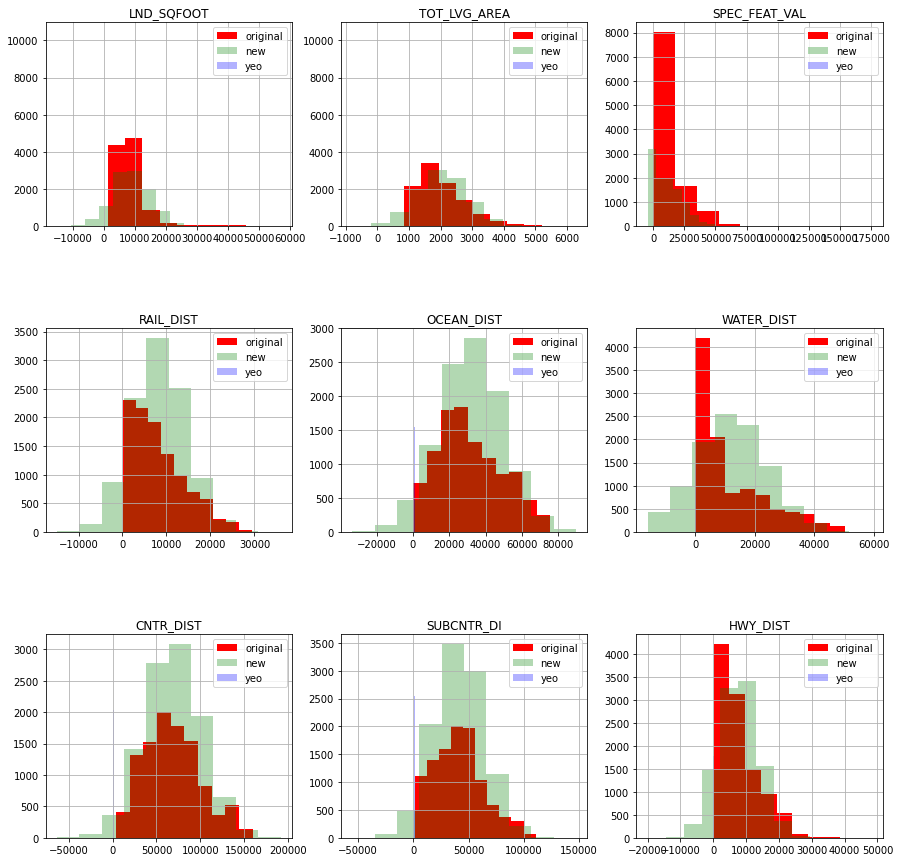

In [ ]:
plot_histograms(miami_train_X[miami_numeric_columns], 
                matched_miami_train_df_X_not[miami_numeric_columns], 
                yeo_miami_train_df_X[miami_numeric_columns])

## Plot a Heatmap of all columns to targets

In [ ]:
matched_miami_df_corr = pd.concat([matched_miami_train_df_X, miami_train_y], axis=1)
yeo_miami_df_corr = pd.concat([yeo_miami_train_df_X, miami_train_y], axis=1)

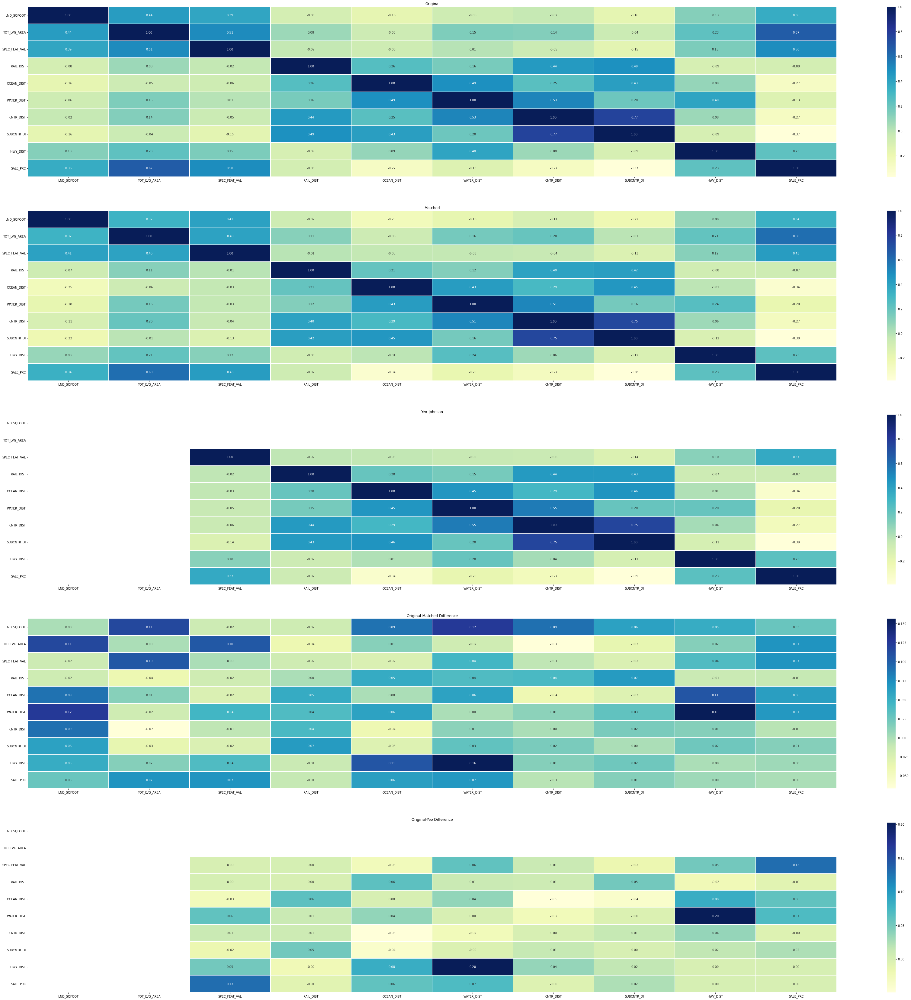

In [ ]:
plot_correlation_heatmaps(miami_df, matched_miami_df_corr, yeo_miami_df_corr, miami_numeric_columns + ['SALE_PRC'])

In [ ]:
for column in miami_train_y.to_frame().columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_miami_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_miami_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: SALE_PRC ===============
matched corr sum: 4.369671898227056
yeo corr sum: 3.3936682502770297


In [ ]:
miami_diff_corr_df = pd.concat([
           matched_miami_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_miami_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')

miami_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
LND_SQFOOT,3.244442,0.000000
TOT_LVG_AREA,3.702668,0.000000
SPEC_FEAT_VAL,2.832043,1.958104
RAIL_DIST,2.904264,2.813172
OCEAN_DIST,3.418040,3.140256
WATER_DIST,3.601419,3.380162
CNTR_DIST,4.597213,4.373859
SUBCNTR_DI,4.329330,4.171227
HWY_DIST,2.436138,2.046806
age,3.631448,3.005697


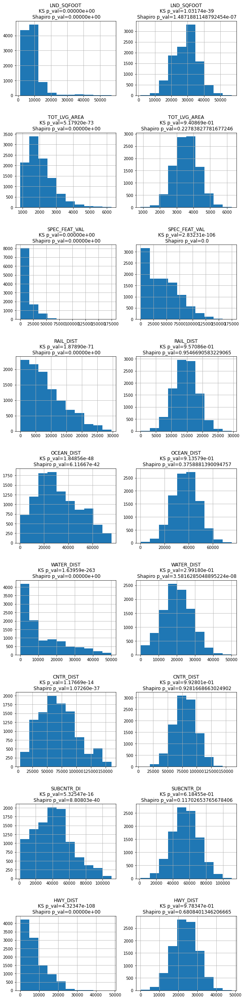

In [ ]:
plot_histograms_side_by_side(miami_train_X[miami_numeric_columns], matched_miami_train_df_X[miami_numeric_columns])

## Plot waterfall of each model

Plot for regular model

In [ ]:
# print(f'Plot for column: Age')
# model = LinearRegression()
# prediction = model.fit(crab_train_X,crab_train_y).predict(crab_test_X)
# plot_waterfall_coeficients(crab_train_X, crab_test_X, crab_test_y, prediction, model)

Plot for normalized model

In [ ]:
# print(f'Plot for column: Age')
# matched_model = LinearRegression()
# matched_prediction = matched_model.fit(matched_crab_train_df_X,crab_train_y).predict(matched_crab_test_df_X)
# plot_waterfall_coeficients(matched_crab_train_df_X, matched_crab_test_df_X, crab_test_y, matched_prediction, matched_model)

Plot for Yeo-Johnson model

In [ ]:
#     print(f'Plot for column: {column}')
#     plot_waterfall_coeficients(yeo_measures_train_df_X, yeo_measures_test_df_X, measures_test_df_y[column], yeo_prediction, yeo_model)

# Try on third Dataset (Regression)

https://www.kaggle.com/sidhus/crab-age-prediction

In [ ]:
!kaggle datasets download -d sidhus/crab-age-prediction

  0% 0.00/81.2k [00:00<?, ?B/s]
100% 81.2k/81.2k [00:00<00:00, 30.3MB/s]


In [ ]:
# !cp '/content/drive/MyDrive/Colab Notebooks/Tabular DS/CrabAgePrediction.csv' -d './CrabAgePrediction.csv'

In [ ]:
!unzip -n ./crab-age-prediction.zip -d .
!rm -rf ./crab-age-prediction.zip

Archive:  ./crab-age-prediction.zip
  inflating: ./CrabAgePrediction.csv  


In [ ]:
# !unzip -n ./CrabAgePrediction.zip -d .
# !rm -rf ./CrabAgePrediction.zip

In [ ]:
crab_df = pd.read_csv('./CrabAgePrediction.csv')

In [ ]:
crab_df.describe()

,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
count,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000
mean,1.311306,1.020893,0.349374,23.567275,10.207342,5.136546,6.795844,9.954791
std,0.300431,0.248233,0.104976,13.891201,6.275275,3.104133,3.943392,3.220967
min,0.187500,0.137500,0.000000,0.056699,0.028349,0.014175,0.042524,1.000000
25%,1.125000,0.875000,0.287500,12.672227,5.343881,2.664853,3.713785,8.000000
50%,1.362500,1.062500,0.362500,22.792998,9.539607,4.861939,6.662133,10.000000
75%,1.537500,1.200000,0.412500,32.786197,14.273973,7.200773,9.355335,11.000000
max,2.037500,1.625000,2.825000,80.101512,42.184056,21.545620,28.491248,29.000000


In [ ]:
print(crab_df.shape)
crab_df.head()

(3893, 9)


,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
0,F,1.4375,1.1750,0.4125,24.635715,12.332033,5.584852,6.747181,9
1,M,0.8875,0.6500,0.2125,5.400580,2.296310,1.374951,1.559222,6
2,I,1.0375,0.7750,0.2500,7.952035,3.231843,1.601747,2.764076,6
3,F,1.1750,0.8875,0.2500,13.480187,4.748541,2.282135,5.244657,10
4,I,0.8875,0.6625,0.2125,6.903103,3.458639,1.488349,1.700970,6


In [ ]:
crab_df['Sex'] = crab_df['Sex'].astype('category')
crab_df['Sex'] = crab_df['Sex'].cat.codes

In [ ]:
crab_df.Sex.head(5)

0    0
1    2
2    1
3    0
4    1
Name: Sex, dtype: int8

In [ ]:
crab_df_train, crab_df_test = train_test_split(crab_df, test_size=0.25)

print(crab_df_train.shape)
print(crab_df_test.shape)

(2919, 9)
(974, 9)


In [ ]:
crab_numeric_columns, crab_categorical_columns = get_numeric_categorical_columns(crab_df_train, ['Age'], 1)

column: Sex, %: 0.10277492291880781
column: Length, %: 4.5906132237067485
column: Diameter, %: 3.734155532716684
column: Height, %: 1.7471736896197325
column: Weight, %: 67.86570743405275
column: Shucked Weight, %: 45.63206577595067
column: Viscera Weight, %: 28.297362110311752
column: Shell Weight, %: 28.05755395683453
numeric_columns = ['Length', 'Diameter', 'Height', 'Weight', 'Shucked Weight', 'Viscera Weight', 'Shell Weight']
categorical_columns = ['Sex']


In [ ]:
crab_train_X = crab_df_train.drop('Age', axis=1)
crab_train_y = crab_df_train['Age']

crab_test_X = crab_df_test.drop('Age', axis=1)
crab_test_y = crab_df_test['Age']

### Visualize histograms of features

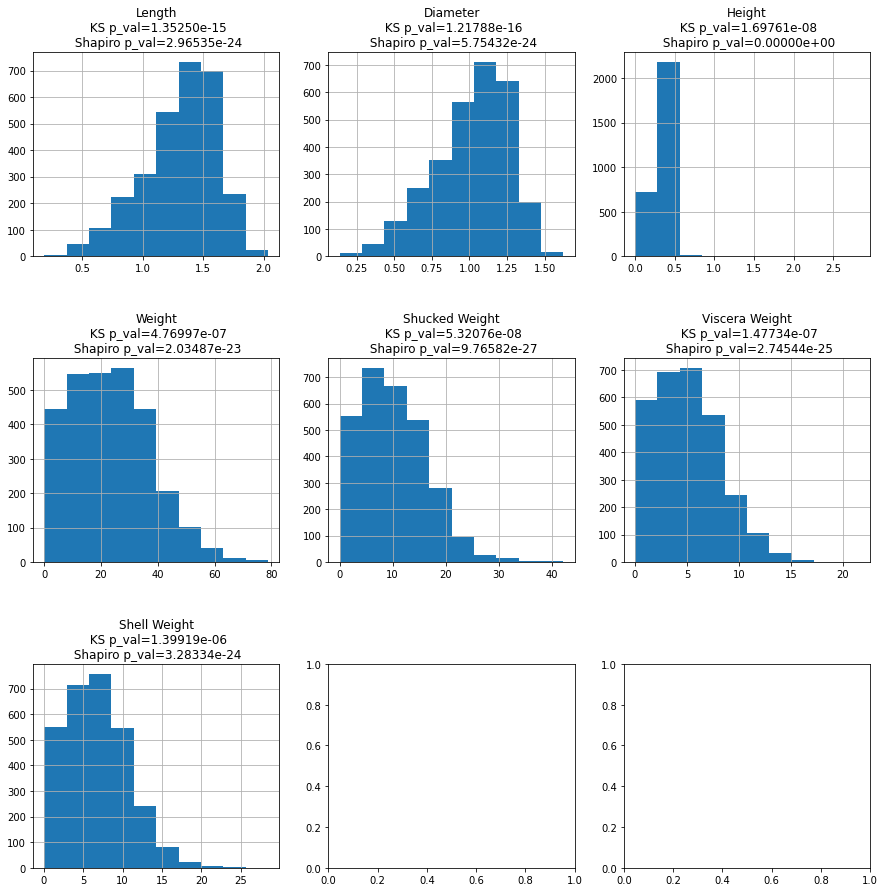

In [ ]:
plot_numerical_histograms(crab_train_X, crab_numeric_columns)

### Compare Histogram-Matching to Yeo-Johnson

Correction: Length
Correction: Diameter
Correction: Height
Correction: Weight
Correction: Shucked Weight
Correction: Viscera Weight
Correction: Shell Weight


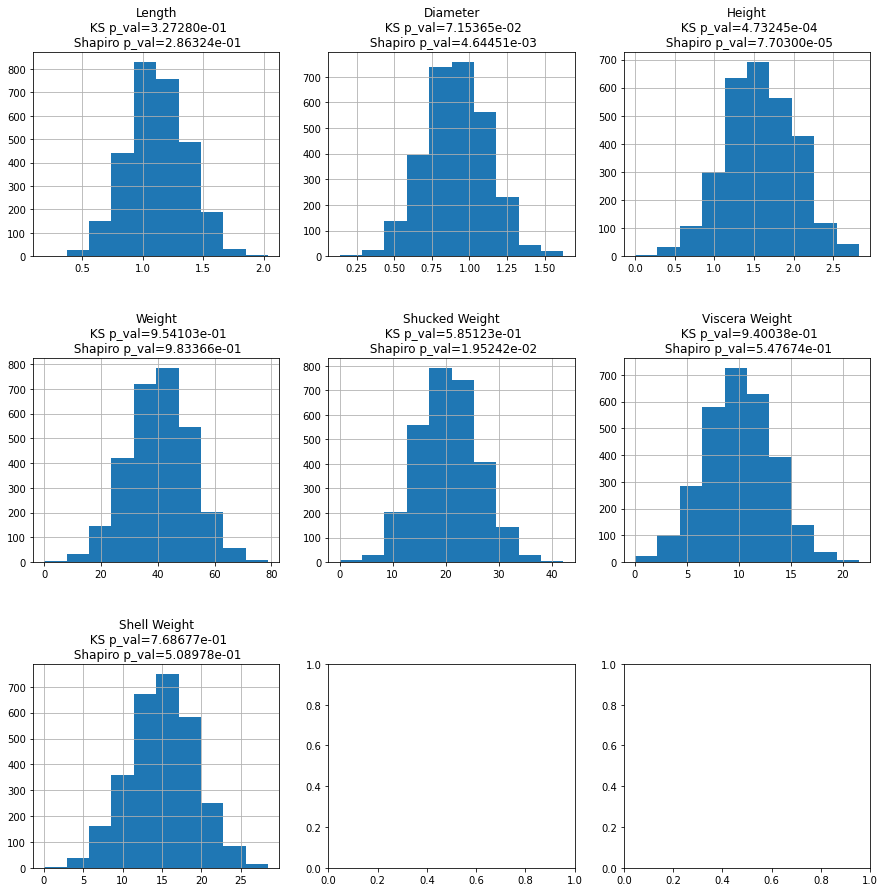

In [ ]:
matched_crab_train_df_X, matched_crab_train_df_X_normal_mapping = transform_dataset(crab_train_X[crab_numeric_columns],\
                                                                                    match_to_normal_distribution,\
                                                                                    correction=correction_func)

matched_crab_train_df_X_not, matched_crab_train_df_X_normal_mapping_not = transform_dataset(crab_train_X[crab_numeric_columns],\
                                                                                    match_to_normal_distribution)
plot_numerical_histograms(matched_crab_train_df_X, crab_numeric_columns)

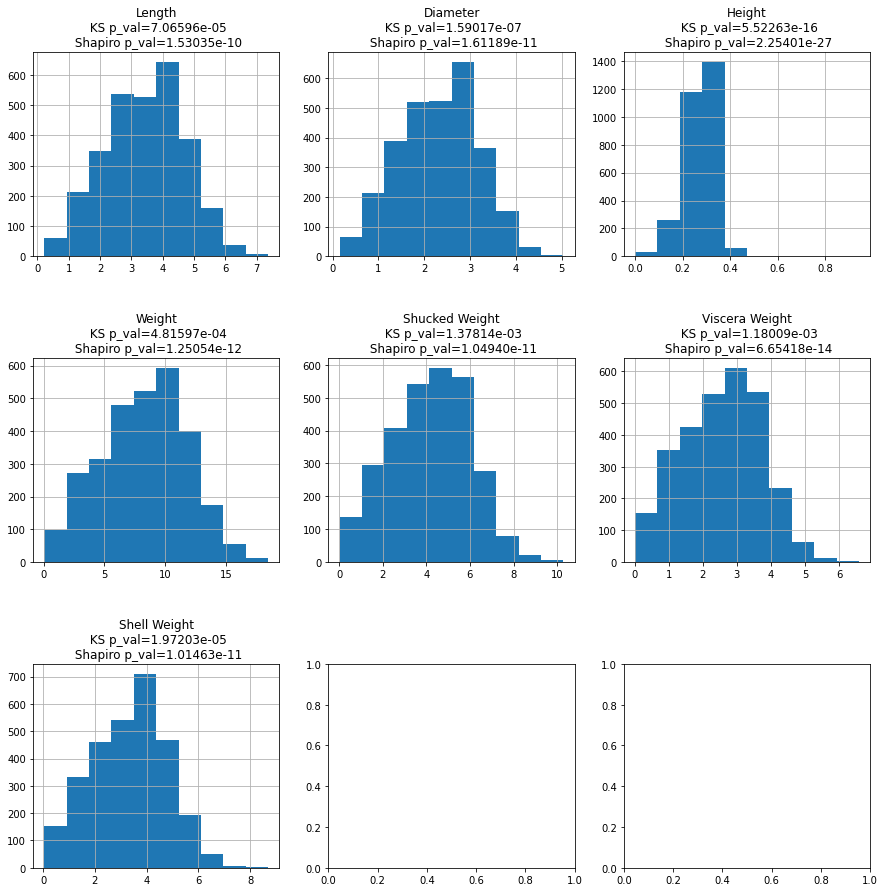

In [ ]:
yeo_crab_train_df_X, yeo_crab_train_df_X_normal_mapping = transform_dataset(crab_train_X[crab_numeric_columns], stats.yeojohnson)
plot_numerical_histograms(yeo_crab_train_df_X, crab_numeric_columns)

#### Match test set X

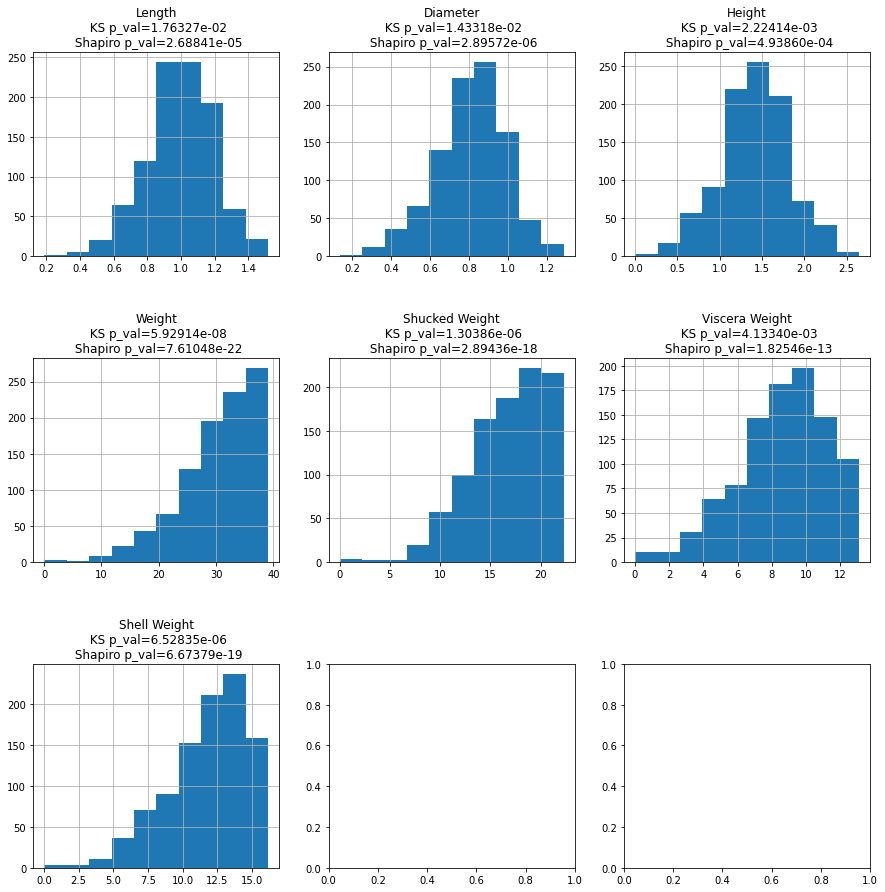

In [ ]:
matched_crab_test_df_X, _ = transform_dataset(crab_test_X[crab_numeric_columns], match_to_normal_distribution, mapping=matched_crab_train_df_X_normal_mapping)
plot_numerical_histograms(matched_crab_test_df_X, crab_numeric_columns)

In [ ]:
yeo_crab_test_df_X, _ = transform_dataset(crab_test_X[crab_numeric_columns], stats.yeojohnson, mapping=yeo_crab_train_df_X_normal_mapping)

#### Add the categorical columns to the train and the test

In [ ]:
matched_crab_train_df_X = pd.concat([matched_crab_train_df_X, crab_train_X[crab_categorical_columns]], axis=1)
matched_crab_test_df_X = pd.concat([matched_crab_test_df_X, crab_test_X[crab_categorical_columns]], axis=1)

yeo_crab_train_df_X = pd.concat([yeo_crab_train_df_X, crab_train_X[crab_categorical_columns]], axis=1)
yeo_crab_test_df_X = pd.concat([yeo_crab_test_df_X, crab_test_X[crab_categorical_columns]], axis=1)

## QQ plots of features

### QQ plots for regular features

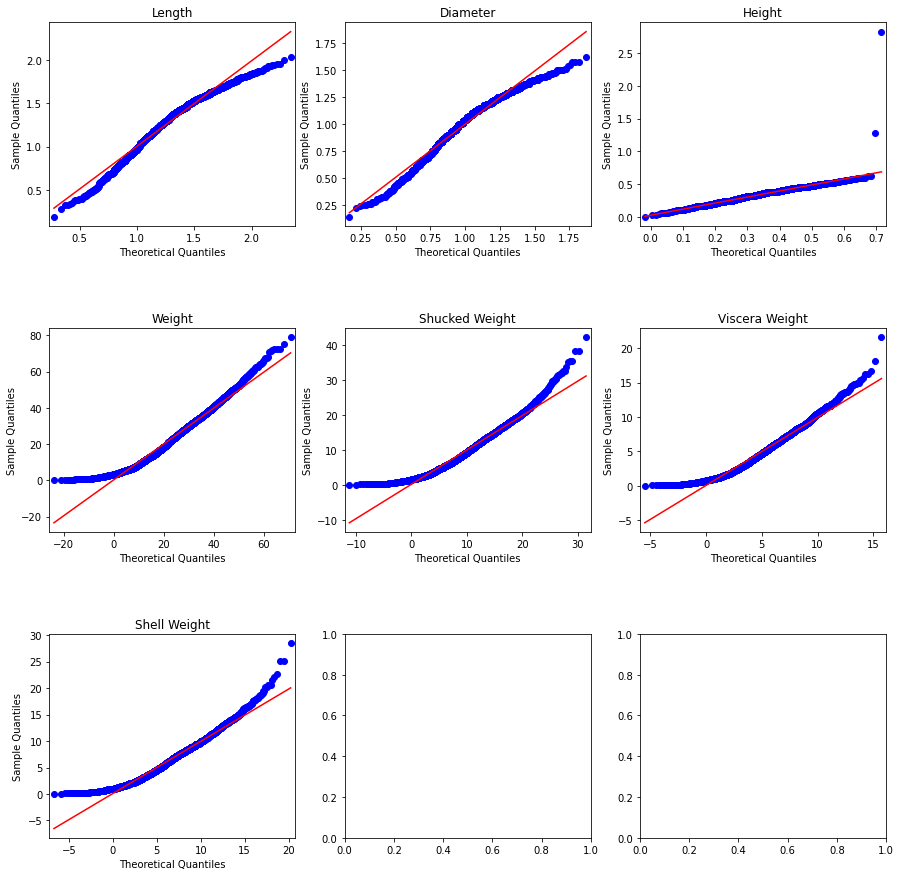

In [ ]:
qq_plot_data(crab_train_X, crab_numeric_columns)

### QQ plots for Matched features

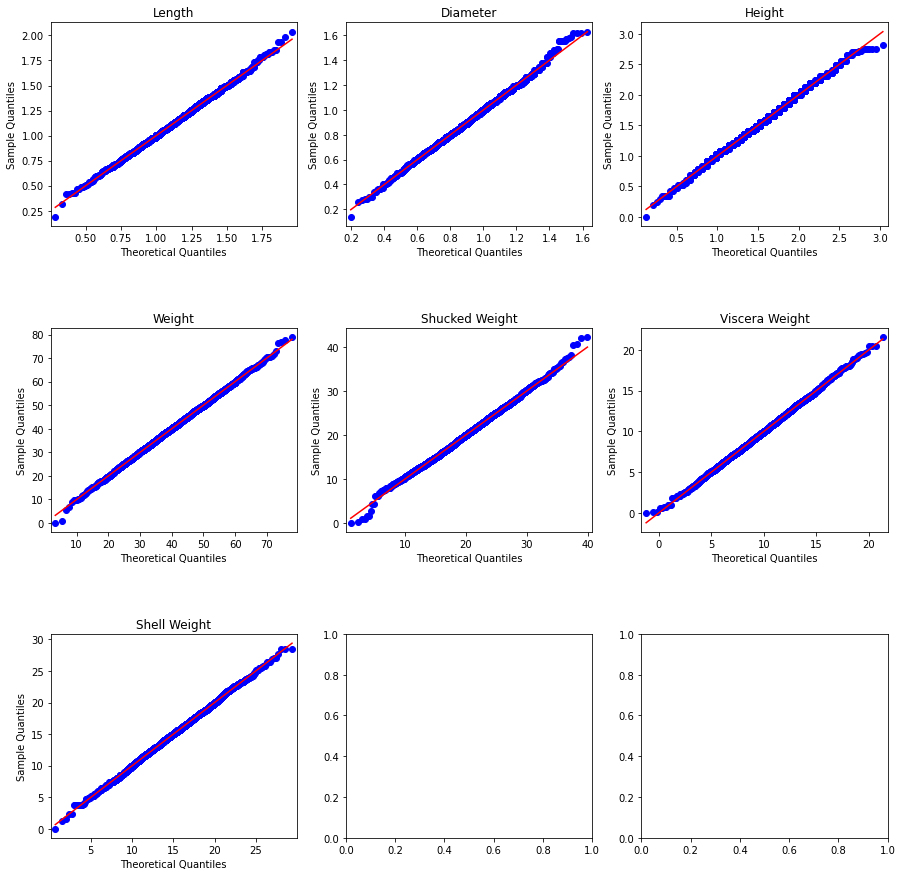

In [ ]:
qq_plot_data(matched_crab_train_df_X, crab_numeric_columns)

### QQ plots for Yeo-Johnson features

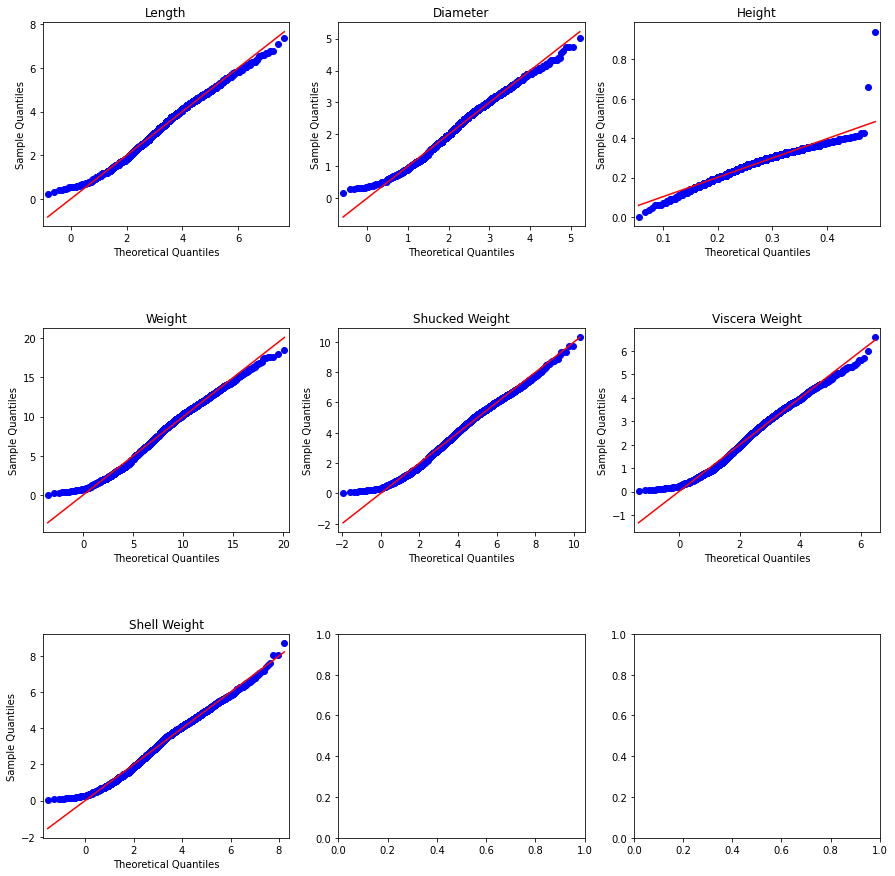

In [ ]:
qq_plot_data(yeo_crab_train_df_X, crab_numeric_columns)

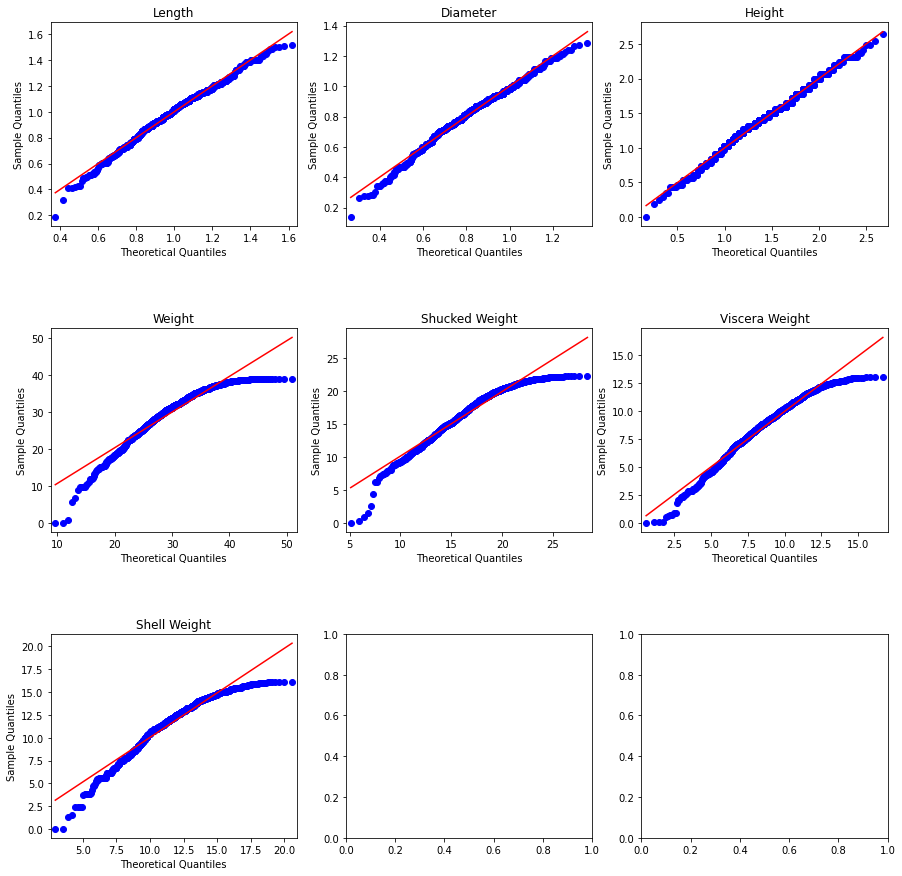

In [ ]:
qq_plot_data(matched_crab_test_df_X, crab_numeric_columns)

## Compare model preformance

### Test on regular data

In [ ]:
model = LinearRegression()
prediction = model.fit(crab_train_X,crab_train_y).predict(crab_test_X)
print(f'r2={r2_score(crab_test_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(crab_test_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(crab_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(crab_test_y, prediction))))

r2=0.4828608477744373
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.161
Mean Absolute Error (Σ|y - pred|/n): 2
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 2


### Test on matched data

In [ ]:
model = LinearRegression()
prediction = model.fit(matched_crab_train_df_X,crab_train_y).predict(matched_crab_test_df_X)
print(f'r2={r2_score(crab_test_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(crab_test_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(crab_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(crab_test_y, prediction))))

r2=-0.444388434361523
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.273
Mean Absolute Error (Σ|y - pred|/n): 3
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 4


### Test on Yeo-Johnson data

In [ ]:
model = LinearRegression()
prediction = model.fit(yeo_crab_train_df_X,crab_train_y).predict(yeo_crab_test_df_X)
print(f'r2={r2_score(crab_test_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(crab_test_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(crab_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(crab_test_y, prediction))))

r2=0.5008700514505495
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.157
Mean Absolute Error (Σ|y - pred|/n): 2
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 2


## Try to normalize only 1 column at a time and Compare to regular model

In [ ]:
compare_one_norm_column(crab_train_X, crab_test_X, crab_train_y, crab_test_y,\
                        matched_crab_train_df_X, matched_crab_test_df_X,\
                        yeo_crab_train_df_X, yeo_crab_test_df_X, 'Age', crab_numeric_columns)

=== Measure for regular model: ===
column=Age, r2=0.4828608477744373
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.161
Mean Absolute Error (Σ|y - pred|/n): 2
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 2

=== Compare for column Length ===
column=Length, matched r2=0.4411253520681392
column=Length, yeo r2=0.48477864416357985

=== Compare for column Diameter ===
column=Diameter, matched r2=0.4836189789249612
column=Diameter, yeo r2=0.4827108069451228

=== Compare for column Height ===
column=Height, matched r2=0.4656050748505619
column=Height, yeo r2=0.48769360103808634

=== Compare for column Weight ===
column=Weight, matched r2=-1.076823338652197
column=Weight, yeo r2=0.49026256099930776

=== Compare for column Shucked Weight ===
column=Shucked Weight, matched r2=-0.05671819945042711
column=Shucked Weight, yeo r2=0.4481506014060136

=== Compare for column Viscera Weight ===
column=Viscera Weight, matched r2=0.47701487146318367
column=Viscera Weight, yeo r2=0.4797732575609426

==

## Get insights about the data

In [ ]:
crab_insights = get_insights(crab_train_X[crab_numeric_columns])
crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.187500,2.037500,1.308128,1.362500,0.303838,0.092318,-0.636035,0.059895,4.519769
Diameter,0.137500,1.625000,1.018093,1.062500,0.250744,0.062872,-0.603168,-0.060594,4.329886
Height,0.000000,2.825000,0.349101,0.350000,0.108149,0.011696,4.121319,95.081664,3.442057
Weight,0.056699,78.797435,23.449538,22.594552,13.957470,194.810979,0.518897,-0.075152,7.483857
Shucked Weight,0.028349,42.184056,10.156449,9.511257,6.288384,39.543770,0.700267,0.561927,7.035589
Viscera Weight,0.014175,21.545620,5.111801,4.819415,3.126803,9.776899,0.600657,0.151126,6.530117
Shell Weight,0.042524,28.491248,6.759452,6.647958,3.965481,15.725038,0.620378,0.499300,6.054445


In [ ]:
matched_crab_insights = get_insights(matched_crab_train_df_X[crab_numeric_columns])
matched_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.187500,2.037500,1.123146,1.118528,0.246595,0.060809,0.054444,0.010136,4.519769
Diameter,0.137500,1.625000,0.913251,0.914394,0.211001,0.044521,0.059616,0.153341,4.329886
Height,0.000000,2.825000,1.581212,1.555146,0.428669,0.183757,-0.007140,-0.057656,3.442057
Weight,0.056699,78.797435,40.612484,40.702369,10.991479,120.812620,-0.021373,0.035311,7.483857
Shucked Weight,0.028349,42.184056,20.523251,20.511648,5.723778,32.761635,0.072376,0.061961,7.035589
Viscera Weight,0.014175,21.545620,10.061208,10.010153,3.320276,11.024230,0.048425,-0.053203,6.530117
Shell Weight,0.042524,28.491248,15.031167,15.051513,4.221093,17.817627,-0.028589,-0.046345,6.054445


In [ ]:
matched_not_crab_insights = get_insights(matched_crab_train_df_X_not[crab_numeric_columns])
matched_not_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.290872,2.354977,1.313621,1.306856,0.304163,0.092515,0.052334,0.036637,4.519769
Diameter,0.058571,1.946190,1.031012,1.034749,0.256134,0.065604,0.011481,-0.030258,4.329886
Height,-0.092393,0.728225,0.359288,0.353481,0.107112,0.011473,-0.004182,0.019048,3.442057
Weight,-25.618995,75.137893,23.532396,23.412730,13.887053,192.850239,-0.029178,0.003160,7.483857
Shucked Weight,-14.800204,35.010408,10.155899,10.083775,6.113909,37.379887,0.030018,0.198075,7.035589
Viscera Weight,-6.718990,14.709622,5.040405,4.962141,3.117170,9.716750,0.051792,-0.058631,6.530117
Shell Weight,-6.401569,20.318817,6.837748,6.789366,3.948846,15.593381,0.022358,-0.057500,6.054445


In [ ]:
yeo_crab_insights = get_insights(yeo_crab_train_df_X[crab_numeric_columns])
yeo_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.219712,7.362987,3.414474,3.506436,1.247719,1.556803,-0.082842,-0.521616,4.519769
Diameter,0.155344,5.035606,2.313128,2.376149,0.857446,0.735214,-0.082579,-0.553437,4.329886
Height,-0.000000,0.941143,0.271678,0.276087,0.063793,0.004070,-0.082839,4.614151,3.442057
Weight,0.055997,18.477175,8.272425,8.549935,3.480362,12.112922,-0.097289,-0.565398,7.483857
Shucked Weight,0.028138,10.289588,4.179981,4.283380,1.801948,3.247017,-0.064401,-0.487045,7.035589
Viscera Weight,0.014118,6.580680,2.571969,2.639612,1.152389,1.328001,-0.059121,-0.624870,6.530117
Shell Weight,0.042074,8.696261,3.338336,3.494510,1.439006,2.070737,-0.055752,-0.443194,6.054445


In [ ]:
crab_insights - matched_not_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,-0.103372,-0.317477,-0.005493,0.055644,-0.000325,-0.000197,-0.688369,0.023257,0.0
Diameter,0.078929,-0.321190,-0.012919,0.027751,-0.005390,-0.002732,-0.614649,-0.030335,0.0
Height,0.092393,2.096775,-0.010188,-0.003481,0.001037,0.000223,4.125501,95.062616,0.0
Weight,25.675694,3.659542,-0.082858,-0.818178,0.070417,1.960740,0.548076,-0.078312,0.0
Shucked Weight,14.828554,7.173648,0.000550,-0.572517,0.174474,2.163883,0.670248,0.363852,0.0
Viscera Weight,6.733165,6.835998,0.071397,-0.142726,0.009633,0.060150,0.548865,0.209756,0.0
Shell Weight,6.444093,8.172431,-0.078295,-0.141408,0.016635,0.131657,0.598020,0.556800,0.0


In [ ]:
crab_insights - matched_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.0,0.0,0.184981,0.243972,0.057243,0.031508,-0.690479,0.049758,0.0
Diameter,0.0,0.0,0.104842,0.148106,0.039743,0.018351,-0.662784,-0.213934,0.0
Height,0.0,0.0,-1.232112,-1.205146,-0.320520,-0.172061,4.128459,95.139320,0.0
Weight,0.0,0.0,-17.162946,-18.107818,2.965991,73.998359,0.540270,-0.110463,0.0
Shucked Weight,0.0,0.0,-10.366802,-11.000391,0.564606,6.782134,0.627891,0.499966,0.0
Viscera Weight,0.0,0.0,-4.949407,-5.190738,-0.193472,-1.247331,0.552232,0.204328,0.0
Shell Weight,0.0,0.0,-8.271715,-8.403555,-0.255612,-2.092589,0.648967,0.545645,0.0


In [ ]:
crab_insights - yeo_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,-0.032212,-5.325487,-2.106346,-2.143936,-0.943881,-1.464485,-0.553193,0.581510,0.0
Diameter,-0.017844,-3.410606,-1.295036,-1.313649,-0.606703,-0.672342,-0.520589,0.492844,0.0
Height,0.000000,1.883857,0.077423,0.073913,0.044356,0.007627,4.204158,90.467514,0.0
Weight,0.000702,60.320260,15.177113,14.044616,10.477108,182.698057,0.616186,0.490247,0.0
Shucked Weight,0.000211,31.894468,5.976467,5.227877,4.486436,36.296753,0.764668,1.048972,0.0
Viscera Weight,0.000057,14.964940,2.539832,2.179803,1.974414,8.448898,0.659777,0.775995,0.0
Shell Weight,0.000450,19.794986,3.421116,3.153448,2.526475,13.654301,0.676131,0.942494,0.0


## Plot distributions

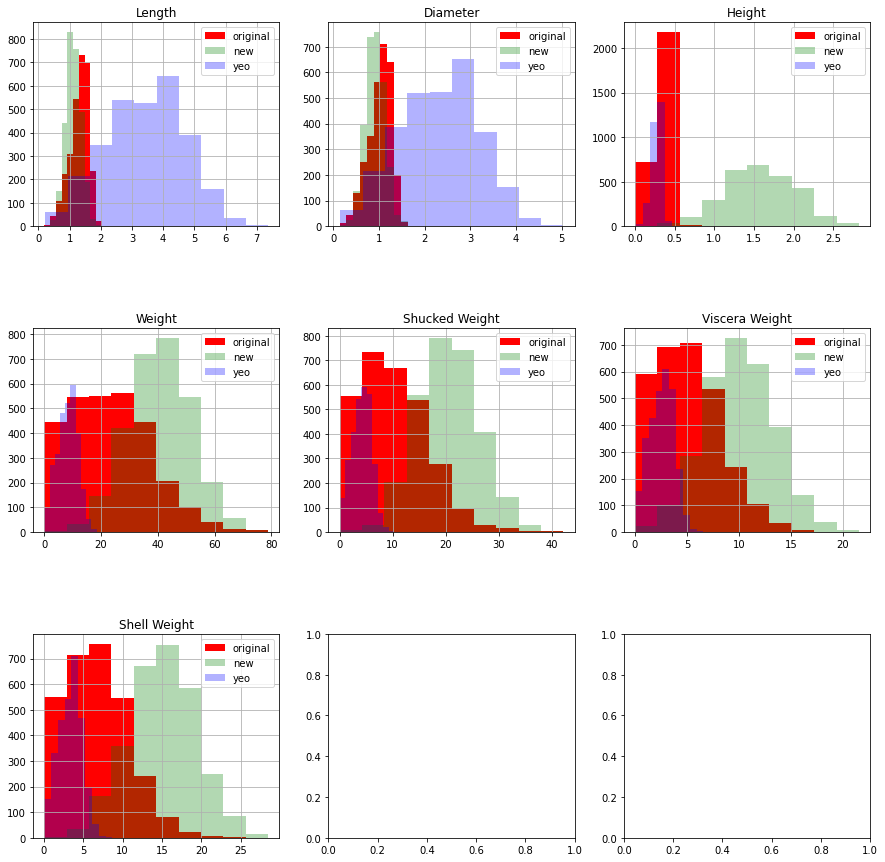

In [ ]:
plot_histograms(crab_train_X[crab_numeric_columns], 
                matched_crab_train_df_X[crab_numeric_columns], 
                yeo_crab_train_df_X[crab_numeric_columns])

## Plot a Heatmap of all columns to targets

In [ ]:
matched_crab_df_corr = pd.concat([matched_crab_train_df_X, crab_train_y], axis=1)
yeo_crab_df_corr = pd.concat([yeo_crab_train_df_X, crab_train_y], axis=1)

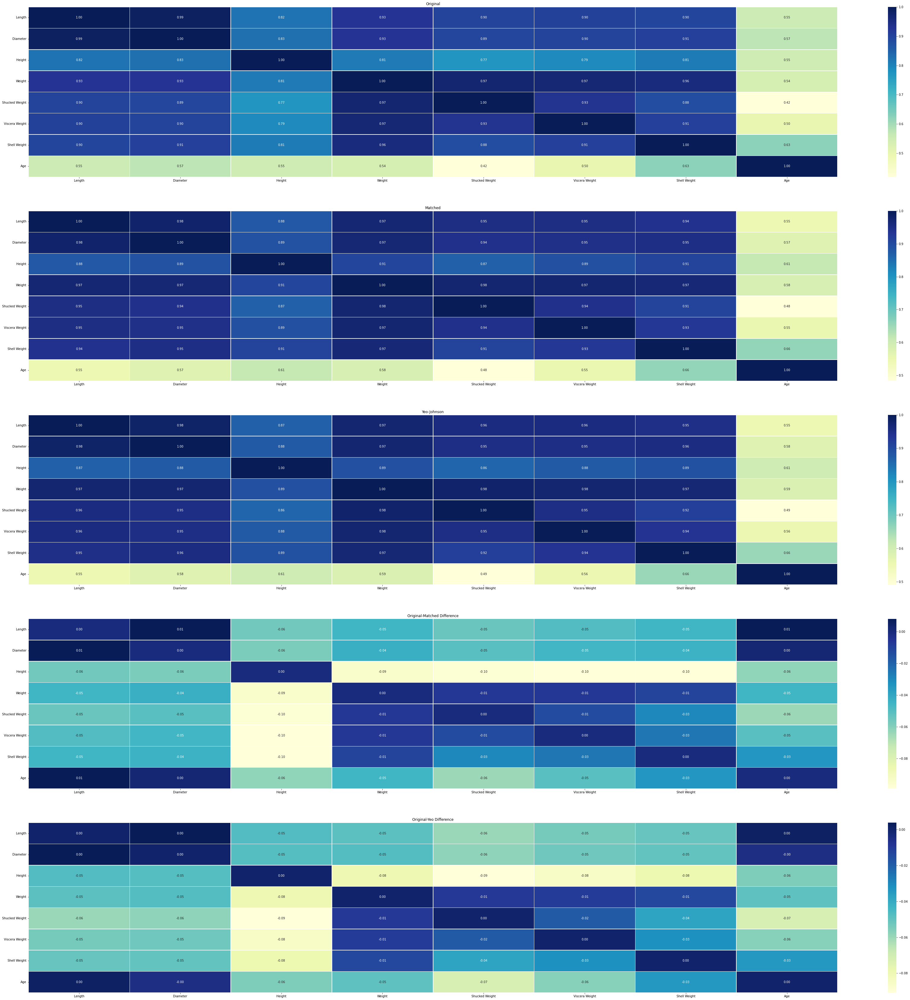

In [ ]:
plot_correlation_heatmaps(crab_df, matched_crab_df_corr, yeo_crab_df_corr, crab_numeric_columns + ['Age'])

In [ ]:
for column in crab_train_y.to_frame().columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_crab_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_crab_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: Age ===============
matched corr sum: 5.057262053516119
yeo corr sum: 5.080806313018459


In [ ]:
crab_diff_corr_df = pd.concat([
           matched_crab_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_crab_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')

crab_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
Length,7.264437,7.283629
Diameter,7.289778,7.313770
Height,7.004741,6.919993
Weight,7.376214,7.382667
Shucked Weight,7.092491,7.125468
Viscera Weight,7.227232,7.244910
Shell Weight,7.315539,7.322881
Sex,1.295716,1.292902
Age,5.057262,5.080806


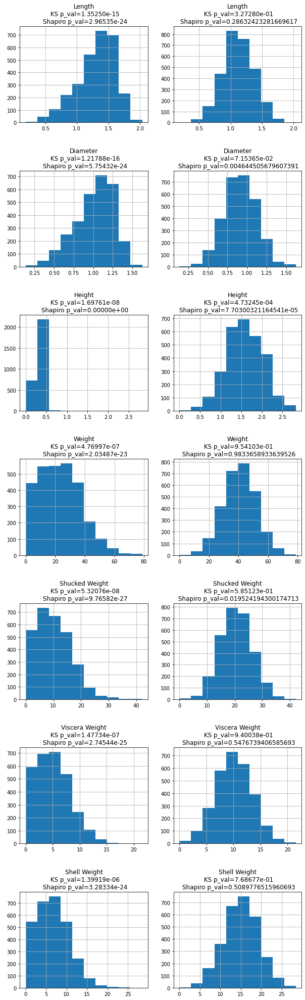

In [ ]:
plot_histograms_side_by_side(crab_train_X[crab_numeric_columns], matched_crab_train_df_X[crab_numeric_columns])

## Plot waterfall of each model

Plot for regular model

In [ ]:
# print(f'Plot for column: Age')
# model = LinearRegression()
# prediction = model.fit(crab_train_X,crab_train_y).predict(crab_test_X)
# plot_waterfall_coeficients(crab_train_X, crab_test_X, crab_test_y, prediction, model)

Plot for normalized model

In [ ]:
# print(f'Plot for column: Age')
# matched_model = LinearRegression()
# matched_prediction = matched_model.fit(matched_crab_train_df_X,crab_train_y).predict(matched_crab_test_df_X)
# plot_waterfall_coeficients(matched_crab_train_df_X, matched_crab_test_df_X, crab_test_y, matched_prediction, matched_model)

Plot for Yeo-Johnson model

In [ ]:
#     print(f'Plot for column: {column}')
#     plot_waterfall_coeficients(yeo_measures_train_df_X, yeo_measures_test_df_X, measures_test_df_y[column], yeo_prediction, yeo_model)

# Try on fourth Dataset (Classification)

https://www.kaggle.com/jsphyg/weather-dataset-rattle-package

## Preprocess Dataset

In [ ]:
!kaggle datasets download -d jsphyg/weather-dataset-rattle-package

  0% 0.00/3.83M [00:00<?, ?B/s]
100% 3.83M/3.83M [00:00<00:00, 62.2MB/s]


In [ ]:
# !cp '/content/drive/MyDrive/Colab Notebooks/Tabular DS/weatherAUS.csv.zip' -d './weatherAUS.csv.zip'

In [ ]:
!unzip -n ./weather-dataset-rattle-package.zip -d .
!rm -rf ./weather-dataset-rattle-package.zip

Archive:  ./weather-dataset-rattle-package.zip
  inflating: ./weatherAUS.csv        


In [ ]:
# !unzip -n ./weatherAUS.csv.zip -d .
# !rm -rf ./weatherAUS.csv.zip

In [ ]:
aus_df = pd.read_csv('./weatherAUS.csv')

In [ ]:
aus_df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [ ]:
aus_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [ ]:
print('Shape before droping N/A labels:', aus_df.shape)

Shape before droping N/A labels: (145460, 23)


In [ ]:
aus_df = aus_df[aus_df['RainToday'].notna()]
aus_df = aus_df[aus_df['RainTomorrow'].notna()]

print('Shape after droping N/A labels:', aus_df.shape)
aus_df.head()

Shape after droping N/A labels: (140787, 23)


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [ ]:
aus_df['RainToday'] = aus_df['RainToday'].astype('category')
aus_df['RainToday'] = aus_df['RainToday'].cat.codes
aus_df['RainTomorrow'] = aus_df['RainTomorrow'].astype('category')
aus_df['RainTomorrow'] = aus_df['RainTomorrow'].cat.codes

#### Handle dates data in dataset: split into Year, Month, Day

In [ ]:
aus_df[['DateYear', 'DateMonth', 'DateDay']] = aus_df['Date'].str.split('-', expand=True)

aus_df.drop('Date', axis=1, inplace=True)

aus_df.DateYear = aus_df.DateYear.astype('category')
aus_df.DateMonth = aus_df.DateMonth.astype('category')
aus_df.DateDay = aus_df.DateDay.astype('category')

aus_df.DateYear = aus_df.DateYear.cat.codes
aus_df.DateMonth = aus_df.DateMonth.cat.codes
aus_df.DateDay = aus_df.DateDay.cat.codes

In [ ]:
aus_train_df, aus_test_df = train_test_split(aus_df, test_size=0.25)

print(aus_train_df.shape)
print(aus_test_df.shape)

(105590, 25)
(35197, 25)


In [ ]:
aus_numeric_columns, aus_categorical_columns = get_numeric_categorical_columns(aus_train_df, ['RainToday', 'RainTomorrow'], threshold_prec=0.1)

column: Location, %: 0.046405909650535086
column: MinTemp, %: 0.6960886447580263
column: MaxTemp, %: 0.6894592290936642
column: Rainfall, %: 0.5852826972251159
column: Evaporation, %: 42.7474192631878
column: Sunshine, %: 47.68159863623449
column: WindGustDir, %: 0.016100009470593805
column: WindGustSpeed, %: 6.522397954351739
column: WindDir9am, %: 0.016100009470593805
column: WindDir3pm, %: 0.016100009470593805
column: WindSpeed9am, %: 0.7851122265366038
column: WindSpeed3pm, %: 1.8372951984089403
column: Humidity9am, %: 1.1705653944502319
column: Humidity3pm, %: 2.5902074060043563
column: Pressure9am, %: 10.31442371436689
column: Pressure3pm, %: 10.322947248792499
column: Cloud9am, %: 37.41547495027938
column: Cloud3pm, %: 39.927076427692015
column: Temp9am, %: 0.8703475707926888
column: Temp3pm, %: 2.3278719575717397
column: DateYear, %: 0.010417653186854815
column: DateMonth, %: 0.01136471256747798
column: DateDay, %: 0.02935884079931812
numeric_columns = ['MinTemp', 'MaxTemp', 'R

In [ ]:
print(aus_numeric_columns)
print(aus_categorical_columns)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'DateYear', 'DateMonth', 'DateDay']


#### Fill numerical and Categorical N/A values

In [ ]:
aus_df.isna().sum() / len(aus_df) * 100

Location          0.000000
MinTemp           0.332417
MaxTemp           0.218060
Rainfall          0.000000
Evaporation      42.400222
Sunshine         47.451114
WindGustDir       6.508413
WindGustSpeed     6.467216
WindDir9am        6.861429
WindDir3pm        2.606775
WindSpeed9am      0.749359
WindSpeed3pm      1.797751
Humidity9am       1.077514
Humidity3pm       2.486735
Pressure9am       9.761555
Pressure3pm       9.780022
Cloud9am         37.379161
Cloud3pm         39.843167
Temp9am           0.465952
Temp3pm           1.863808
RainToday         0.000000
RainTomorrow      0.000000
DateYear          0.000000
DateMonth         0.000000
DateDay           0.000000
dtype: float64

In [ ]:
for column in aus_numeric_columns:
    aus_train_df[column] = aus_train_df[column].fillna(aus_train_df[column].mean())

for column in aus_numeric_columns:
    aus_test_df[column] = aus_test_df[column].fillna(aus_test_df[column].mean())

In [ ]:
for column in aus_categorical_columns:
    aus_train_df[column] = aus_train_df[column].fillna('UNKNOWN')
    aus_train_df[column] = aus_train_df[column].astype('category')
    aus_train_df[column] = aus_train_df[column].cat.codes

for column in aus_categorical_columns:
    aus_test_df[column] = aus_test_df[column].fillna('UNKNOWN')
    aus_test_df[column] = aus_test_df[column].astype('category')
    aus_test_df[column] = aus_test_df[column].cat.codes

Test for N/A values again

In [ ]:
aus_train_df.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
DateYear         0
DateMonth        0
DateDay          0
dtype: int64

In [ ]:
aus_test_df.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
DateYear         0
DateMonth        0
DateDay          0
dtype: int64

In [ ]:
aus_test_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,DateYear,DateMonth,DateDay
93108,14,21.9,29.9,0.0,5.494607,7.641167,10,43.000000,8,9,...,1012.400000,4.445648,4.486237,25.3,28.6,0,0,10,0,4
17213,24,21.5,26.8,0.0,5.494607,7.641167,13,40.004315,9,9,...,1015.235943,8.000000,8.000000,22.9,25.8,0,0,8,0,4
53134,23,3.3,13.5,0.0,5.494607,7.641167,4,30.000000,9,3,...,1015.235943,4.445648,4.486237,9.9,11.5,0,0,4,11,7
109974,1,12.7,22.8,0.0,2.200000,8.200000,13,40.004315,6,16,...,1003.000000,7.000000,6.000000,19.5,20.2,0,1,5,10,2
30020,34,20.4,30.0,4.6,5.494607,7.641167,2,39.000000,9,3,...,1010.600000,8.000000,4.486237,23.2,28.1,1,0,10,0,20


#### Extract Target Features

In [ ]:
print(aus_train_df.columns)

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'DateYear', 'DateMonth',
       'DateDay'],
      dtype='object')


In [ ]:
aus_train_df_X = aus_train_df.drop(['RainToday', 'RainTomorrow'], axis=1)
aus_test_df_X = aus_test_df.drop(['RainToday', 'RainTomorrow'], axis=1)

aus_train_df_y = aus_train_df[['RainToday', 'RainTomorrow']]
aus_test_df_y = aus_test_df[['RainToday', 'RainTomorrow']]

In [ ]:
print('aus_train_df_X.shape ==',aus_train_df_X.shape)
print('aus_test_df_X.shape ==',aus_test_df_X.shape)
print('aus_train_df_y.shape ==',aus_train_df_y.shape)
print('aus_test_df_y.shape ==',aus_test_df_y.shape)

aus_train_df_X.shape == (105590, 23)
aus_test_df_X.shape == (35197, 23)
aus_train_df_y.shape == (105590, 2)
aus_test_df_y.shape == (35197, 2)


In [ ]:
aus_train_df_X.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,DateYear,DateMonth,DateDay
55067,23,2.2,9.9,0.0,5.465129,7.626972,7,31.0,0,15,...,78.0,1017.666607,1015.265314,4.426324,4.50361,6.9,8.4,10,4,21
98140,0,10.7,24.8,0.0,5.465129,10.500000,3,30.0,7,7,...,50.0,1013.400000,1008.900000,4.426324,4.50361,16.9,22.0,6,8,21
66258,19,12.0,18.8,0.2,3.400000,11.200000,8,43.0,10,8,...,52.0,1026.000000,1024.600000,6.000000,1.00000,14.1,17.1,7,10,26
32721,37,18.0,22.5,2.4,6.600000,6.600000,8,61.0,16,10,...,69.0,1018.500000,1019.600000,6.000000,7.00000,19.4,20.0,8,3,18
51263,40,7.1,15.4,2.0,5.465129,7.626972,10,43.0,3,10,...,69.0,1019.100000,1021.700000,4.426324,4.50361,12.6,10.4,8,3,18


In [ ]:
aus_train_numerical_df_X = aus_train_df_X.drop(aus_categorical_columns, axis=1)
aus_train_categorical_df_X = aus_train_df_X.drop(aus_numeric_columns, axis=1)

aus_test_numerical_df_X = aus_test_df_X.drop(aus_categorical_columns, axis=1)
aus_test_categorical_df_X = aus_test_df_X.drop(aus_numeric_columns, axis=1)

## Visualize histograms of features

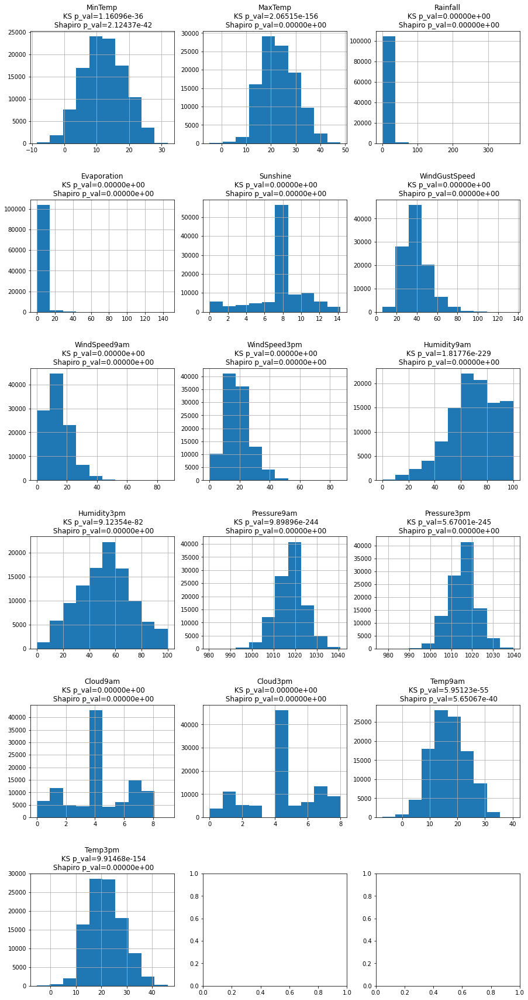

In [ ]:
plot_numerical_histograms(aus_train_df_X, aus_numeric_columns)

### Compare Histogram-Matching to Yeo-Johnson

Correction: MinTemp
Correction: MaxTemp
Correction: Rainfall
Correction: Evaporation
Correction: Sunshine
Correction: WindGustSpeed
Correction: WindSpeed9am
Correction: WindSpeed3pm
Correction: Humidity9am
Correction: Humidity3pm
Correction: Pressure9am
Correction: Pressure3pm
Correction: Cloud9am
Correction: Cloud3pm
Correction: Temp9am
Correction: Temp3pm


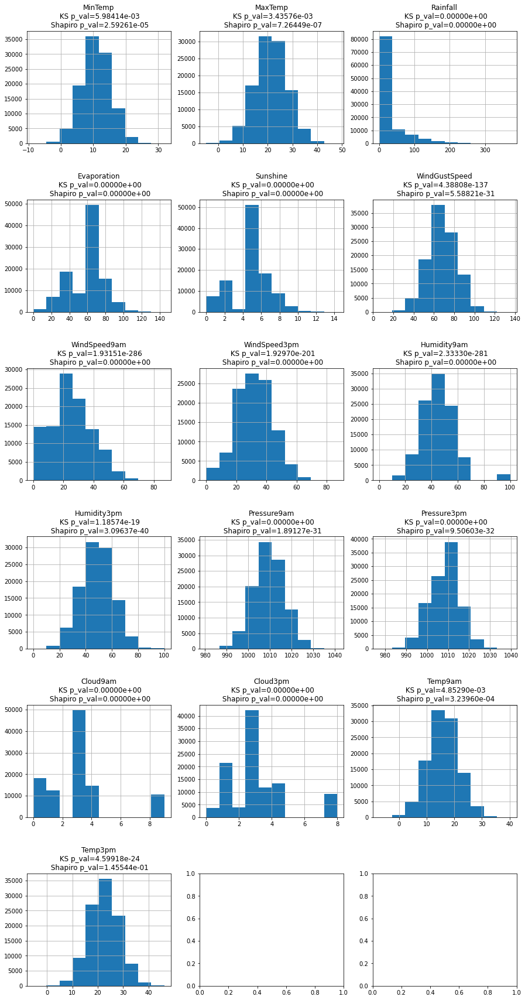

In [ ]:
matched_aus_train_df_X, train_df_X_normal_mapping = transform_dataset(aus_train_numerical_df_X,\
                                                                      match_to_normal_distribution,\
                                                                      correction=correction_func)

matched_aus_train_df_X_not, train_df_X_normal_mapping_not = transform_dataset(aus_train_numerical_df_X,\
                                                                      match_to_normal_distribution)

plot_numerical_histograms(matched_aus_train_df_X, aus_numeric_columns)

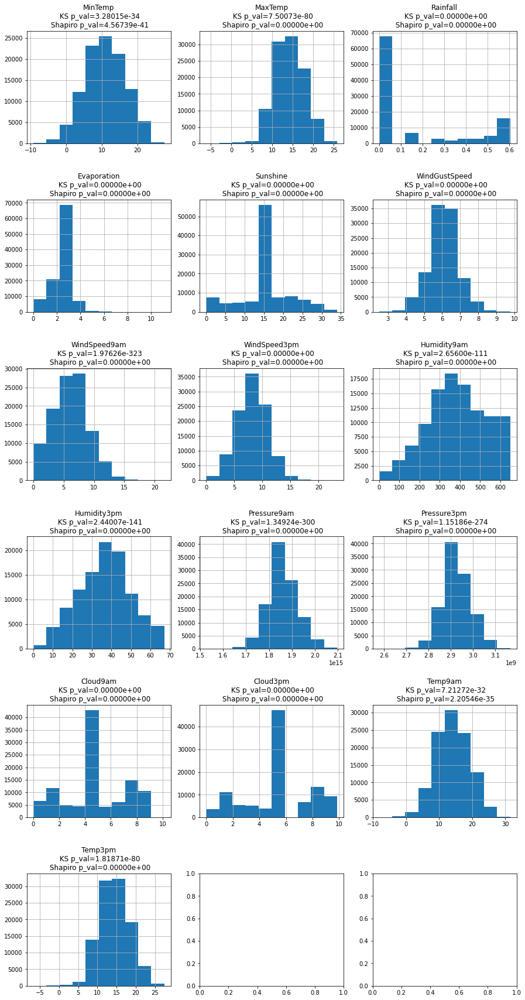

In [ ]:
yeo_aus_train_df_X, train_df_X_yeo_mapping = transform_dataset(aus_train_numerical_df_X, stats.yeojohnson)
plot_numerical_histograms(yeo_aus_train_df_X, aus_numeric_columns)

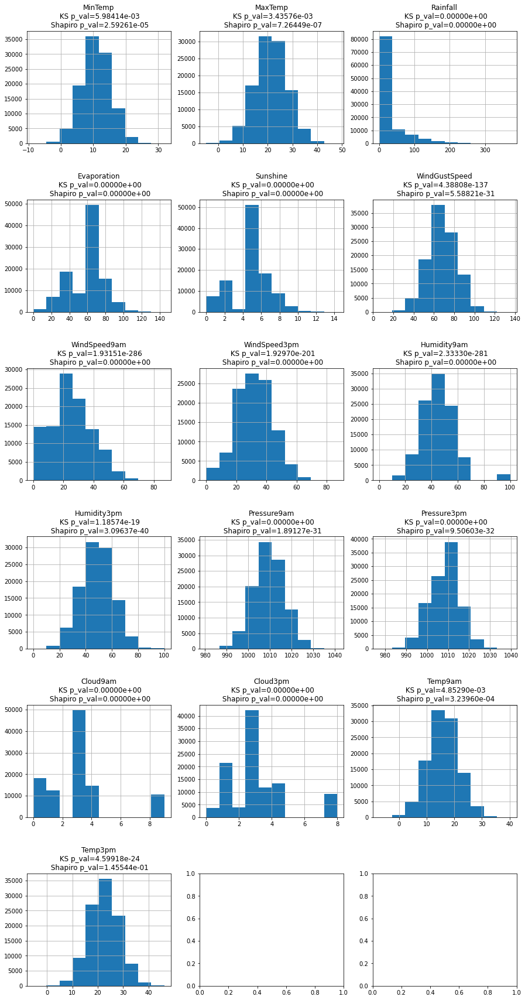

In [ ]:
matched_aus_test_df_X, _ = transform_dataset(aus_test_numerical_df_X, match_to_normal_distribution, train_df_X_normal_mapping)
plot_numerical_histograms(matched_aus_train_df_X, aus_numeric_columns)

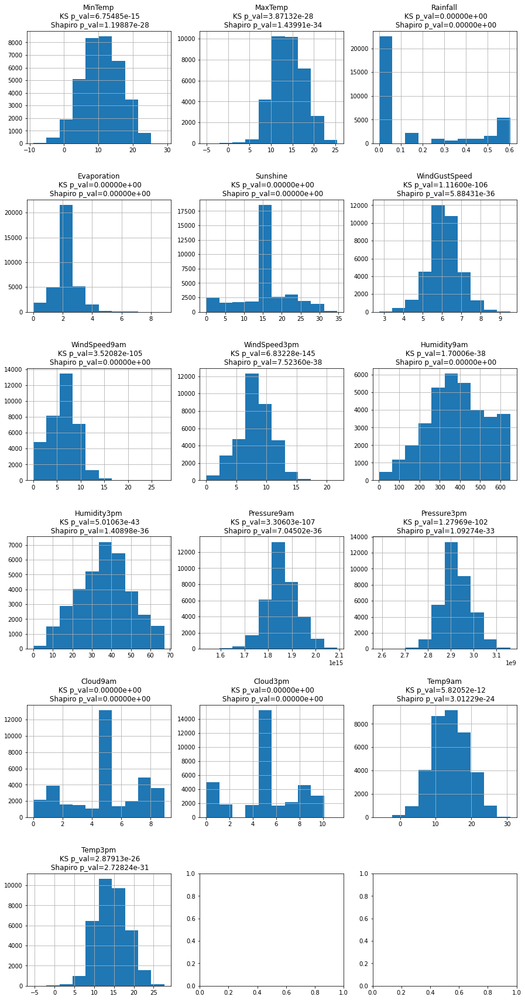

In [ ]:
yeo_aus_test_df_X, _ = transform_dataset(aus_test_numerical_df_X, stats.yeojohnson, train_df_X_yeo_mapping)
plot_numerical_histograms(yeo_aus_test_df_X, aus_numeric_columns)

## QQ plots of features

### QQ plots for regular features

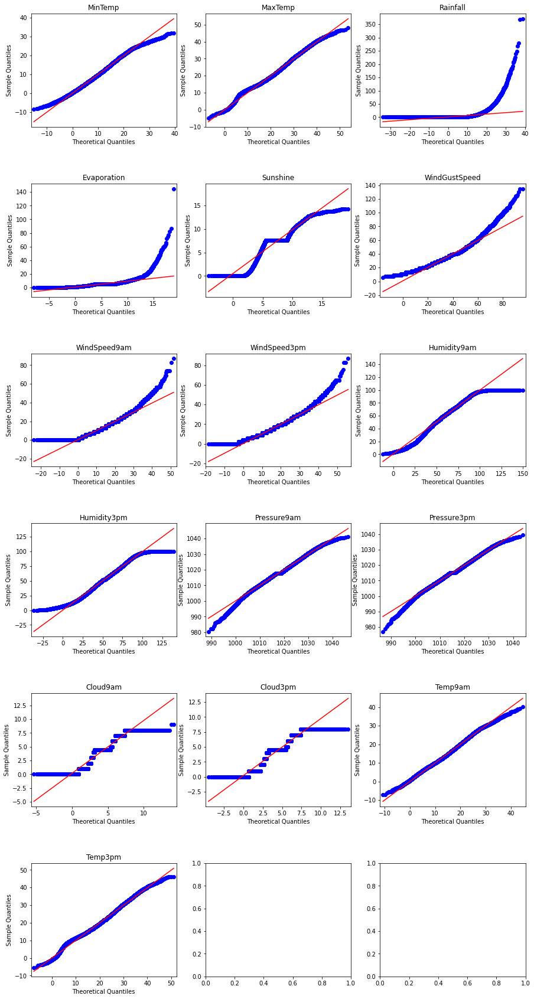

In [ ]:
qq_plot_data(aus_train_df_X, aus_numeric_columns)

### QQ plots for Matched features

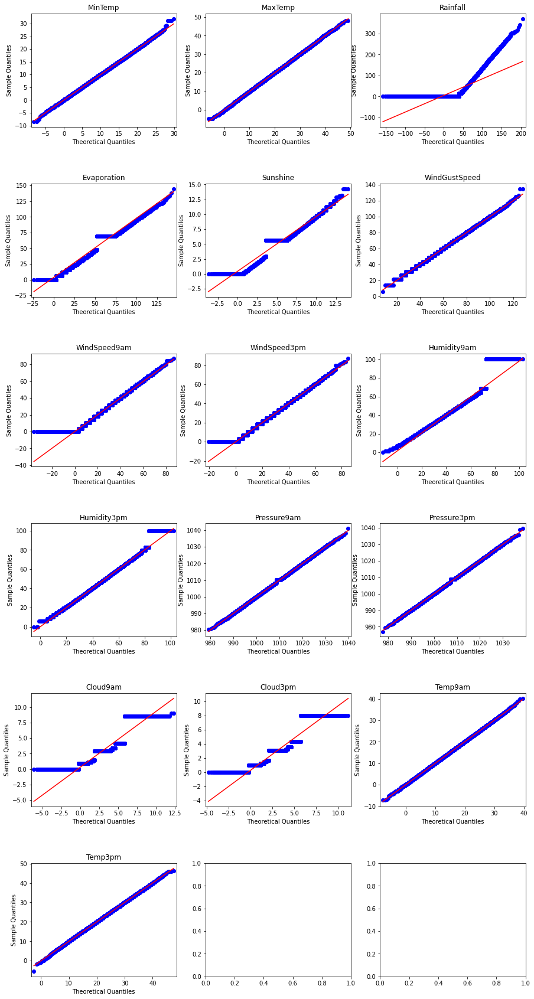

In [ ]:
qq_plot_data(matched_aus_train_df_X, aus_numeric_columns)

### QQ plots for Yeo-Johnson features

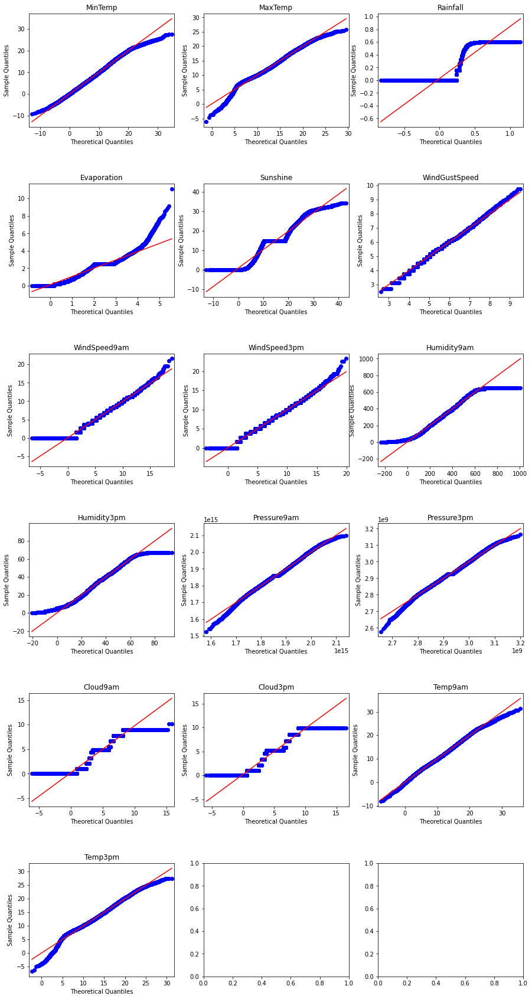

In [ ]:
qq_plot_data(yeo_aus_train_df_X, aus_numeric_columns)

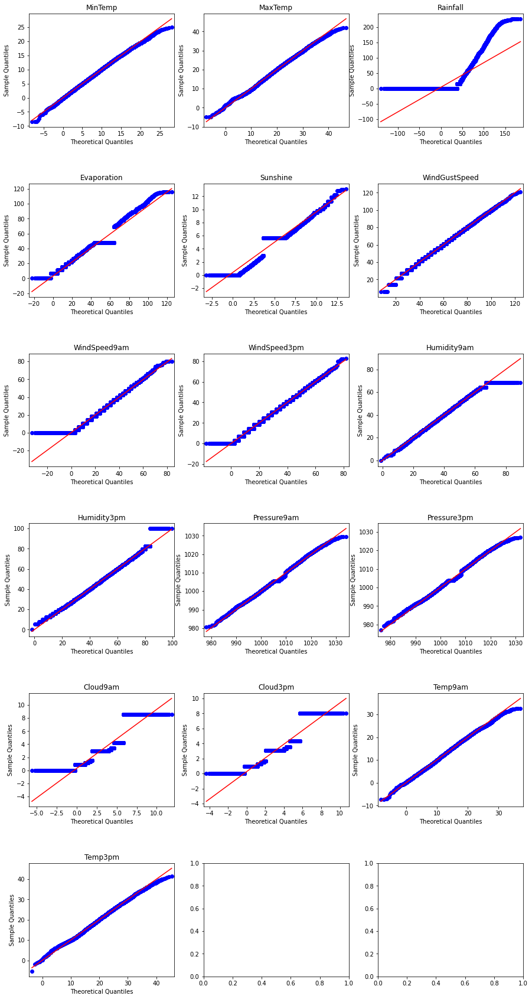

In [ ]:
qq_plot_data(matched_aus_test_df_X, aus_numeric_columns)

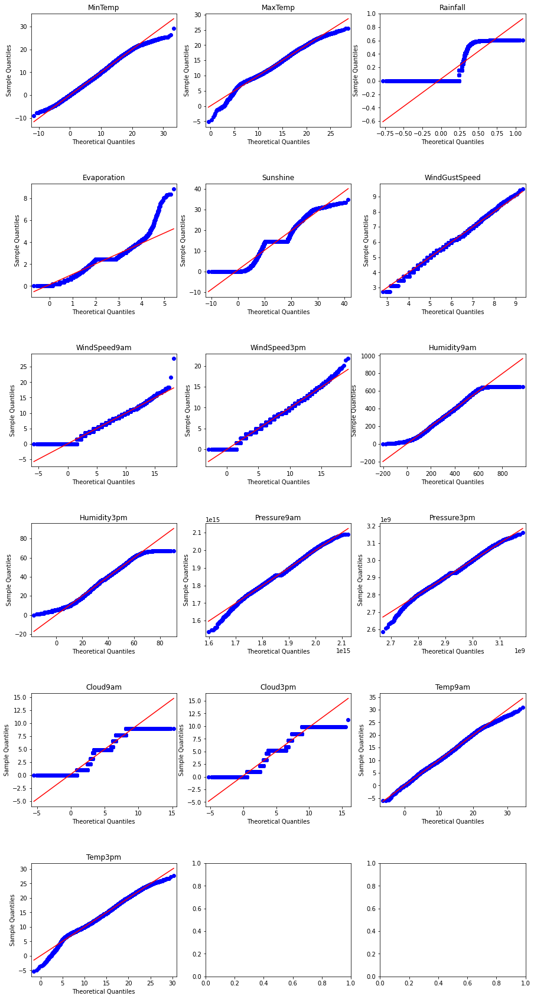

In [ ]:
qq_plot_data(yeo_aus_test_df_X, aus_numeric_columns)

## Compare model preformance

#### Reassemble datasets

In [ ]:
aus_train_df_X = pd.concat([aus_train_numerical_df_X, aus_train_categorical_df_X], axis=1)

aus_test_df_X = pd.concat([aus_test_numerical_df_X, aus_test_categorical_df_X], axis=1)

In [ ]:
matched_aus_train_df_X = pd.concat([matched_aus_train_df_X, aus_train_categorical_df_X], axis=1)

matched_aus_test_df_X = pd.concat([matched_aus_test_df_X, aus_test_categorical_df_X], axis=1)

In [ ]:
aus_train_df_X = pd.concat([yeo_aus_train_df_X, aus_train_categorical_df_X], axis=1)

aus_test_df_X = pd.concat([yeo_aus_test_df_X, aus_test_categorical_df_X], axis=1)

### Test on regular data

In [ ]:
for column in aus_test_df_y:
    model = LogisticRegression()
    prediction = model.fit(aus_train_df_X,aus_train_df_y[column]).predict(aus_test_df_X)
    print(f'column={column}, acc={accuracy_score(aus_test_df_y[column],prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(aus_test_df_y[column],prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(aus_test_df_y[column], prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(aus_test_df_y[column], prediction))))
    print('=' * 50)

column=RainToday, acc=0.7745546495439952
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.225
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0
column=RainTomorrow, acc=0.778020854050061
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.222
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


### Test on matched data

In [ ]:
for column in aus_test_df_y:
    matched_model = LogisticRegression()
    matched_prediction = matched_model.fit(matched_aus_train_df_X,aus_train_df_y[column]).predict(matched_aus_test_df_X)
    print(f'column={column}, acc={accuracy_score(aus_test_df_y[column], matched_prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(aus_test_df_y[column],matched_prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(aus_test_df_y[column], matched_prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(aus_test_df_y[column], matched_prediction))))
    print('=' * 50)

column=RainToday, acc=0.9999715884876552
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.000
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0
column=RainTomorrow, acc=0.8409523538937977
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 165,572,574,873,353.594
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


### Test on Yeo-Johnson data

In [ ]:
for column in aus_test_df_y:
    yeo_model = LogisticRegression()
    yeo_prediction = yeo_model.fit(yeo_aus_train_df_X,aus_train_df_y[column]).predict(yeo_aus_test_df_X)
    print(f'column={column}, acc={accuracy_score(aus_test_df_y[column], yeo_prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(aus_test_df_y[column],yeo_prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(aus_test_df_y[column], yeo_prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(aus_test_df_y[column], yeo_prediction))))
    print('=' * 50)

column=RainToday, acc=0.7745546495439952
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.225
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0
column=RainTomorrow, acc=0.778020854050061
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.222
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


## Try to normalize only 1 column at a time and Compare to regular model

In [ ]:
for column in aus_test_df_y:
    compare_one_norm_column(aus_train_df_X, aus_test_df_X, aus_train_df_y[column],\
                            aus_test_df_y[column], matched_aus_train_df_X, matched_aus_test_df_X,\
                            yeo_aus_train_df_X, yeo_aus_test_df_X, column, aus_numeric_columns, acc=True)

=== Measure for regular model: ===
column=RainToday, acc=0.7745546495439952
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.225
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0

=== Compare for column MinTemp ===
column=MinTemp, matched acc=0.7745546495439952
column=MinTemp, yeo acc=0.7745546495439952

=== Compare for column MaxTemp ===
column=MaxTemp, matched acc=0.7745546495439952
column=MaxTemp, yeo acc=0.7745546495439952

=== Compare for column Rainfall ===
column=Rainfall, matched acc=0.7745546495439952
column=Rainfall, yeo acc=0.7745546495439952

=== Compare for column Evaporation ===
column=Evaporation, matched acc=0.7745546495439952
column=Evaporation, yeo acc=0.7745546495439952

=== Compare for column Sunshine ===
column=Sunshine, matched acc=0.7745546495439952
column=Sunshine, yeo acc=0.7745546495439952

=== Compare for column WindGustSpeed ===
column=WindGustSpeed, matched acc=0.7745546495439952
column=WindGustSpeed, yeo acc=0.7745546

## Get insights about the data

In [ ]:
aus_insights = get_insights(aus_train_df_X[aus_numeric_columns])
aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-9.273940e+00,2.752040e+01,1.092345e+01,1.084796e+01,5.563055e+00,3.094758e+01,-0.067148,-0.390021,5.567205
MaxTemp,-6.143103e+00,2.580427e+01,1.417106e+01,1.401234e+01,3.598351e+00,1.294813e+01,0.030816,-0.035836,5.659795
Rainfall,-0.000000e+00,6.034079e-01,1.571602e-01,-0.000000e+00,2.322740e-01,5.395123e-02,1.006361,-0.755409,2.142761
Evaporation,0.000000e+00,1.113286e+01,2.355637e+00,2.472827e+00,7.483970e-01,5.600980e-01,0.112365,3.232810,3.115212
Sunshine,0.000000e+00,3.404001e+01,1.511318e+01,1.459161e+01,6.516085e+00,4.245936e+01,-0.047091,0.586974,3.224291
WindGustSpeed,2.514966e+00,9.753697e+00,6.066655e+00,6.101849e+00,8.103121e-01,6.566057e-01,0.013493,0.495552,3.374189
WindSpeed9am,0.000000e+00,2.159452e+01,6.189055e+00,6.270806e+00,2.969986e+00,8.820814e+00,-0.058383,-0.042486,2.914490
WindSpeed3pm,0.000000e+00,2.332088e+01,8.142998e+00,8.393370e+00,2.749306e+00,7.558682e+00,0.020378,0.248447,2.975303
Humidity9am,0.000000e+00,6.477139e+02,3.839848e+02,3.829440e+02,1.453141e+02,2.111619e+04,-0.111062,-0.568008,4.285934
Humidity3pm,0.000000e+00,6.709054e+01,3.663961e+01,3.695301e+01,1.338538e+01,1.791684e+02,-0.080961,-0.416630,4.429991


In [ ]:
matched_aus_insights = get_insights(matched_aus_train_df_X[aus_numeric_columns])
matched_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-8.5,31.9,10.866385,10.852659,4.447747,19.782453,0.000217,0.032873,5.567205
MaxTemp,-4.8,48.1,21.380271,21.365701,6.481589,42.011001,0.003736,0.026635,5.659795
Rainfall,0.0,371.0,23.360345,0.000000,42.450876,1802.076846,2.234896,5.258313,2.142761
Evaporation,0.0,145.0,60.699301,69.085898,19.773110,390.975878,-0.555429,-0.305277,3.115212
Sunshine,0.0,14.3,5.190428,5.659932,2.076091,4.310153,-0.711441,0.314268,3.224291
WindGustSpeed,6.0,135.0,68.126516,67.902245,14.029626,196.830402,-0.000199,-0.018184,3.374189
WindSpeed9am,0.0,87.0,25.342843,25.059311,14.384965,206.927231,0.214536,-0.341684,2.914490
WindSpeed3pm,0.0,87.0,32.096662,30.848851,12.357263,152.701946,0.049494,-0.076578,2.975303
Humidity9am,0.0,100.0,45.465925,45.134041,13.398708,179.525382,1.084088,3.747974,4.285934
Humidity3pm,0.0,100.0,48.679964,48.492473,12.552597,157.567692,0.124752,0.381441,4.429991


In [ ]:
matched_not_aus_insights = get_insights(matched_aus_train_df_X_not[aus_numeric_columns])
matched_not_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-15.972485,39.747471,12.217016,12.183687,6.397091,40.922779,0.009771,0.008692,5.567205
MaxTemp,-7.181230,53.645471,23.288647,23.292335,7.088572,50.247858,0.004674,0.006397,5.659795
Rainfall,5.495597,37.991823,7.639676,5.495597,3.886291,15.103257,2.217787,5.159121,2.142761
Evaporation,-3.828562,17.922163,6.312044,7.696911,3.245342,10.532245,-0.566777,-0.293167,3.115212
Sunshine,1.780867,20.786524,8.461631,9.058845,2.672618,7.142888,-0.709259,0.326376,3.224291
WindGustSpeed,-17.768957,96.917940,40.925291,40.665587,12.859846,165.375630,0.016871,0.014700,3.374189
WindSpeed9am,0.369925,52.304766,15.034154,14.869284,8.333140,69.441227,0.224638,-0.316839,2.914490
WindSpeed3pm,-2.467170,55.507285,19.635529,18.789828,8.555027,73.188487,0.044812,-0.093320,2.975303
Humidity9am,-24.148032,150.928218,70.153945,69.791031,21.261190,452.038198,0.831872,2.613908,4.285934
Humidity3pm,-40.844086,140.390345,52.133421,51.846753,20.707117,428.784695,0.146073,0.519153,4.429991


In [ ]:
yeo_aus_insights = get_insights(yeo_aus_train_df_X[aus_numeric_columns])
yeo_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-9.273940e+00,2.752040e+01,1.092345e+01,1.084796e+01,5.563055e+00,3.094758e+01,-0.067148,-0.390021,5.567205
MaxTemp,-6.143103e+00,2.580427e+01,1.417106e+01,1.401234e+01,3.598351e+00,1.294813e+01,0.030816,-0.035836,5.659795
Rainfall,-0.000000e+00,6.034079e-01,1.571602e-01,-0.000000e+00,2.322740e-01,5.395123e-02,1.006361,-0.755409,2.142761
Evaporation,0.000000e+00,1.113286e+01,2.355637e+00,2.472827e+00,7.483970e-01,5.600980e-01,0.112365,3.232810,3.115212
Sunshine,0.000000e+00,3.404001e+01,1.511318e+01,1.459161e+01,6.516085e+00,4.245936e+01,-0.047091,0.586974,3.224291
WindGustSpeed,2.514966e+00,9.753697e+00,6.066655e+00,6.101849e+00,8.103121e-01,6.566057e-01,0.013493,0.495552,3.374189
WindSpeed9am,0.000000e+00,2.159452e+01,6.189055e+00,6.270806e+00,2.969986e+00,8.820814e+00,-0.058383,-0.042486,2.914490
WindSpeed3pm,0.000000e+00,2.332088e+01,8.142998e+00,8.393370e+00,2.749306e+00,7.558682e+00,0.020378,0.248447,2.975303
Humidity9am,0.000000e+00,6.477139e+02,3.839848e+02,3.829440e+02,1.453141e+02,2.111619e+04,-0.111062,-0.568008,4.285934
Humidity3pm,0.000000e+00,6.709054e+01,3.663961e+01,3.695301e+01,1.338538e+01,1.791684e+02,-0.080961,-0.416630,4.429991


In [ ]:
aus_insights - matched_not_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,6.698545e+00,-1.222707e+01,-1.293566e+00,-1.335729e+00,-8.340368e-01,-9.975202e+00,-0.076919,-0.398713,0.0
MaxTemp,1.038127e+00,-2.784120e+01,-9.117584e+00,-9.280000e+00,-3.490221e+00,-3.729973e+01,0.026142,-0.042233,0.0
Rainfall,-5.495597e+00,-3.738842e+01,-7.482516e+00,-5.495597e+00,-3.654017e+00,-1.504931e+01,-1.211425,-5.914530,0.0
Evaporation,3.828562e+00,-6.789308e+00,-3.956408e+00,-5.224084e+00,-2.496945e+00,-9.972147e+00,0.679142,3.525977,0.0
Sunshine,-1.780867e+00,1.325348e+01,6.651544e+00,5.532766e+00,3.843466e+00,3.531647e+01,0.662168,0.260597,0.0
WindGustSpeed,2.028392e+01,-8.716424e+01,-3.485864e+01,-3.456374e+01,-1.204953e+01,-1.647190e+02,-0.003378,0.480852,0.0
WindSpeed9am,-3.699250e-01,-3.071025e+01,-8.845099e+00,-8.598478e+00,-5.363155e+00,-6.062041e+01,-0.283022,0.274353,0.0
WindSpeed3pm,2.467170e+00,-3.218640e+01,-1.149253e+01,-1.039646e+01,-5.805721e+00,-6.562980e+01,-0.024434,0.341767,0.0
Humidity9am,2.414803e+01,4.967857e+02,3.138309e+02,3.131530e+02,1.240529e+02,2.066416e+04,-0.942934,-3.181916,0.0
Humidity3pm,4.084409e+01,-7.329980e+01,-1.549381e+01,-1.489374e+01,-7.321738e+00,-2.496163e+02,-0.227035,-0.935783,0.0


In [ ]:
aus_insights - matched_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-7.739401e-01,-4.379596e+00,5.706482e-02,-4.701081e-03,1.115308e+00,1.116512e+01,-0.067365,-0.422893,0.0
MaxTemp,-1.343103e+00,-2.229573e+01,-7.209208e+00,-7.353366e+00,-2.883238e+00,-2.906287e+01,0.027080,-0.062471,0.0
Rainfall,-0.000000e+00,-3.703966e+02,-2.320318e+01,-0.000000e+00,-4.221860e+01,-1.802023e+03,-1.228535,-6.013722,0.0
Evaporation,0.000000e+00,-1.338671e+02,-5.834366e+01,-6.661307e+01,-1.902471e+01,-3.904158e+02,0.667793,3.538087,0.0
Sunshine,0.000000e+00,1.974001e+01,9.922748e+00,8.931679e+00,4.439994e+00,3.814921e+01,0.664350,0.272706,0.0
WindGustSpeed,-3.485034e+00,-1.252463e+02,-6.205986e+01,-6.180040e+01,-1.321931e+01,-1.961738e+02,0.013692,0.513737,0.0
WindSpeed9am,0.000000e+00,-6.540548e+01,-1.915379e+01,-1.878850e+01,-1.141498e+01,-1.981064e+02,-0.272919,0.299198,0.0
WindSpeed3pm,0.000000e+00,-6.367912e+01,-2.395366e+01,-2.245548e+01,-9.607957e+00,-1.451433e+02,-0.029116,0.325025,0.0
Humidity9am,0.000000e+00,5.477139e+02,3.385189e+02,3.378100e+02,1.319154e+02,2.093667e+04,-1.195150,-4.315983,0.0
Humidity3pm,0.000000e+00,-3.290946e+01,-1.204035e+01,-1.153946e+01,8.327818e-01,2.160067e+01,-0.205713,-0.798071,0.0


In [ ]:
aus_insights - yeo_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MaxTemp,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Rainfall,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Evaporation,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Sunshine,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WindGustSpeed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WindSpeed9am,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WindSpeed3pm,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Humidity9am,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Humidity3pm,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Plot distributions

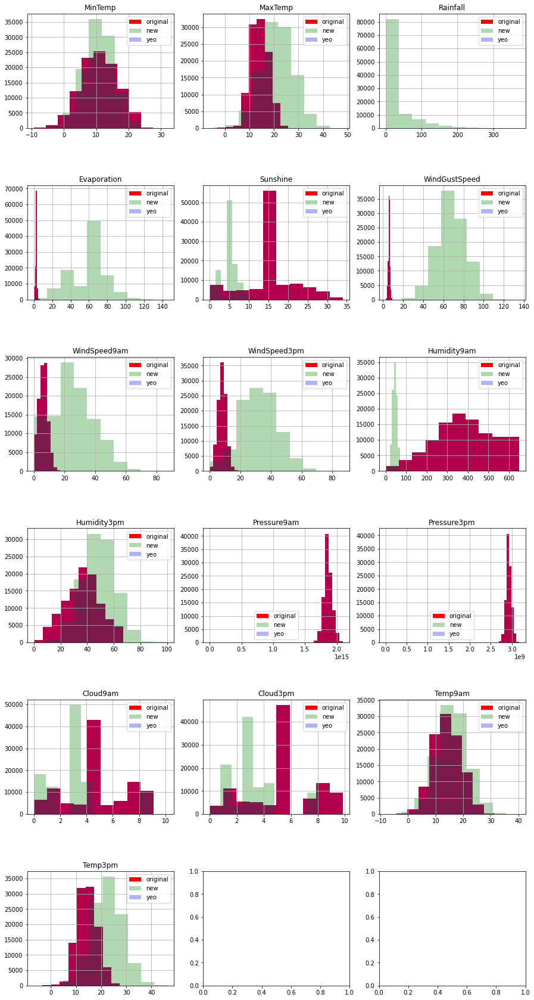

In [ ]:
plot_histograms(aus_train_df_X[aus_numeric_columns], 
                matched_aus_train_df_X[aus_numeric_columns], 
                yeo_aus_train_df_X[aus_numeric_columns])

## Plot a Heatmap of all columns to targets

In [ ]:
matched_aus_df_corr = pd.concat([matched_aus_train_df_X, aus_train_df_y], axis=1)
yeo_aus_df_corr = pd.concat([yeo_aus_train_df_X, aus_train_df_y], axis=1)

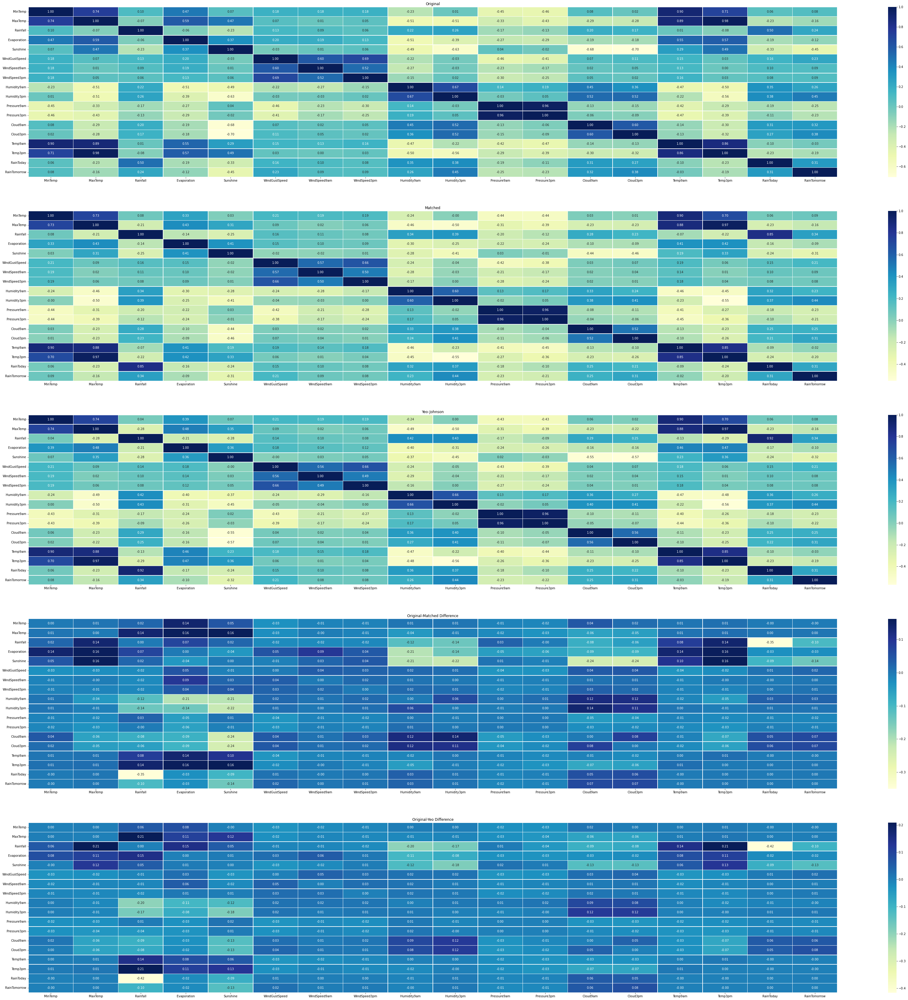

In [ ]:
plot_correlation_heatmaps(aus_df, matched_aus_df_corr, yeo_aus_df_corr, aus_numeric_columns + ['RainToday', 'RainTomorrow'])

In [ ]:
for column in aus_train_df_y.columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_aus_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_aus_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: RainToday ===============
matched corr sum: 5.369838491184143
yeo corr sum: 5.058397626161063
=============== Compare sum of corr for target column: RainTomorrow ===============
matched corr sum: 4.725455794448333
yeo corr sum: 4.617662997595197


In [ ]:
aus_diff_corr_df = pd.concat([
           matched_aus_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_aus_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')
    
aus_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
MinTemp,6.279098,5.749665
MaxTemp,8.089707,7.408292
Rainfall,5.460993,5.457023
Evaporation,5.296285,5.610631
Sunshine,4.996548,5.284223
WindGustSpeed,5.119187,4.647890
WindSpeed9am,3.914619,3.643406
WindSpeed3pm,4.008761,3.746660
Humidity9am,6.640028,6.778027
Humidity3pm,5.961052,5.903640


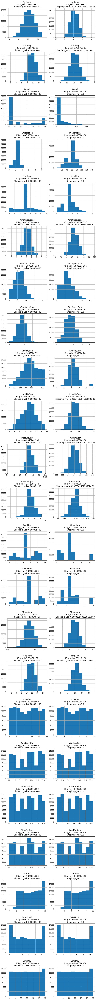

In [ ]:
plot_histograms_side_by_side(aus_train_df_X, matched_aus_train_df_X)

## Plot waterfall of each model

### Plot for regular model

In [ ]:
# for column in aus_test_df_y:
#     print(f'Plot for column: {column}')
#     model = LogisticRegression()
#     prediction = model.fit(aus_train_df_X,aus_train_df_y[column]).predict(aus_test_df_X)
#     plot_waterfall_coeficients(aus_train_df_X, aus_test_df_X, aus_test_df_y[column], prediction, model, sample_size=1000)

### Plot for normalized model

In [ ]:
# for column in aus_test_df_y:
#     print(f'Plot for column: {column}')
#     matched_model = LogisticRegression()
#     matched_prediction = matched_model.fit(matched_aus_train_df_X,aus_train_df_y[column]).predict(matched_aus_test_df_X)
#     plot_waterfall_coeficients(matched_aus_train_df_X, matched_aus_test_df_X, aus_test_df_y, matched_prediction, matched_model, sample_size=1000)

### Plot for Yeo-Johnson model

In [ ]:
# for column in aus_test_df_y:
#     print(f'Plot for column: {column}')
#     plot_waterfall_coeficients(yeo_aus_train_df_X, yeo_aus_test_df_X, aus_test_df_y, yeo_prediction, yeo_model, sample_size=1000)

# Try on Fifth Dataset (Classification)

https://www.kaggle.com/ruslankl/mice-protein-expression

In [ ]:
!kaggle datasets download -d ruslankl/mice-protein-expression

  0% 0.00/423k [00:00<?, ?B/s]
100% 423k/423k [00:00<00:00, 27.4MB/s]


In [ ]:
# !cp '/content/drive/MyDrive/Colab Notebooks/Tabular DS/Data_Cortex_Nuclear.csv' -d './Data_Cortex_Nuclear.csv'

In [ ]:
!unzip -n mice-protein-expression.zip -d .
!rm -rf ./mice-protein-expression.zip

Archive:  mice-protein-expression.zip
  inflating: ./Data_Cortex_Nuclear.csv  


In [ ]:
mice_df = pd.read_csv('Data_Cortex_Nuclear.csv')

In [ ]:
mice_df.describe()

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N
count,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,...,1080.000000,867.000000,795.000000,1080.000000,1005.000000,1080.000000,900.000000,870.000000,810.000000,1080.000000
mean,0.425810,0.617102,0.319088,2.297269,3.843934,0.233168,0.181846,3.537109,0.212574,1.428682,...,0.226676,0.157914,0.134762,0.121521,0.131053,0.446073,0.169609,0.183135,0.205440,1.337784
std,0.249362,0.251640,0.049383,0.347293,0.933100,0.041634,0.027042,1.295169,0.032587,0.466904,...,0.028989,0.029537,0.027417,0.014276,0.023863,0.066432,0.059402,0.040406,0.055514,0.317126
min,0.145327,0.245359,0.115181,1.330831,1.737540,0.063236,0.064043,1.343998,0.112812,0.429032,...,0.155869,0.088305,0.080657,0.067254,0.085419,0.258626,0.079691,0.105537,0.101787,0.586479
25%,0.288121,0.473361,0.287444,2.057411,3.155678,0.205755,0.164595,2.479834,0.190823,1.203665,...,0.206395,0.136424,0.115554,0.110839,0.113506,0.398082,0.125848,0.155121,0.165143,1.081423
50%,0.366378,0.565782,0.316564,2.296546,3.760855,0.231177,0.182302,3.326520,0.210594,1.355846,...,0.224000,0.152313,0.129468,0.121626,0.126523,0.448459,0.158240,0.174935,0.193994,1.317441
75%,0.487711,0.698032,0.348197,2.528481,4.440011,0.257261,0.197418,4.481940,0.234595,1.561316,...,0.241655,0.174017,0.148235,0.131955,0.143652,0.490773,0.197876,0.204542,0.235215,1.585824
max,2.516367,2.602662,0.497160,3.757641,8.482553,0.539050,0.317066,7.464070,0.306247,6.113347,...,0.358289,0.282016,0.261506,0.158748,0.256529,0.759588,0.479763,0.360692,0.413903,2.129791


In [ ]:
mice_df.head()

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m


In [ ]:
mice_df.shape

(1080, 82)

Remove Mouse ID column

In [ ]:
mice_df.drop('MouseID', axis=1, inplace=True)

## Preprocess Dataset

In [ ]:
mice_df.isna().sum()

DYRK1A_N     3
ITSN1_N      3
BDNF_N       3
NR1_N        3
NR2A_N       3
            ..
CaNA_N       0
Genotype     0
Treatment    0
Behavior     0
class        0
Length: 81, dtype: int64

In [ ]:
mice_numeric_columns = mice_df.dtypes[(mice_df.dtypes=="float64") | (mice_df.dtypes=="int64")].index.tolist()
mice_categorical_columns = mice_df.dtypes[~((mice_df.dtypes=="float64") | (mice_df.dtypes=="int64"))].index.tolist()

print(mice_numeric_columns)
print(mice_categorical_columns)

['DYRK1A_N', 'ITSN1_N', 'BDNF_N', 'NR1_N', 'NR2A_N', 'pAKT_N', 'pBRAF_N', 'pCAMKII_N', 'pCREB_N', 'pELK_N', 'pERK_N', 'pJNK_N', 'PKCA_N', 'pMEK_N', 'pNR1_N', 'pNR2A_N', 'pNR2B_N', 'pPKCAB_N', 'pRSK_N', 'AKT_N', 'BRAF_N', 'CAMKII_N', 'CREB_N', 'ELK_N', 'ERK_N', 'GSK3B_N', 'JNK_N', 'MEK_N', 'TRKA_N', 'RSK_N', 'APP_N', 'Bcatenin_N', 'SOD1_N', 'MTOR_N', 'P38_N', 'pMTOR_N', 'DSCR1_N', 'AMPKA_N', 'NR2B_N', 'pNUMB_N', 'RAPTOR_N', 'TIAM1_N', 'pP70S6_N', 'NUMB_N', 'P70S6_N', 'pGSK3B_N', 'pPKCG_N', 'CDK5_N', 'S6_N', 'ADARB1_N', 'AcetylH3K9_N', 'RRP1_N', 'BAX_N', 'ARC_N', 'ERBB4_N', 'nNOS_N', 'Tau_N', 'GFAP_N', 'GluR3_N', 'GluR4_N', 'IL1B_N', 'P3525_N', 'pCASP9_N', 'PSD95_N', 'SNCA_N', 'Ubiquitin_N', 'pGSK3B_Tyr216_N', 'SHH_N', 'BAD_N', 'BCL2_N', 'pS6_N', 'pCFOS_N', 'SYP_N', 'H3AcK18_N', 'EGR1_N', 'H3MeK4_N', 'CaNA_N']
['Genotype', 'Treatment', 'Behavior', 'class']


In [ ]:
for column in mice_categorical_columns:
    mice_df[column] = mice_df[column].astype('category')
    mice_df[column] = mice_df[column].cat.codes

# see changes to categroies numbers
mice_categorical_columns.remove('class')
mice_df[mice_categorical_columns].value_counts()

Genotype  Treatment  Behavior
0         0          0           150
                     1           150
          1          0           135
                     1           135
1         0          0           135
                     1           135
          1          1           135
                     0           105
dtype: int64

### Split to Train and Test

In [ ]:
mice_train_df, mice_test_df = train_test_split(mice_df, test_size=0.4)

### Deal with N/A in dataset

In [ ]:
for column in mice_numeric_columns:
    mice_train_df[column] = mice_train_df[column].fillna(mice_train_df[column].mean())
    mice_test_df[column] = mice_test_df[column].fillna(mice_test_df[column].mean())

In [ ]:
mice_train_df_X = mice_train_df.drop('class', axis=1)
mice_train_df_y = mice_train_df['class']

mice_test_df_X = mice_test_df.drop('class', axis=1)
mice_test_df_y = mice_test_df['class']

## Visualize Histogram of features

In [ ]:
mice_train_df_X_numerical = mice_train_df_X[mice_numeric_columns]
mice_train_df_X_categorical = mice_train_df_X[mice_categorical_columns]

mice_test_df_X_numerical = mice_test_df_X[mice_numeric_columns]
mice_test_df_X_categorical = mice_test_df_X[mice_categorical_columns]

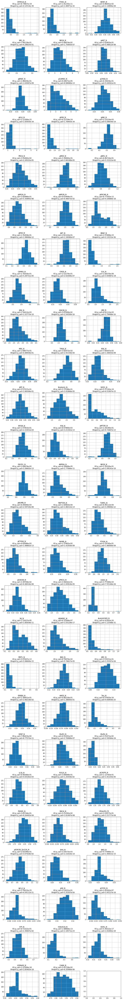

In [ ]:
plot_numerical_histograms(mice_train_df, mice_numeric_columns)

Correction: DYRK1A_N
Correction: ITSN1_N
Correction: BDNF_N
Correction: NR1_N
Correction: NR2A_N
Correction: pAKT_N
Correction: pBRAF_N
Correction: pCAMKII_N
Correction: pCREB_N
Correction: pELK_N
Correction: pERK_N
Correction: pJNK_N
Correction: PKCA_N
Correction: pMEK_N
Correction: pNR1_N
Correction: pNR2A_N
Correction: pNR2B_N
Correction: pPKCAB_N
Correction: pRSK_N
Correction: AKT_N
Correction: BRAF_N
Correction: CAMKII_N
Correction: CREB_N
Correction: ELK_N
Correction: ERK_N
Correction: GSK3B_N
Correction: JNK_N
Correction: MEK_N
Correction: TRKA_N
Correction: RSK_N
Correction: APP_N
Correction: Bcatenin_N
Correction: SOD1_N
Correction: MTOR_N
Correction: P38_N
Correction: pMTOR_N
Correction: DSCR1_N
Correction: AMPKA_N
Correction: NR2B_N
Correction: pNUMB_N
Correction: RAPTOR_N
Correction: TIAM1_N
Correction: pP70S6_N
Correction: NUMB_N
Correction: P70S6_N
Correction: pGSK3B_N
Correction: pPKCG_N
Correction: CDK5_N
Correction: S6_N
Correction: ADARB1_N
Correction: AcetylH3K9_N
Co

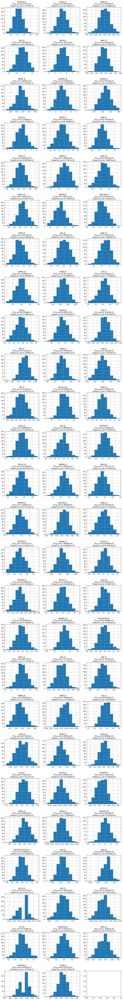

In [ ]:
matched_mice_train_df_X_numerical, train_df_X_normal_mapping = transform_dataset(mice_train_df_X_numerical,\
                                                                                 match_to_normal_distribution,\
                                                                                 correction=correction_func)
plot_numerical_histograms(matched_mice_train_df_X_numerical, mice_numeric_columns)

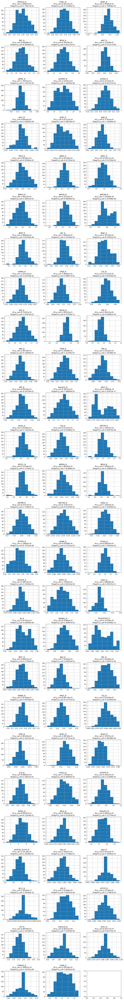

In [ ]:
yeo_mice_train_df_X_numerical, train_df_X_yeo_mapping = transform_dataset(mice_train_df_X_numerical, stats.yeojohnson)
plot_numerical_histograms(yeo_mice_train_df_X_numerical, mice_numeric_columns)

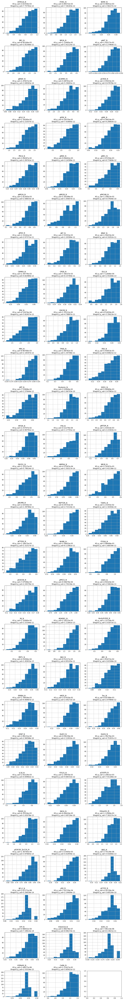

In [ ]:
matched_mice_test_df_X_numerical, _ = transform_dataset(mice_test_df_X_numerical, match_to_normal_distribution, train_df_X_normal_mapping)
plot_numerical_histograms(matched_mice_test_df_X_numerical, mice_numeric_columns)

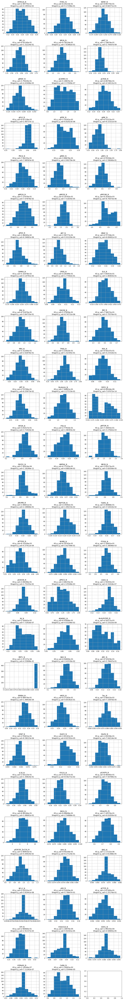

In [ ]:
yeo_mice_test_df_X_numerical, _ = transform_dataset(mice_test_df_X_numerical, stats.yeojohnson, train_df_X_yeo_mapping)
plot_numerical_histograms(yeo_mice_test_df_X_numerical, mice_numeric_columns)

## QQ plots of features

### QQ plots for regular features

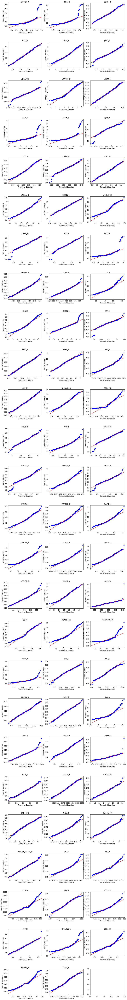

In [ ]:
qq_plot_data(mice_train_df_X, mice_numeric_columns)

### QQ plots for Matched features

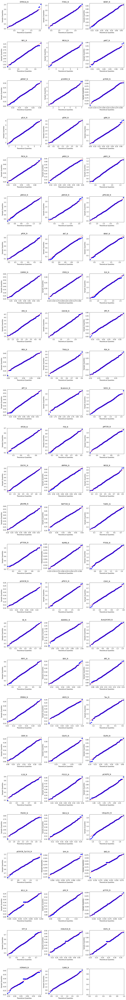

In [ ]:
qq_plot_data(matched_mice_train_df_X_numerical, mice_numeric_columns)

### QQ plots for Yeo-Johnson features

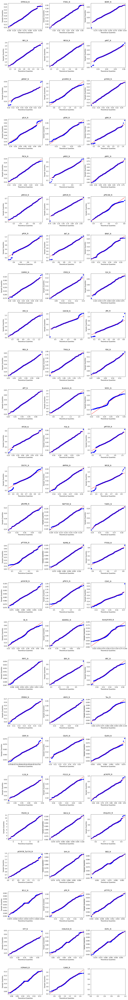

In [ ]:
qq_plot_data(yeo_mice_train_df_X_numerical, mice_numeric_columns)

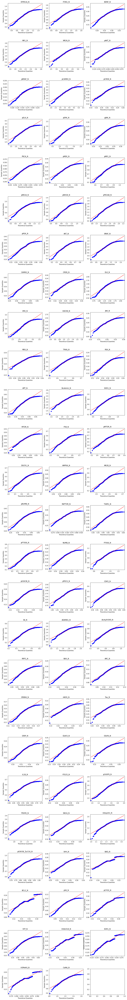

In [ ]:
qq_plot_data(matched_mice_test_df_X_numerical, mice_numeric_columns)

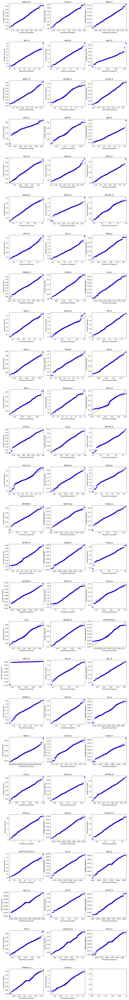

In [ ]:
qq_plot_data(yeo_mice_test_df_X_numerical, mice_numeric_columns)

## Compare model preformance

#### Reassemble datasets

In [ ]:
matched_mice_train_df_X = pd.concat([matched_mice_train_df_X_numerical, mice_train_df_X_categorical], axis=1)
matched_mice_test_df_X = pd.concat([matched_mice_test_df_X_numerical, mice_test_df_X_categorical], axis=1)

yeo_mice_train_df_X = pd.concat([yeo_mice_train_df_X_numerical, mice_train_df_X_categorical], axis=1)
yeo_mice_test_df_X = pd.concat([yeo_mice_test_df_X_numerical, mice_test_df_X_categorical], axis=1)

### Test on regular data

In [ ]:
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
prediction = model.fit(mice_train_df_X,mice_train_df_y).predict(mice_test_df_X)
print(f'acc={accuracy_score(mice_test_df_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mice_test_df_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mice_test_df_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mice_test_df_y, prediction))))

acc=1.0
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.000
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


### Test on matched data

In [ ]:
matched_model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
matched_prediction = matched_model.fit(matched_mice_train_df_X,mice_train_df_y).predict(matched_mice_test_df_X)
print(f'acc={accuracy_score(mice_test_df_y,matched_prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mice_test_df_y,matched_prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mice_test_df_y, matched_prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mice_test_df_y, matched_prediction))))

acc=1.0
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.000
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


### Test on Yeo-Johnson data

In [ ]:
yeo_model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
yeo_prediction = yeo_model.fit(yeo_mice_train_df_X,mice_train_df_y).predict(yeo_mice_test_df_X)
print(f'acc={accuracy_score(mice_test_df_y,yeo_prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mice_test_df_y,yeo_prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mice_test_df_y, yeo_prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mice_test_df_y, yeo_prediction))))

acc=0.9976851851851852
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.002
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


## Try to normalize only 1 column at a time and Compare to regular model

In [ ]:
 compare_one_norm_column(mice_train_df_X, mice_test_df_X, mice_train_df_y,\
                         mice_test_df_y, matched_mice_train_df_X, matched_mice_test_df_X,\
                         yeo_mice_train_df_X, yeo_mice_test_df_X,\
                         'class', mice_numeric_columns,acc=True)

=== Measure for regular model: ===
column=class, acc=1.0
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.000
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0

=== Compare for column DYRK1A_N ===
column=DYRK1A_N, matched acc=1.0
column=DYRK1A_N, yeo acc=1.0

=== Compare for column ITSN1_N ===
column=ITSN1_N, matched acc=1.0
column=ITSN1_N, yeo acc=1.0

=== Compare for column BDNF_N ===
column=BDNF_N, matched acc=1.0
column=BDNF_N, yeo acc=1.0

=== Compare for column NR1_N ===
column=NR1_N, matched acc=1.0
column=NR1_N, yeo acc=1.0

=== Compare for column NR2A_N ===
column=NR2A_N, matched acc=0.9976851851851852
column=NR2A_N, yeo acc=1.0

=== Compare for column pAKT_N ===
column=pAKT_N, matched acc=1.0
column=pAKT_N, yeo acc=1.0

=== Compare for column pBRAF_N ===
column=pBRAF_N, matched acc=1.0
column=pBRAF_N, yeo acc=1.0

=== Compare for column pCAMKII_N ===
column=pCAMKII_N, matched acc=1.0
column=pCAMKII_N, yeo acc=1.0

=== Compare for column 

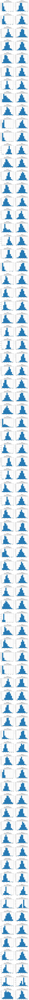

In [ ]:
plot_histograms_side_by_side(mice_train_df_X[mice_numeric_columns], matched_mice_train_df_X[mice_numeric_columns])

## Plot waterfall of each model

In [ ]:
# mice_train_df_X = mice_train_df_X.reset_index()
# mice_test_df_X = mice_test_df_X.reset_index()
# mice_test_df_y = mice_test_df_y.reset_index()

# mice_train_df_X.drop(['index'], inplace=True, axis=1)
# mice_test_df_X.drop(['index'], inplace=True, axis=1)
# mice_test_df_y.drop(['index'], inplace=True, axis=1)

In [ ]:
# prediction = prediction.reshape(-1, 1)

### Plot for regular model

In [ ]:
# plot_waterfall_coeficients(mice_train_df_X, mice_test_df_X, mice_test_df_y, prediction, model, sample_size=500)

### Plot for normalized model

In [ ]:
# plot_waterfall_coeficients(matched_mice_train_df_X, matched_mice_test_df_X, mice_test_df_y, matched_prediction, matched_model, sample_size=500)

### Plot for Yeo-Johnson model

In [ ]:
# plot_waterfall_coeficients(yeo_mice_train_df_X, yeo_mice_test_df_X, mice_test_df_y, yeo_prediction, yeo_model, sample_size=500)

# Try on Sixth Dataset (Classification)

https://www.kaggle.com/iabhishekofficial/mobile-price-classification

## Preprocess Dataset

In [ ]:
!kaggle datasets download -d iabhishekofficial/mobile-price-classification

  0% 0.00/70.6k [00:00<?, ?B/s]
100% 70.6k/70.6k [00:00<00:00, 27.2MB/s]


In [ ]:
# !cp '/content/drive/MyDrive/Colab Notebooks/Tabular DS/mobile_train.csv' -d './mobile_train.csv'
# !cp '/content/drive/MyDrive/Colab Notebooks/Tabular DS/mobile_test.csv' -d './mobile_test.csv'

In [ ]:
!unzip -n mobile-price-classification.zip -d .
!rm -rf ./mobile-price-classification.zip

!mv ./train.csv ./mobile_train.csv
!mv ./test.csv ./mobile_test.csv

Archive:  mobile-price-classification.zip
  inflating: ./test.csv              
  inflating: ./train.csv             


In [ ]:
mobile_df = pd.read_csv('./mobile_train.csv')
mobile_test_df = pd.read_csv('./mobile_test.csv')

In [ ]:
mobile_df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [ ]:
mobile_df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [ ]:
# mobile_numeric_columns = ['battery_power', 'clock_speed', 'int_memory', 'm_dep', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'fc', 'mobile_wt', 'pc']
# mobile_categorical_columns = ['blue', 'dual_sim', 'four_g', 'three_g', 'touch_screen', 'wifi', 'n_cores']

In [ ]:
mobile_numeric_columns, mobile_categorical_columns = get_numeric_categorical_columns(mobile_df, ['price_range'], threshold_prec=5)

column: battery_power, %: 54.7
column: blue, %: 0.1
column: clock_speed, %: 1.3
column: dual_sim, %: 0.1
column: fc, %: 1.0
column: four_g, %: 0.1
column: int_memory, %: 3.15
column: m_dep, %: 0.5
column: mobile_wt, %: 6.05
column: n_cores, %: 0.4
column: pc, %: 1.05
column: px_height, %: 56.85
column: px_width, %: 55.45
column: ram, %: 78.10000000000001
column: sc_h, %: 0.75
column: sc_w, %: 0.95
column: talk_time, %: 0.95
column: three_g, %: 0.1
column: touch_screen, %: 0.1
column: wifi, %: 0.1
numeric_columns = ['battery_power', 'mobile_wt', 'px_height', 'px_width', 'ram']
categorical_columns = ['blue', 'clock_speed', 'dual_sim', 'fc', 'four_g', 'int_memory', 'm_dep', 'n_cores', 'pc', 'sc_h', 'sc_w', 'talk_time', 'three_g', 'touch_screen', 'wifi']


In [ ]:
mobile_train_df, mobile_val_df = train_test_split(mobile_df, test_size=0.15)

print(mobile_train_df.shape)
print(mobile_val_df.shape)

(1700, 21)
(300, 21)


In [ ]:
mobile_train_df_X = mobile_train_df.drop(['price_range'], axis=1)
mobile_val_df_X = mobile_val_df.drop(['price_range'], axis=1)

mobile_train_df_y = mobile_train_df.price_range
mobile_val_df_y = mobile_val_df.price_range

## Visualize Histogram of features

In [ ]:
mobile_train_df_X_categorical = mobile_train_df_X[mobile_categorical_columns]
mobile_val_df_X_categorical = mobile_val_df_X[mobile_categorical_columns]

In [ ]:
mobile_train_df_X_numerical = mobile_train_df_X[mobile_numeric_columns]
mobile_val_df_X_numerical = mobile_val_df_X[mobile_numeric_columns]

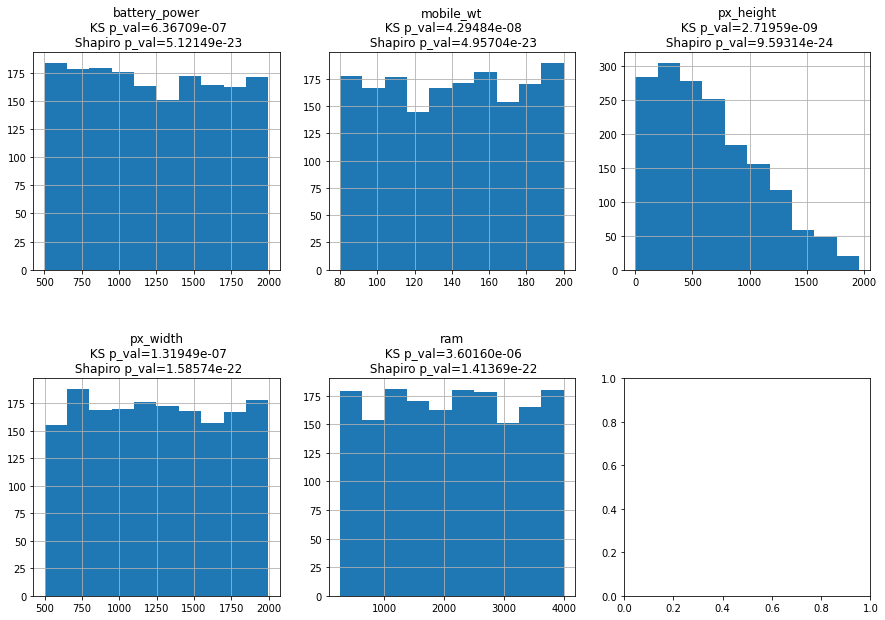

In [ ]:
plot_numerical_histograms(mobile_train_df_X, mobile_numeric_columns)

Correction: battery_power
Correction: mobile_wt
Correction: px_height
Correction: px_width
Correction: ram


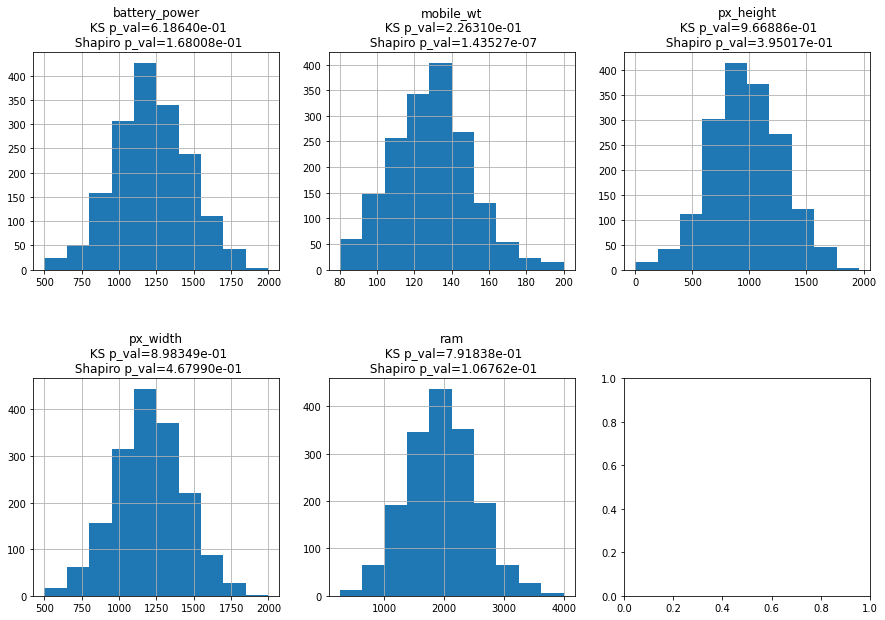

In [ ]:
matched_mobile_train_df_X_numerical, train_df_X_normal_mapping = transform_dataset(mobile_train_df_X_numerical,\
                                                                                   match_to_normal_distribution,\
                                                                                   correction=correction_func)

matched_mobile_train_df_X_numerical_not, train_df_X_normal_mapping_not = transform_dataset(mobile_train_df_X_numerical,\
                                                                                   match_to_normal_distribution)

plot_numerical_histograms(matched_mobile_train_df_X_numerical, mobile_numeric_columns)

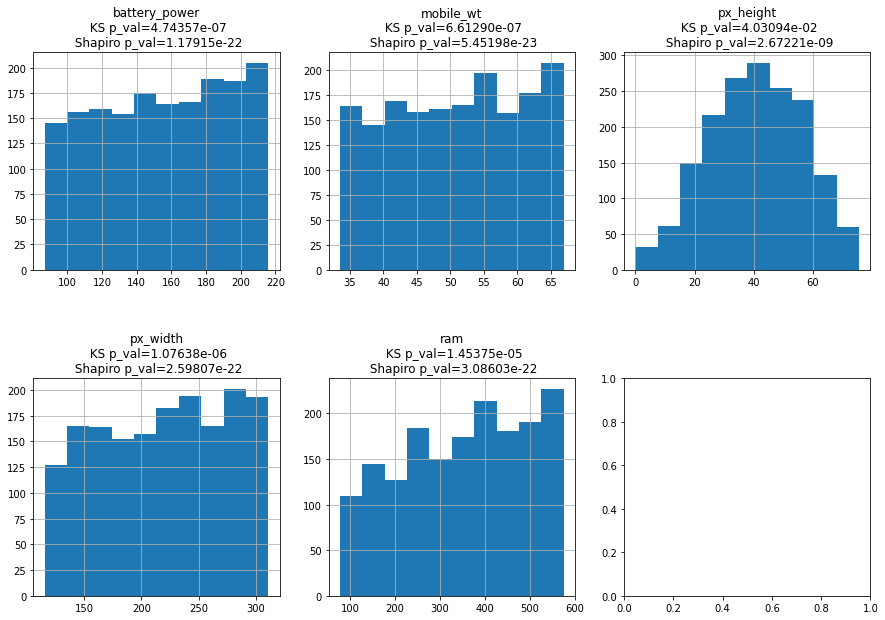

In [ ]:
yeo_mobile_train_df_X_numerical, train_df_X_yeo_mapping = transform_dataset(mobile_train_df_X_numerical, stats.yeojohnson)
plot_numerical_histograms(yeo_mobile_train_df_X_numerical, mobile_numeric_columns)

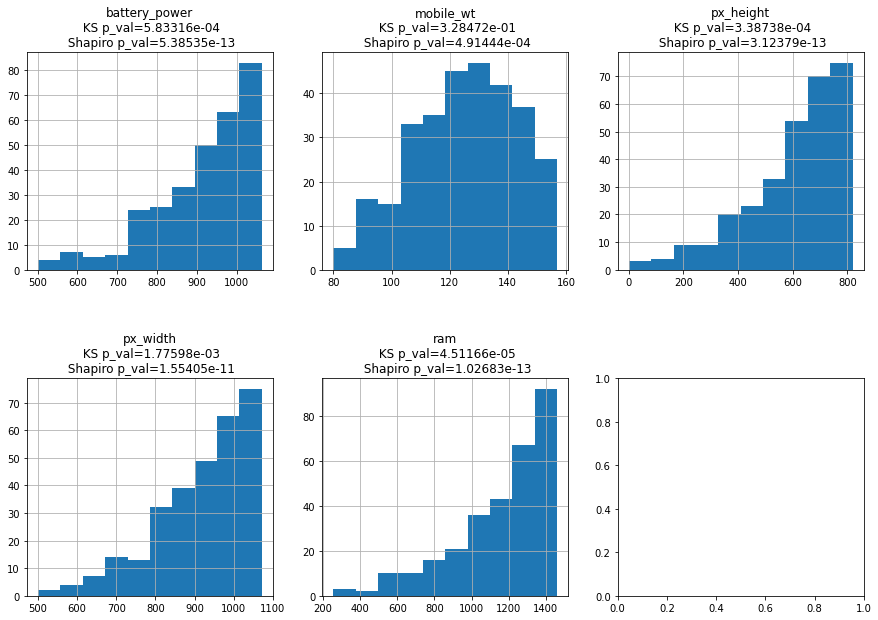

In [ ]:
matched_mobile_val_df_X_numerical, _ = transform_dataset(mobile_val_df_X_numerical, match_to_normal_distribution, train_df_X_normal_mapping)
plot_numerical_histograms(matched_mobile_val_df_X_numerical, mobile_numeric_columns)

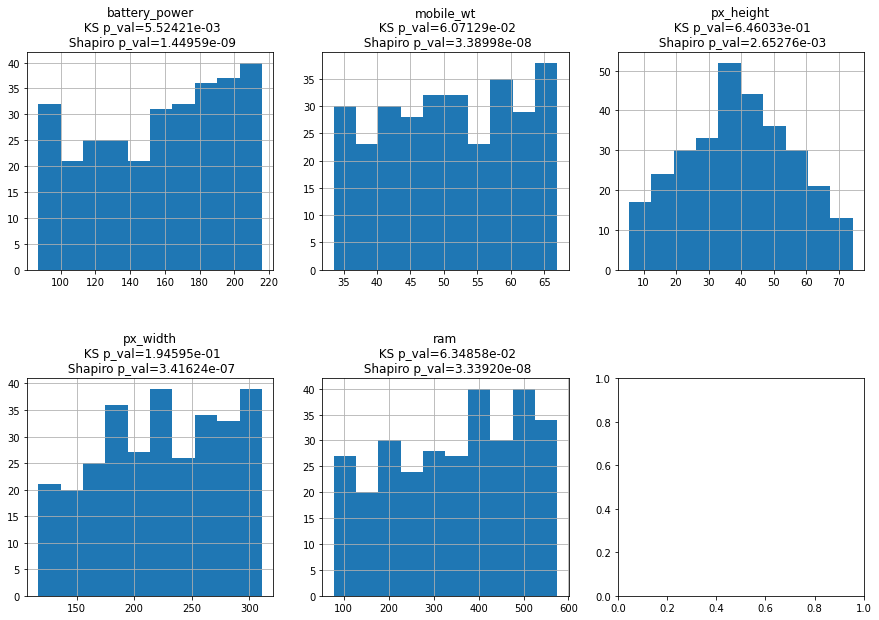

In [ ]:
yeo_mobile_val_df_X_numerical, _ = transform_dataset(mobile_val_df_X_numerical, stats.yeojohnson, train_df_X_yeo_mapping)
plot_numerical_histograms(yeo_mobile_val_df_X_numerical, mobile_numeric_columns)

## QQ plots of features

### QQ plots for regular features

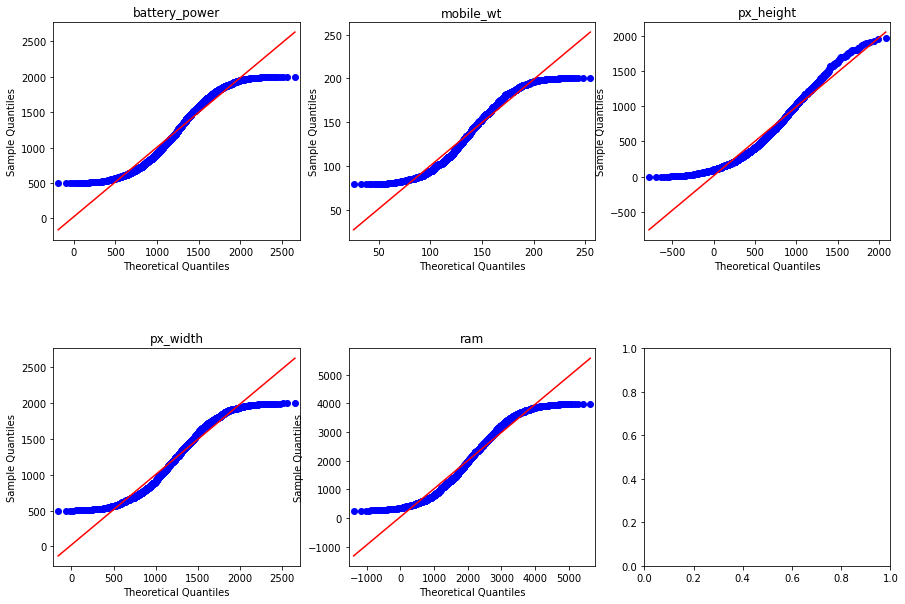

In [ ]:
qq_plot_data(mobile_train_df_X, mobile_numeric_columns)

### QQ plots for Matched features

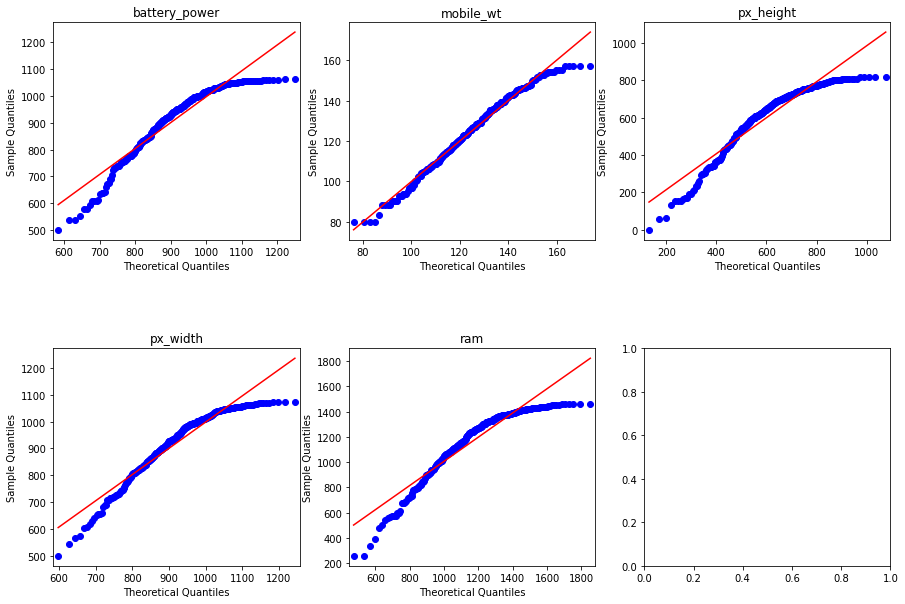

In [ ]:
qq_plot_data(matched_mobile_val_df_X_numerical, mobile_numeric_columns)

### QQ plots for Yeo-Johnson features

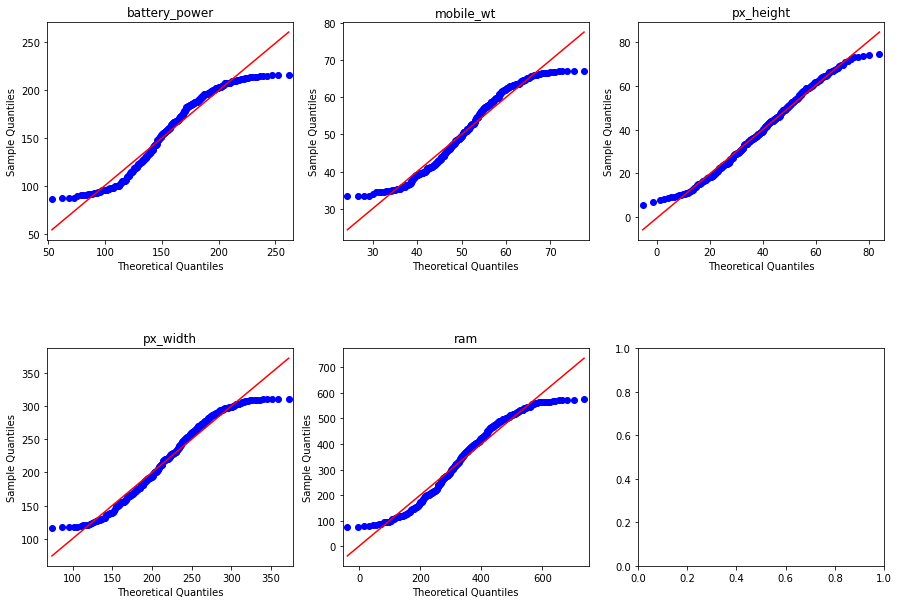

In [ ]:
qq_plot_data(yeo_mobile_val_df_X_numerical, mobile_numeric_columns)

## Compare model preformance

### Reassemble Dataset

In [ ]:
matched_mobile_train_df_X = pd.concat([matched_mobile_train_df_X_numerical, mobile_train_df_X_categorical], axis=1)

matched_mobile_val_df_X = pd.concat([matched_mobile_val_df_X_numerical, mobile_val_df_X_categorical], axis=1)

yeo_mobile_train_df_X = pd.concat([yeo_mobile_train_df_X_numerical, mobile_train_df_X_categorical], axis=1)

yeo_mobile_val_df_X = pd.concat([yeo_mobile_val_df_X_numerical, mobile_val_df_X_categorical], axis=1)

### Test on regular data

In [ ]:
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
prediction = model.fit(mobile_train_df_X,mobile_train_df_y).predict(mobile_val_df_X)
print(f'acc={accuracy_score(mobile_val_df_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mobile_val_df_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mobile_val_df_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mobile_val_df_y, prediction))))

acc=0.6633333333333333
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 210,167,982,610,623.281
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 1


### Test on matched data

In [ ]:
matched_model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
matched_prediction = matched_model.fit(matched_mobile_train_df_X,mobile_train_df_y).predict(matched_mobile_val_df_X)
print(f'acc={accuracy_score(mobile_val_df_y,matched_prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mobile_val_df_y,matched_prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mobile_val_df_y, matched_prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mobile_val_df_y, matched_prediction))))

acc=0.2866666666666667
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.657
Mean Absolute Error (Σ|y - pred|/n): 1
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 2


### Test on Yeo-Johnson data

In [ ]:
yeo_model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
yeo_prediction = yeo_model.fit(yeo_mobile_train_df_X,mobile_train_df_y).predict(yeo_mobile_val_df_X)
print(f'acc={accuracy_score(mobile_val_df_y,yeo_prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mobile_val_df_y,yeo_prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mobile_val_df_y, yeo_prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mobile_val_df_y, yeo_prediction))))

acc=0.66
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 225,179,981,368,524.969
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 1


## Try to normalize only 1 column at a time and Compare to regular model

In [ ]:
compare_one_norm_column(mobile_train_df_X, mobile_val_df_X, mobile_train_df_y, mobile_val_df_y,\
                        matched_mobile_train_df_X, matched_mobile_val_df_X, yeo_mobile_train_df_X,\
                        yeo_mobile_val_df_X, 'price_range', mobile_numeric_columns, acc=True)

=== Measure for regular model: ===
column=price_range, acc=0.6633333333333333
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 210,167,982,610,623.281
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 1

=== Compare for column battery_power ===
column=battery_power, matched acc=0.6733333333333333
column=battery_power, yeo acc=0.6566666666666666

=== Compare for column mobile_wt ===
column=mobile_wt, matched acc=0.7766666666666666
column=mobile_wt, yeo acc=0.71

=== Compare for column px_height ===
column=px_height, matched acc=0.6433333333333333
column=px_height, yeo acc=0.6266666666666667

=== Compare for column px_width ===
column=px_width, matched acc=0.6633333333333333
column=px_width, yeo acc=0.67

=== Compare for column ram ===
column=ram, matched acc=0.31333333333333335
column=ram, yeo acc=0.6033333333333334



## Get insights about the data

In [ ]:
mobile_insights = get_insights(mobile_train_df_X[mobile_numeric_columns])
mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,501,1998,1233.800588,1217.5,437.648136,1.915359e+05,0.054260,-1.214988,6.811006
mobile_wt,80,200,140.234118,141.0,35.398587,1.253060e+03,0.001417,-1.210905,4.760321
px_height,0,1960,649.468235,574.0,441.284448,1.947320e+05,0.643679,-0.346895,6.822789
px_width,500,1998,1247.174706,1244.0,433.046510,1.875293e+05,0.022086,-1.198056,6.786213
ram,256,3998,2127.984118,2140.5,1083.075006,1.173051e+06,0.010456,-1.191007,7.165430


In [ ]:
matched_mobile_insights = get_insights(matched_mobile_train_df_X[mobile_numeric_columns])
matched_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,501.0,1998.0,1215.129697,1207.608441,245.882569,60458.237688,0.008366,-0.099346,6.811006
mobile_wt,80.0,200.0,129.110154,129.017669,21.200597,449.465294,0.249967,0.274657,4.760321
px_height,0.0,1960.0,968.865750,963.636937,308.244769,95014.837642,-0.038111,-0.070918,6.822789
px_width,500.0,1998.0,1202.063328,1205.044110,233.621010,54578.776392,-0.052014,-0.041439,6.786213
ram,256.0,3998.0,1961.047829,1944.507251,578.236574,334357.535662,0.143877,-0.022672,7.165430


In [ ]:
matched_not_mobile_insights = get_insights(matched_mobile_train_df_X_numerical_not[mobile_numeric_columns])
matched_not_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,-127.707764,2848.800762,1220.146583,1220.868373,445.553498,1.985179e+05,-0.010516,0.046458,6.811006
mobile_wt,57.484466,252.279029,140.807923,139.166087,36.137459,1.305916e+03,0.245954,0.058696,4.760321
px_height,-715.849875,2035.441009,656.595063,667.603175,434.567128,1.888486e+05,-0.060510,-0.194132,6.822789
px_width,-29.656287,2771.113678,1245.169187,1258.615577,431.836012,1.864823e+05,-0.015123,0.088452,6.786213
ram,-1828.568454,6537.926941,2101.394591,2068.498479,1056.919528,1.117079e+06,0.066905,0.157752,7.165430


In [ ]:
yeo_mobile_insights = get_insights(yeo_mobile_train_df_X[mobile_numeric_columns])
yeo_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,86.821762,215.934199,154.936449,155.959850,37.346135,1394.733801,-0.101980,-1.186037,6.811006
mobile_wt,33.512952,66.926060,50.916250,51.454062,9.815462,96.343303,-0.078719,-1.198751,4.760321
px_height,0.000000,75.560211,40.725166,41.196351,15.857324,251.454709,-0.115969,-0.651202,6.822789
px_width,115.396891,310.967429,219.170945,221.687375,55.945592,3129.909312,-0.108149,-1.168445,6.786213
ram,76.809148,575.959465,352.580025,364.935907,140.257461,19672.155374,-0.195850,-1.102391,7.165430


In [ ]:
mobile_insights - matched_not_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,628.707764,-850.800762,13.654005,-3.368373,-7.905362,-6982.028383,0.064776,-1.261446,0.0
mobile_wt,22.515534,-52.279029,-0.573806,1.833913,-0.738872,-52.856007,-0.244537,-1.269600,0.0
px_height,715.849875,-75.441009,-7.126827,-93.603175,6.717320,5883.375587,0.704189,-0.152763,0.0
px_width,529.656287,-773.113678,2.005518,-14.615577,1.210499,1046.939399,0.037209,-1.286508,0.0
ram,2084.568454,-2539.926941,26.589527,72.001521,26.155478,55972.579001,-0.056449,-1.348759,0.0


In [ ]:
mobile_insights - matched_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,0.0,0.000000e+00,18.670892,9.891559,191.765568,131077.653659,0.045894,-1.115642,0.0
mobile_wt,0.0,0.000000e+00,11.123964,11.982331,14.197990,803.594636,-0.248549,-1.485562,0.0
px_height,0.0,0.000000e+00,-319.397515,-389.636937,133.039679,99717.126623,0.681790,-0.275976,0.0
px_width,0.0,-2.273737e-13,45.111378,38.955890,199.425500,132950.503839,0.074100,-1.156617,0.0
ram,0.0,0.000000e+00,166.936289,195.992749,504.838432,838693.932597,-0.133421,-1.168335,0.0


In [ ]:
mobile_insights - yeo_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,414.178238,1782.065801,1078.864140,1061.540150,400.302001,1.901412e+05,0.156240,-0.028951,0.0
mobile_wt,46.487048,133.073940,89.317868,89.545938,25.583124,1.156717e+03,0.080136,-0.012154,0.0
px_height,0.000000,1884.439789,608.743069,532.803649,425.427125,1.944805e+05,0.759648,0.304307,0.0
px_width,384.603109,1687.032571,1028.003760,1022.312625,377.100918,1.843994e+05,0.130235,-0.029611,0.0
ram,179.190852,3422.040535,1775.404092,1775.564093,942.817545,1.153379e+06,0.206306,-0.088616,0.0


## Plot distributions

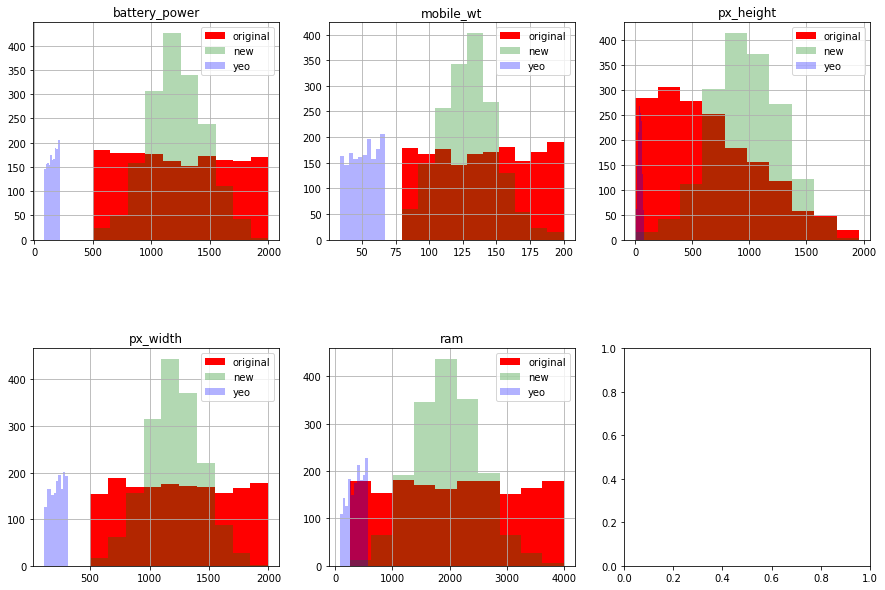

In [ ]:
plot_histograms(mobile_train_df_X[mobile_numeric_columns], 
                matched_mobile_train_df_X[mobile_numeric_columns], 
                yeo_mobile_train_df_X[mobile_numeric_columns])

## Plot a Heatmap of all columns to targets

In [ ]:
matched_mobile_df_corr = pd.concat([matched_mobile_train_df_X, mobile_train_df_y], axis=1)
yeo_mobile_df_corr = pd.concat([yeo_mobile_train_df_X, mobile_train_df_y], axis=1)

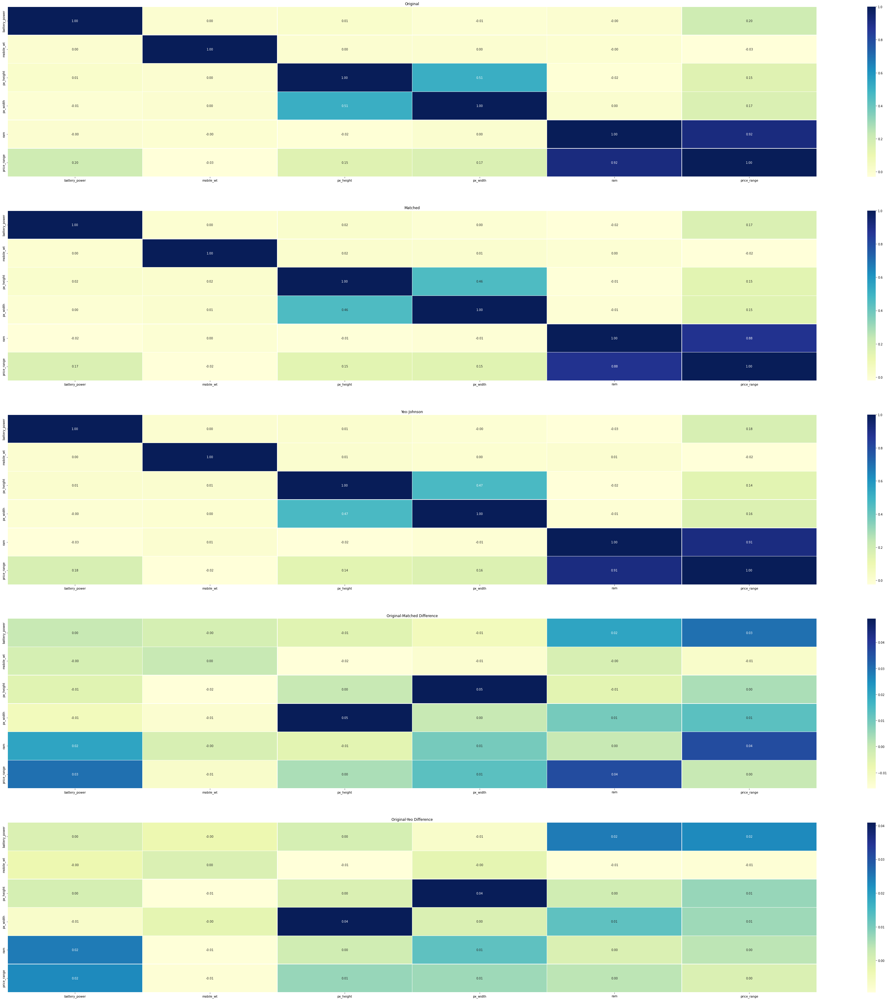

In [ ]:
plot_correlation_heatmaps(mobile_df, matched_mobile_df_corr, yeo_mobile_df_corr, mobile_numeric_columns + ['price_range'])

In [ ]:
for column in mobile_train_df_y.to_frame().columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_mobile_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_mobile_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: price_range ===============
matched corr sum: 2.6580923512026278
yeo corr sum: 2.7041476405374523


In [ ]:
mobile_diff_corr_df = pd.concat([
           matched_mobile_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_mobile_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')

mobile_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
battery_power,1.599187,1.624648
mobile_wt,1.370576,1.331565
px_height,1.982708,1.973108
px_width,1.930749,1.970722
ram,2.228601,2.288847
blue,1.346768,1.342508
clock_speed,1.241451,1.248547
dual_sim,1.379989,1.366862
fc,1.987653,2.007757
four_g,1.946474,1.945917


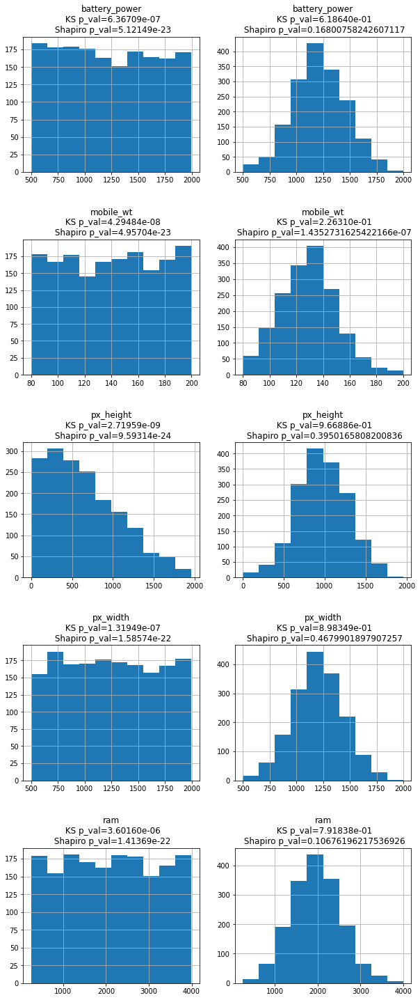

In [ ]:
plot_histograms_side_by_side(mobile_train_df_X[mobile_numeric_columns], matched_mobile_train_df_X[mobile_numeric_columns])